# Detailed Airbnb Price Analysis Project

# **Objective:**

Use the Airbnb data set from Broward County, Florida (scraped in December 2023) to analyze and determine the top three factors that impact the listing price. Additionally, suggest ideas to increase expected revenue and provide justifications for them.

## **Step 1: Importing Necessary Libraries and Mounting Google Drive**







In [1]:
from google.colab import drive
import pandas as pd
import geopandas as gpd
import os

# Mounting Google Drive to access the dataset
drive.mount("/content/drive", force_remount=True)

# Define the mount point for the data
mount_point = '/content/drive/MyDrive/airbnd/airbnb-price-analysis/data'

# Change the current working directory to the specified path
if os.path.exists(mount_point):
    os.chdir(mount_point)
    print(f"Changed current directory to {mount_point}")
else:
    print(f"The directory {mount_point} does not exist in your Google Drive.")

# Define file paths for the data
file_paths = {
    "listings": "listings.csv.gz",
    "calendar": "calendar.csv.gz",
    "reviews": "reviews.csv.gz",
    "listings_summary": "listings.csv",
    "reviews_summary": "reviews.csv",
    "neighbourhoods": "neighbourhoods.csv",
    "neighbourhoods_geojson": "neighbourhoods.geojson"
}

# **Step 2: Loading and Exploring the Data**

# Load files into individual dataframes
listings = pd.read_csv(file_paths["listings"], low_memory=False)
calendar = pd.read_csv(file_paths["calendar"], low_memory=False)
reviews = pd.read_csv(file_paths["reviews"], low_memory=False)
listings_summary = pd.read_csv(file_paths["listings_summary"], low_memory=False)
reviews_summary = pd.read_csv(file_paths["reviews_summary"], low_memory=False)
neighbourhoods = pd.read_csv(file_paths["neighbourhoods"], low_memory=False)
neighbourhoods_geojson = gpd.read_file(file_paths["neighbourhoods_geojson"])

# Display summary and head of each dataframe
dataframes = {
    "listings": listings,
    "calendar": calendar,
    "reviews": reviews,
    "listings_summary": listings_summary,
    "reviews_summary": reviews_summary,
    "neighbourhoods": neighbourhoods,
    "neighbourhoods_geojson": neighbourhoods_geojson
}

for df_name, df in dataframes.items():
    print(f"DataFrame name: {df_name}")
    print(f"Summary of {df_name}:")
    print(df.info())
    print(f"\nFirst 5 rows of {df_name}:")
    print(df.head())
    print("\n")

Mounted at /content/drive
Changed current directory to /content/drive/MyDrive/airbnd/airbnb-price-analysis/data
DataFrame name: listings
Summary of listings:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18230 entries, 0 to 18229
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            18230 non-null  int64  
 1   listing_url                                   18230 non-null  object 
 2   scrape_id                                     18230 non-null  int64  
 3   last_scraped                                  18230 non-null  object 
 4   source                                        18230 non-null  object 
 5   name                                          18230 non-null  object 
 6   description                                   0 non-null      float64
 7   neighborhood_overview                         11081 n

In [8]:
# Function to extract the number of bedrooms
def extract_bedrooms(name):
    match = re.search(r'· (\d+) bedroom', name)
    if match:
        return int(match.group(1))
    else:
        return None

# Apply the function to create the 'bedrooms_name' column
listings['bedrooms_name'] = listings['name'].apply(extract_bedrooms)

# Display the first 10 observations including the new 'bedrooms_name' column
df_with_bedrooms = listings[['beds', 'accommodates', 'name', 'bedrooms_name']].head(10)
print(df_with_bedrooms)

# Print the statistics of the 'bedrooms_name' column
print("\nStatistics of the 'bedrooms_name' column:")
print(listings['bedrooms_name'].describe())

# Display the min and max values
min_bedrooms = listings['bedrooms_name'].min()
max_bedrooms = listings['bedrooms_name'].max()
print(f"\nMinimum number of bedrooms: {min_bedrooms}")
print(f"Maximum number of bedrooms: {max_bedrooms}")

   beds  accommodates                                               name  \
0   2.0             4  Home in Hollywood · ★4.63 · 2 bedrooms · 2 bed...   
1   4.0             6  Rental unit in Hallandale · ★4.0 · 2 bedrooms ...   
2   3.0             5  Rental unit in Dania Beach · ★4.77 · 2 bedroom...   
3   3.0             5  Rental unit in Southwest Ranches · ★5.0 · 3 be...   
4   2.0             5  Condo in Hollywood · ★4.29 · 1 bedroom · 2 bed...   
5   2.0             4  Rental unit in Deerfield Beach · ★4.25 · 1 bed...   
6   7.0            10  Home in Hollywood · ★4.81 · 4 bedrooms · 7 bed...   
7   1.0             5  Rental unit in Hollywood · ★4.93 · 1 bedroom ·...   
8   2.0             3  Rental unit in Dania Beach · ★4.58 · 1 bedroom...   
9   2.0             4  Home in Hollywood · ★4.84 · 2 bedrooms · 2 bed...   

   bedrooms_name  
0            2.0  
1            2.0  
2            2.0  
3            3.0  
4            1.0  
5            1.0  
6            4.0  
7          

In [9]:
df_with_bedrooms

,beds,accommodates,name,bedrooms_name
0,2.0,4,Home in Hollywood · ★4.63 · 2 bedrooms · 2 bed...,2.0
1,4.0,6,Rental unit in Hallandale · ★4.0 · 2 bedrooms ...,2.0
2,3.0,5,Rental unit in Dania Beach · ★4.77 · 2 bedroom...,2.0
3,3.0,5,Rental unit in Southwest Ranches · ★5.0 · 3 be...,3.0
4,2.0,5,Condo in Hollywood · ★4.29 · 1 bedroom · 2 bed...,1.0
5,2.0,4,Rental unit in Deerfield Beach · ★4.25 · 1 bed...,1.0
6,7.0,10,Home in Hollywood · ★4.81 · 4 bedrooms · 7 bed...,4.0
7,1.0,5,Rental unit in Hollywood · ★4.93 · 1 bedroom ·...,1.0
8,2.0,3,Rental unit in Dania Beach · ★4.58 · 1 bedroom...,1.0
9,2.0,4,Home in Hollywood · ★4.84 · 2 bedrooms · 2 bed...,2.0


# **Step 3: Data Cleaning and Preprocessing**

In [19]:

# Remove unnecessary columns from the listings dataframe
columns_to_remove = [
    "listing_url", "scrape_id", "last_scraped", "source", "description",
    "neighborhood_overview", "picture_url", "host_url", "host_about",
    "host_thumbnail_url", "host_picture_url", "host_neighbourhood",
    "neighbourhood", "neighbourhood_group_cleansed", "bathrooms",
    "amenities", "calendar_updated", "calendar_last_scraped",
    "license", "instant_bookable", "host_verifications", "property_type", "name",
    "minimum_minimum_nights", "maximum_minimum_nights", "minimum_maximum_nights",
    "maximum_maximum_nights", "minimum_nights_avg_ntm", "maximum_nights_avg_ntm",
    "calculated_host_listings_count", "calculated_host_listings_count_entire_homes",
    "calculated_host_listings_count_private_rooms", "calculated_host_listings_count_shared_rooms",
    "beds", "accommodates"
]

listings_cleaned = listings.drop(columns=columns_to_remove)

# Replace 'bedrooms' column with 'bedrooms_name' column
listings_cleaned['bedrooms'] = listings['bedrooms_name']
listings_cleaned.drop(columns=['bedrooms_name'], inplace=True)

# Clean the price column by removing dollar signs and converting to numeric
listings_cleaned['price'] = listings_cleaned['price'].replace('[\$,]', '', regex=True).astype(float)

# Extract numeric values from bathrooms_text and create a new bathrooms column
listings_cleaned['bathrooms'] = listings_cleaned['bathrooms_text'].str.extract('(\d+(\.\d+)?)')[0].astype(float)

# Drop the old bathrooms_text column
listings_cleaned.drop(columns=['bathrooms_text'], inplace=True)

# Calculate vacancy and booking rates
listings_cleaned['vacancy_rate_30'] = listings_cleaned['availability_30'] / 30
listings_cleaned['vacancy_rate_60'] = listings_cleaned['availability_60'] / 60
listings_cleaned['vacancy_rate_90'] = listings_cleaned['availability_90'] / 90
listings_cleaned['vacancy_rate_365'] = listings_cleaned['availability_365'] / 365

# Display the first 5 rows of the cleaned dataframe
# Set display options to show all columns
pd.set_option('display.max_columns', None)

# Display the first 5 rows of the listings_cleaned dataframe with all columns
listings_cleaned.head()

,id,host_id,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,bedrooms,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,bathrooms,vacancy_rate_30,vacancy_rate_60,vacancy_rate_90,vacancy_rate_365
0,57818,275948,Von Inc,2010-11-01,"Hollywood, FL",within an hour,100%,96%,t,3.0,3.0,t,t,Hollywood,26.01859,-80.12430,Entire home/apt,2.0,190.0,32,1125,t,2,2,10,214,58,1,0,2013-01-03,2023-03-31,4.63,4.69,4.61,5.00,4.97,4.88,4.71,0.43,1.0,0.066667,0.033333,0.111111,0.586301
1,69824,351303,Tracy,2011-01-17,"Silver Spring, MD",within an hour,100%,50%,f,3.0,5.0,t,t,Hallandale Beach,25.97641,-80.12052,Entire home/apt,2.0,140.0,30,365,t,19,19,19,281,4,2,0,2021-03-27,2023-06-03,4.00,4.50,4.00,4.75,4.75,5.00,4.50,0.12,2.0,0.633333,0.316667,0.211111,0.769863
2,83449,454736,"Jon, Mary Pop Apartments",2011-03-21,"Dania Beach, FL",within an hour,100%,97%,f,17.0,20.0,t,t,Dania Beach,26.03392,-80.14201,Entire home/apt,2.0,127.0,7,180,t,0,1,1,1,31,9,1,2011-11-01,2023-12-17,4.77,4.87,4.84,4.94,4.90,4.81,4.87,0.21,1.0,0.000000,0.016667,0.011111,0.002740
3,105411,532930,Sonia,2011-04-25,"Southwest Ranches, FL",within an hour,80%,57%,f,3.0,3.0,t,t,Southwest Ranches,26.04750,-80.36668,Entire home/apt,3.0,235.0,4,180,t,24,54,84,359,4,0,0,2012-08-06,2018-03-28,5.00,5.00,5.00,5.00,5.00,4.25,5.00,0.03,2.0,0.800000,0.900000,0.933333,0.983562
4,129099,637272,Bianca,2011-05-28,"Buenos Aires, Argentina",a few days or more,36%,18%,f,9.0,19.0,t,t,Hollywood,25.99414,-80.11814,Entire home/apt,1.0,324.0,20,365,t,6,18,29,304,27,0,0,2011-08-23,2022-07-01,4.29,4.42,4.24,4.44,4.32,4.54,4.08,0.18,1.5,0.200000,0.300000,0.322222,0.832877


In [20]:
# Display the count of NA values for each column in the listings_cleaned dataframe
na_counts = listings_cleaned.isna().sum()

# Display columns with their respective NA counts
print("NA values in each column:")
print(na_counts)

# Optionally, you can also display the percentage of NA values for better understanding
na_percentage = (listings_cleaned.isna().sum() / len(listings_cleaned)) * 100
print("\nPercentage of NA values in each column:")
print(na_percentage)


NA values in each column:
id                                0
host_id                           0
host_name                         4
host_since                        4
host_location                  4732
host_response_time             1958
host_response_rate             1958
host_acceptance_rate           1428
host_is_superhost                21
host_listings_count               4
host_total_listings_count         4
host_has_profile_pic              4
host_identity_verified            4
neighbourhood_cleansed            0
latitude                          0
longitude                         0
room_type                         0
bedrooms                       1411
price                           773
minimum_nights                    0
maximum_nights                    0
has_availability                773
availability_30                   0
availability_60                   0
availability_90                   0
availability_365                  0
number_of_reviews                 0
nu

In [21]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer

# Assume listings_cleaned is already defined and the previous steps are done

# Display the initial number of rows
initial_row_count = listings_cleaned.shape[0]

# Remove rows where there are NA values in the 'bedrooms' column
listings_cleaned.dropna(subset=['bedrooms'], inplace=True)

# Calculate the number of rows removed
rows_removed = initial_row_count - listings_cleaned.shape[0]
print(f"Number of rows removed due to NA in 'bedrooms': {rows_removed}")

# Inspect unique values in 'host_response_time'
print("Unique values in 'host_response_time' before cleaning:")
print(listings_cleaned['host_response_time'].unique())

# Remove rows where there are NA values in the 'bathrooms' and 'bedrooms' columns
listings_cleaned.dropna(subset=['bathrooms', 'bedrooms'], inplace=True)

# Drop columns due to too many missing values
columns_to_remove = [
    'host_location', 'has_availability', 'first_review', 'last_review'
]
listings_cleaned.drop(columns=columns_to_remove, inplace=True)

# Set 'host_is_superhost' to 'f' where NA
listings_cleaned['host_is_superhost'].fillna('f', inplace=True)

# Remove rows where there are NA values in the critical columns
listings_cleaned.dropna(subset=['bathrooms', 'bedrooms', 'host_name', 'host_since', 'host_listings_count', 'host_total_listings_count', 'host_has_profile_pic', 'host_identity_verified', 'price'], inplace=True)

# Fill NA values in 'host_response_time', 'host_response_rate', and 'host_acceptance_rate' with 'unreported'
listings_cleaned['host_response_time'].fillna('unreported', inplace=True)
listings_cleaned['host_response_rate'].fillna('unreported', inplace=True)
listings_cleaned['host_acceptance_rate'].fillna('unreported', inplace=True)

# Convert 'host_response_rate' and 'host_acceptance_rate' to numeric where possible, setting errors to 'coerce' to handle 'unreported'
listings_cleaned['host_response_rate'] = pd.to_numeric(listings_cleaned['host_response_rate'].replace('%', '', regex=True), errors='coerce')
listings_cleaned['host_acceptance_rate'] = pd.to_numeric(listings_cleaned['host_acceptance_rate'].replace('%', '', regex=True), errors='coerce')

# Impute review score columns with the mean value
review_score_columns = [
    'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
    'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
    'review_scores_value', 'reviews_per_month'
]

imputer_mean = SimpleImputer(strategy='mean')
listings_cleaned[review_score_columns] = imputer_mean.fit_transform(listings_cleaned[review_score_columns])

# Impute 'host_response_rate' and 'host_acceptance_rate' with the median value
imputer_median = SimpleImputer(strategy='median')
listings_cleaned[['host_response_rate', 'host_acceptance_rate']] = imputer_median.fit_transform(listings_cleaned[['host_response_rate', 'host_acceptance_rate']])

# Display the first 5 rows of the cleaned dataframe
print(listings_cleaned.head())

# Verify that there are no more NA values
print("\nNA values in each column after cleaning:")
print(listings_cleaned.isna().sum())


Number of rows removed due to NA in 'bedrooms': 1411
Unique values in 'host_response_time' before cleaning:
['within an hour' 'a few days or more' nan 'within a few hours'
 'within a day']
       id  host_id                  host_name  host_since  host_response_time  \
0   57818   275948                    Von Inc  2010-11-01      within an hour   
1   69824   351303                      Tracy  2011-01-17      within an hour   
2   83449   454736  Jon,  Mary Pop Apartments  2011-03-21      within an hour   
3  105411   532930                      Sonia  2011-04-25      within an hour   
4  129099   637272                     Bianca  2011-05-28  a few days or more   

   host_response_rate  host_acceptance_rate host_is_superhost  \
0               100.0                  96.0                 t   
1               100.0                  50.0                 f   
2               100.0                  97.0                 f   
3                80.0                  57.0                 f   

In [22]:
# Print unique values for 'host_response_time', 'host_response_rate', and 'host_acceptance_rate'
print("Unique values in 'host_response_time':")
print(listings_cleaned['host_response_time'].unique())

print("\nUnique values in 'host_response_rate':")
print(listings_cleaned['host_response_rate'].unique())

print("\nUnique values in 'host_acceptance_rate':")
print(listings_cleaned['host_acceptance_rate'].unique())

# Print unique values for review scores
review_score_columns = [
    'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
    'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
    'review_scores_value', 'reviews_per_month'
]

for col in review_score_columns:
    print(f"\nUnique values in '{col}':")
    print(listings_cleaned[col].unique())


Unique values in 'host_response_time':
['within an hour' 'a few days or more' 'unreported' 'within a few hours'
 'within a day']

Unique values in 'host_response_rate':
[100.  80.  36.  70.  57.  50.  96.   0.  94.  40.  98.  97.  46.  93.
  83.  33.  99.  86.  90.  95.  25.  88.  17.  67.  78.  92.  75.  32.
  91.  30.  43.  38.  60.  89.  37.  71.  74.  61.  20.  69.  72.  12.
  13.  28.  14.  10.  63.  84.  81.  87.  85.  68.  11.  27.  18.  54.
   7.  56.  58.  31.  73.  76.   9.  77.  22.  29.  65.  64.  55.  82.
  59.  15.]

Unique values in 'host_acceptance_rate':
[ 96.  50.  97.  57.  18.  99.  93.  86. 100.   0.  53.  71.  90.  94.
   8.  82.   9.  87.  67.  79.  63.  39.  17.  98.  89.  85.  60.  80.
  83.  77.  81.  25.  78.  62.  64.  92.  91.  59.  70.  42.  40.  46.
  84.  75.  66.  88.   4.  95.  76.  55.  61.  11.  33.  14.   2.  65.
  47.  20.  54.   5.  44.  72.  56.  74.  28.  35.  21.  22.  73.  43.
  29.  24.  34.  51.  30.  68.  13.  12.  69.   1.  58.  36.  31.  

## **Step 4: Adding Sentiment Analysis for Reviews**

In [23]:
# Install necessary libraries for sentiment analysis
!pip install -q textblob vaderSentiment

from textblob import TextBlob

# Calculate sentiment scores for reviews
def get_sentiment(text):
    return TextBlob(text).sentiment.polarity

reviews['sentiment'] = reviews['comments'].apply(lambda x: get_sentiment(str(x)))

# Merge sentiment scores with listings data
sentiment_by_listing = reviews.groupby('listing_id')['sentiment'].mean().reset_index()
listings_cleaned = listings_cleaned.merge(sentiment_by_listing, left_on='id', right_on='listing_id', how='left')

# Display the reviews dataframe with sentiment scores
reviews.head()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.5 MB/s eta 0:00:00


,listing_id,id,date,reviewer_id,reviewer_name,comments,sentiment
0,57818,3247141,2013-01-03,4203034,Gaurav,It was the first trip to Miami for most of us ...,0.332544
1,57818,3402974,2013-01-23,252741,Karen & Adam,Wonderful! Janice was a pleasure to work with...,0.288095
2,57818,3427358,2013-01-28,4539300,Seth,Janice was a wonderful host. Very accommodati...,0.267857
3,57818,3483222,2013-02-05,2171166,Claude,Janice is an fine host. She was very prompt on...,0.381636
4,57818,3514314,2013-02-11,435179,Sean,"Nice place in an excellent, peaceful and famil...",0.494048


## **Step 5: Correlation Analysis with Price**

In [24]:
# Save the cleaned dataframe to a CSV file
# listings_cleaned.to_csv('/content/drive/MyDrive/airbnd/airbnb-price-analysis/data/listings_cleaned_updated_bedrooms.csv', index=False)


In [42]:
# Load the cleaned dataframe from the CSV file
# listings_cleaned = pd.read_csv('/content/drive/MyDrive/airbnd/airbnb-price-analysis/data/listings_cleaned.csv')
listings_cleaned.to_csv('/content/drive/MyDrive/airbnd/airbnb-price-analysis/data/listings_cleaned_updated_bedrooms.csv', index=False)
listings_cleaned.head()


,id,host_id,host_name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,bedrooms,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,bathrooms,vacancy_rate_30,vacancy_rate_60,vacancy_rate_90,vacancy_rate_365,listing_id,sentiment,sub_review_average
0,57818,275948,Von Inc,2010-11-01,within an hour,100.0,96.0,t,3.0,3.0,t,t,Hollywood,26.01859,-80.12430,Entire home/apt,2.0,190.0,32,1125,2,2,10,214,58,1,0,4.63,4.69,4.61,5.00,4.97,4.88,4.71,0.43,1.0,0.066667,0.033333,0.111111,0.586301,57818.0,0.374216,4.784286
1,69824,351303,Tracy,2011-01-17,within an hour,100.0,50.0,f,3.0,5.0,t,t,Hallandale Beach,25.97641,-80.12052,Entire home/apt,2.0,140.0,30,365,19,19,19,281,4,2,0,4.00,4.50,4.00,4.75,4.75,5.00,4.50,0.12,2.0,0.633333,0.316667,0.211111,0.769863,69824.0,0.190601,4.500000
2,83449,454736,"Jon, Mary Pop Apartments",2011-03-21,within an hour,100.0,97.0,f,17.0,20.0,t,t,Dania Beach,26.03392,-80.14201,Entire home/apt,2.0,127.0,7,180,0,1,1,1,31,9,1,4.77,4.87,4.84,4.94,4.90,4.81,4.87,0.21,1.0,0.000000,0.016667,0.011111,0.002740,83449.0,0.392146,4.857143
3,105411,532930,Sonia,2011-04-25,within an hour,80.0,57.0,f,3.0,3.0,t,t,Southwest Ranches,26.04750,-80.36668,Entire home/apt,3.0,235.0,4,180,24,54,84,359,4,0,0,5.00,5.00,5.00,5.00,5.00,4.25,5.00,0.03,2.0,0.800000,0.900000,0.933333,0.983562,105411.0,0.184327,4.892857
4,129099,637272,Bianca,2011-05-28,a few days or more,36.0,18.0,f,9.0,19.0,t,t,Hollywood,25.99414,-80.11814,Entire home/apt,1.0,324.0,20,365,6,18,29,304,27,0,0,4.29,4.42,4.24,4.44,4.32,4.54,4.08,0.18,1.5,0.200000,0.300000,0.322222,0.832877,129099.0,0.374725,4.332857


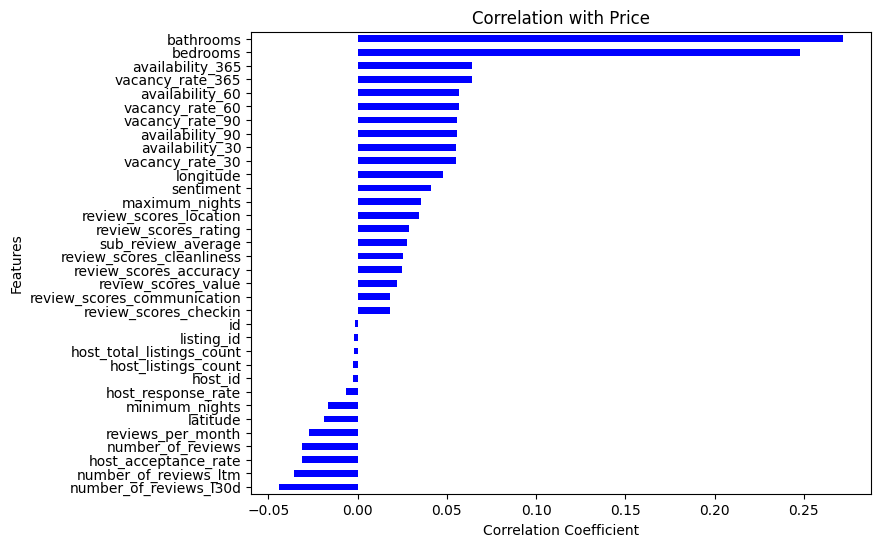

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix for only numeric columns
correlation_matrix = listings_cleaned.select_dtypes(include='number').corr()

# Display the correlation matrix for price with other numerical columns as a bar plot
plt.figure(figsize=(8, 6))
correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='blue')
plt.title('Correlation with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()


## **Step 6: Reducing More Unnecessary Features**

There are some features that are capturing the same concepts. We remove those and proceed with splitting our data, and hyperparameter tuning.

First 5 rows of the modified dataframe:
                   host_name  host_since  host_response_time  \
0                    Von Inc  2010-11-01      within an hour   
1                      Tracy  2011-01-17      within an hour   
2  Jon,  Mary Pop Apartments  2011-03-21      within an hour   
3                      Sonia  2011-04-25      within an hour   
4                     Bianca  2011-05-28  a few days or more   

   host_response_rate  host_acceptance_rate host_is_superhost  \
0               100.0                  96.0                 t   
1               100.0                  50.0                 f   
2               100.0                  97.0                 f   
3                80.0                  57.0                 f   
4                36.0                  18.0                 f   

   host_listings_count host_has_profile_pic host_identity_verified  \
0                  3.0                    t                      t   
1                  3.0                    t 

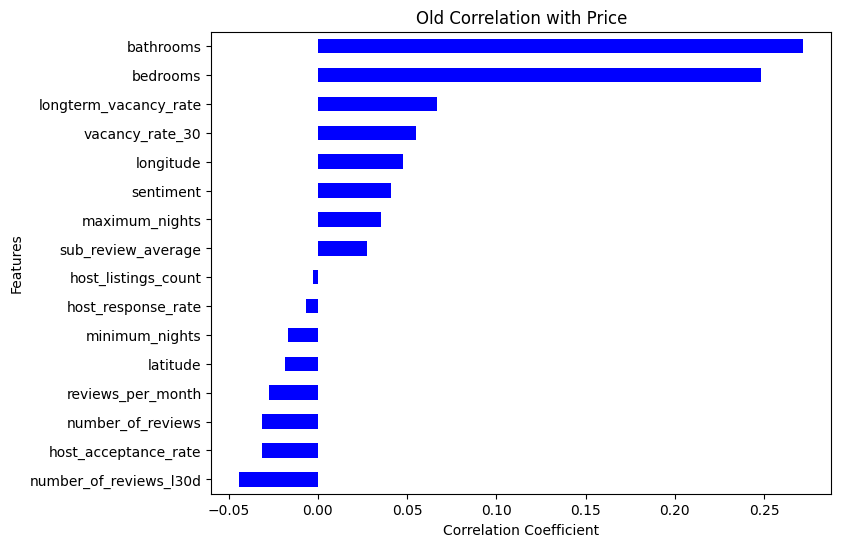

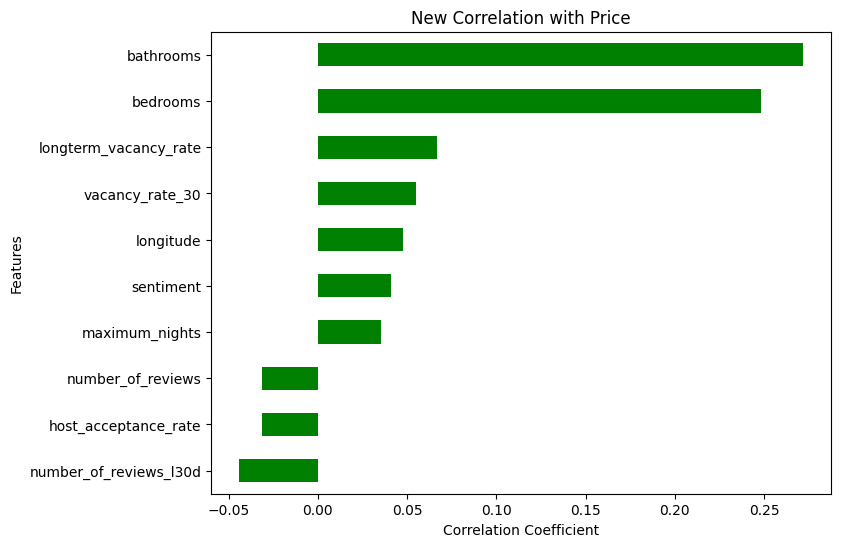

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate the average sub-review score
sub_review_columns = [
    'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
    'review_scores_communication', 'review_scores_location', 'review_scores_value', 'review_scores_rating'
]
listings_cleaned['sub_review_average'] = listings_cleaned[sub_review_columns].mean(axis=1)

# Drop the individual sub-review score columns
listings_cleaned_reduced = listings_cleaned.drop(columns=sub_review_columns)

# Calculate the long-term vacancy rate
vacancy_rate_columns = [
    'vacancy_rate_365', 'vacancy_rate_60', 'vacancy_rate_90'
]
listings_cleaned_reduced['longterm_vacancy_rate'] = listings_cleaned_reduced[vacancy_rate_columns].mean(axis=1)

# Drop the individual vacancy rate columns
listings_cleaned_reduced = listings_cleaned_reduced.drop(columns=vacancy_rate_columns)

# Define additional columns to remove
additional_columns_to_remove = [
    "id", "listing_id", "host_total_listings_count", "availability_60",
    "availability_30", "availability_90", "availability_365", "number_of_reviews_ltm", "host_id"
]

# Only drop columns that exist in the DataFrame
existing_columns_to_remove = [col for col in additional_columns_to_remove if col in listings_cleaned_reduced.columns]

# Drop the existing columns
listings_cleaned_reduced = listings_cleaned_reduced.drop(columns=existing_columns_to_remove)

# Display the first 5 rows of the modified dataframe
print("First 5 rows of the modified dataframe:")
print(listings_cleaned_reduced.head())

# Calculate the old correlation matrix for only numeric columns
old_correlation_matrix = listings_cleaned_reduced.select_dtypes(include='number').corr()

# Set a threshold for correlation coefficient
correlation_threshold = 0.03

# Select features with absolute correlation above the threshold
important_features = old_correlation_matrix['price'].abs().loc[old_correlation_matrix['price'].abs() > correlation_threshold].index

# Identify and print the features that were removed
removed_features = [feature for feature in listings_cleaned_reduced.columns if feature not in important_features]
print("Features removed due to low correlation with price:")
print(removed_features)

# Reduce the dataframe to these important features
listings_cleaned_reduced = listings_cleaned_reduced[important_features]

# Display the remaining features
print("Remaining features after correlation-based feature selection:")
print(listings_cleaned_reduced.columns)

# Calculate the new correlation matrix for only numeric columns
new_correlation_matrix = listings_cleaned_reduced.select_dtypes(include='number').corr()

# Print the old and new correlation matrices
print("\nOld Correlation Matrix:")
print(old_correlation_matrix)

print("\nNew Correlation Matrix:")
print(new_correlation_matrix)

# Display the correlation matrix for price with other numerical columns as a bar plot
plt.figure(figsize=(8, 6))
old_correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='blue')
plt.title('Old Correlation with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()

plt.figure(figsize=(8, 6))
new_correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='green')
plt.title('New Correlation with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()


First 5 rows of the modified dataframe:
                   host_name  host_since  host_response_time  \
0                    Von Inc  2010-11-01      within an hour   
1                      Tracy  2011-01-17      within an hour   
2  Jon,  Mary Pop Apartments  2011-03-21      within an hour   
3                      Sonia  2011-04-25      within an hour   
4                     Bianca  2011-05-28  a few days or more   

   host_response_rate host_is_superhost  host_listings_count  \
0               100.0                 t                  3.0   
1               100.0                 f                  3.0   
2               100.0                 f                 17.0   
3                80.0                 f                  3.0   
4                36.0                 f                  9.0   

  host_has_profile_pic host_identity_verified neighbourhood_cleansed  \
0                    t                      t              Hollywood   
1                    t                      t 

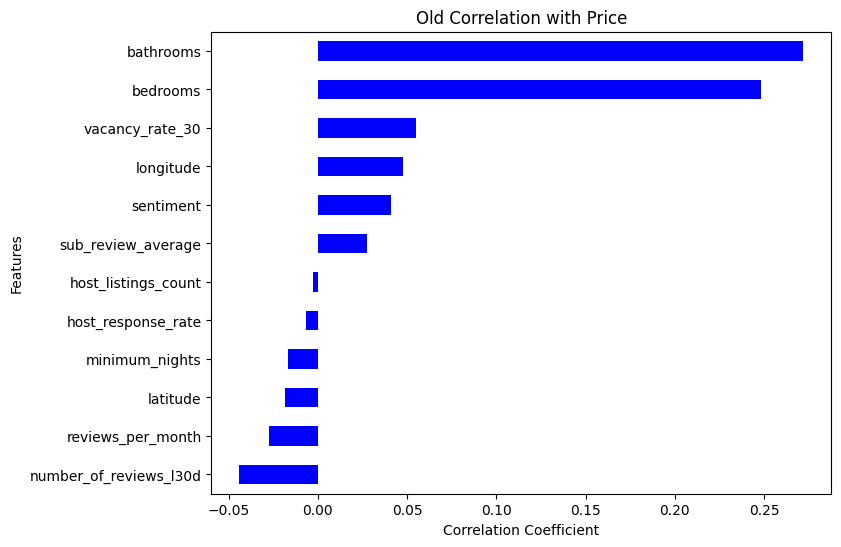

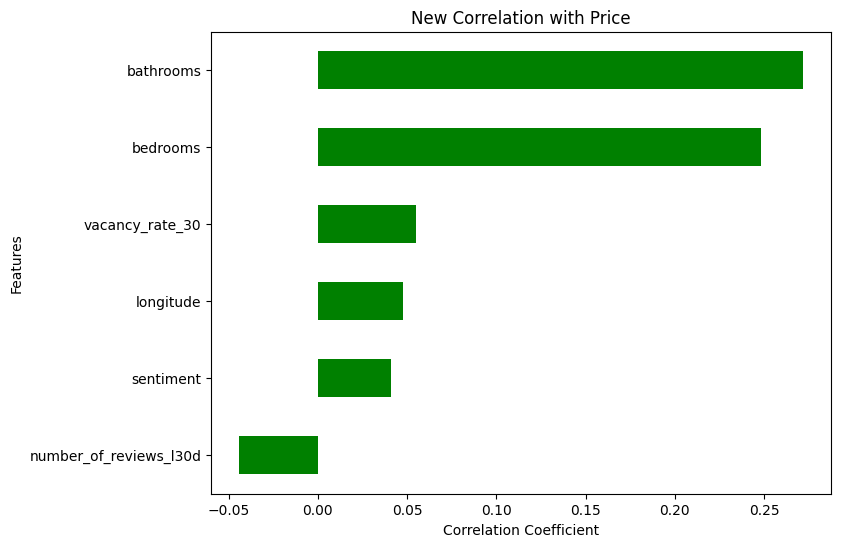

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate the average sub-review score
sub_review_columns = [
    'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
    'review_scores_communication', 'review_scores_location', 'review_scores_value', 'review_scores_rating'
]
listings_cleaned['sub_review_average'] = listings_cleaned[sub_review_columns].mean(axis=1)

# Drop the individual sub-review score columns
listings_cleaned_reduced = listings_cleaned.drop(columns=sub_review_columns)

# Calculate the long-term vacancy rate
vacancy_rate_columns = [
    'vacancy_rate_365', 'vacancy_rate_60', 'vacancy_rate_90'
]
listings_cleaned_reduced['longterm_vacancy_rate'] = listings_cleaned_reduced[vacancy_rate_columns].mean(axis=1)

# Drop the individual vacancy rate columns
listings_cleaned_reduced = listings_cleaned_reduced.drop(columns=vacancy_rate_columns)

# Define additional columns to remove
additional_columns_to_remove = [
    "id", "listing_id", "host_total_listings_count", "availability_60",
    "availability_30", "availability_90", "availability_365", "number_of_reviews_ltm", "host_id",
    "host_acceptance_rate", "maximum_nights", "longterm_vacancy_rate", "number_of_reviews"
]

# Only drop columns that exist in the DataFrame
existing_columns_to_remove = [col for col in additional_columns_to_remove if col in listings_cleaned_reduced.columns]

# Drop the existing columns
listings_cleaned_reduced = listings_cleaned_reduced.drop(columns=existing_columns_to_remove)

# Display the first 5 rows of the modified dataframe
print("First 5 rows of the modified dataframe:")
print(listings_cleaned_reduced.head())

# Calculate the old correlation matrix for only numeric columns
old_correlation_matrix = listings_cleaned_reduced.select_dtypes(include='number').corr()

# Set a threshold for correlation coefficient
correlation_threshold = 0.03

# Select features with absolute correlation above the threshold
important_features = old_correlation_matrix['price'].abs().loc[old_correlation_matrix['price'].abs() > correlation_threshold].index

# Identify and print the features that were removed
removed_features = [feature for feature in listings_cleaned_reduced.columns if feature not in important_features]
print("Features removed due to low correlation with price:")
print(removed_features)

# Reduce the dataframe to these important features
listings_cleaned_reduced = listings_cleaned_reduced[important_features]

# Display the remaining features
print("Remaining features after correlation-based feature selection:")
print(listings_cleaned_reduced.columns)

# Calculate the new correlation matrix for only numeric columns
new_correlation_matrix = listings_cleaned_reduced.select_dtypes(include='number').corr()

# Print the old and new correlation matrices
print("\nOld Correlation Matrix:")
print(old_correlation_matrix)

print("\nNew Correlation Matrix:")
print(new_correlation_matrix)

# Display the correlation matrix for price with other numerical columns as a bar plot
plt.figure(figsize=(8, 6))
old_correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='blue')
plt.title('Old Correlation with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()

plt.figure(figsize=(8, 6))
new_correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='green')
plt.title('New Correlation with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()


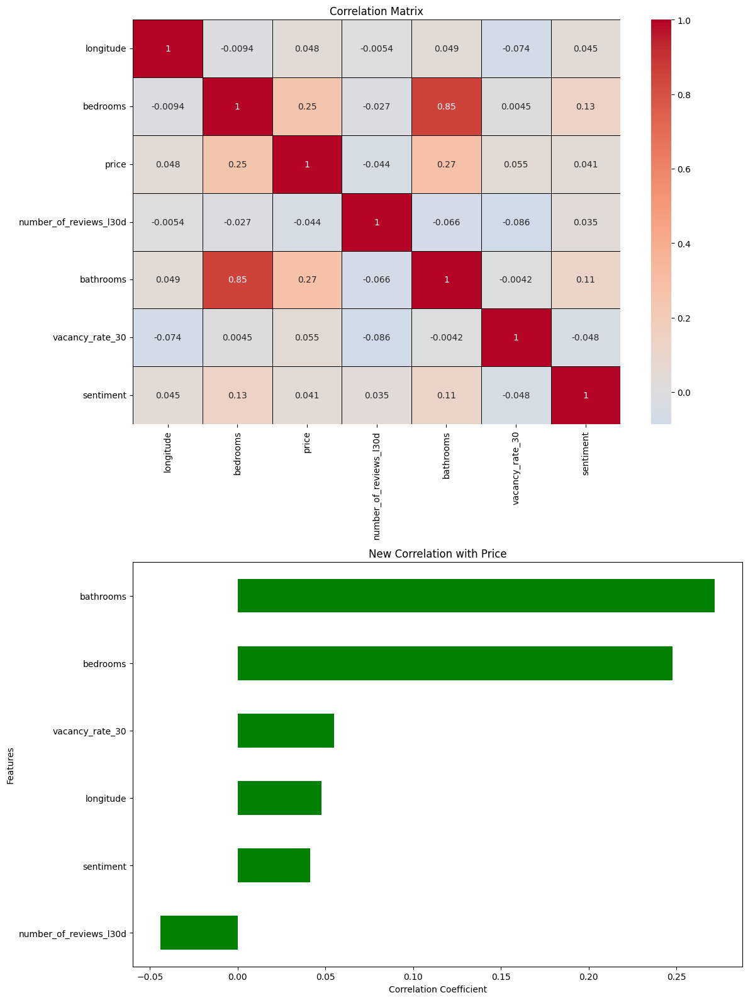

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with two subplots
fig, axs = plt.subplots(2, 1, figsize=(12, 16))

# Plotting the correlation matrix heatmap on the first subplot
sns.heatmap(new_correlation_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5, linecolor='black', ax=axs[0])
axs[0].set_title('Correlation Matrix')

# Plotting the new correlation with price on the second subplot
new_correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='green', ax=axs[1])
axs[1].set_title('New Correlation with Price')
axs[1].set_xlabel('Correlation Coefficient')
axs[1].set_ylabel('Features')

# Adjust layout for better display
plt.tight_layout()
plt.show()


In [95]:
listings_cleaned_reduced.head()

,host_acceptance_rate,latitude,longitude,accommodates,beds,price,minimum_nights,maximum_nights,number_of_reviews,number_of_reviews_l30d,reviews_per_month,bathrooms,vacancy_rate_30,sentiment,sub_review_average,longterm_vacancy_rate
0,96.0,26.01859,-80.12430,4,2.0,190.0,32,1125,58,0,0.43,1.0,0.066667,0.374216,4.784286,0.243582
1,50.0,25.97641,-80.12052,6,4.0,140.0,30,365,4,0,0.12,2.0,0.633333,0.190601,4.500000,0.432547
2,97.0,26.03392,-80.14201,5,3.0,127.0,7,180,31,1,0.21,1.0,0.000000,0.392146,4.857143,0.010173
3,57.0,26.04750,-80.36668,5,3.0,235.0,4,180,4,0,0.03,2.0,0.800000,0.184327,4.892857,0.938965
4,18.0,25.99414,-80.11814,5,2.0,324.0,20,365,27,0,0.18,1.5,0.200000,0.374725,4.332857,0.485033




# Step 7: Splitting Data and Applying Preprocessing**

In [48]:

# Display the first few rows of the DataFrame
print("First few rows of the DataFrame:")
print(listings_cleaned_reduced.head())

# Display the DataFrame information to check for missing values and data types
print("\nDataFrame Info:")
print(listings_cleaned_reduced.info())

# Check for NaN values in the DataFrame
print("\nChecking for NaN values in each column:")
print(listings_cleaned_reduced.isna().sum())

# Ensure there are no unexpected missing values in the critical columns
critical_columns = ['price', 'bathrooms', 'bedrooms']
missing_critical = listings_cleaned_reduced[critical_columns].isna().sum()
print("\nMissing values in critical columns:")
print(missing_critical)

# Drop rows with NaN values in critical columns if necessary
if missing_critical.sum() > 0:
    listings_cleaned_reduced.dropna(subset=critical_columns, inplace=True)
    print(f"\nDropped rows with missing values in critical columns. Remaining rows: {listings_cleaned_reduced.shape[0]}")

# Define the features and target variable
features = listings_cleaned_reduced.drop(columns=['price'])
target = listings_cleaned_reduced['price']

# Drop rows with NaN values in the target variable
features = features[target.notna()]
target = target.dropna()

# Identify numeric and categorical columns
numeric_features = features.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = features.select_dtypes(include=[object, 'category']).columns.tolist()

# Display identified numeric and categorical features
print("\nIdentified Numeric Features:")
print(numeric_features)
print("\nIdentified Categorical Features:")
print(categorical_features)

# If no categorical features exist, set the categorical transformer to None
if not categorical_features:
    categorical_transformer = 'drop'
else:
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

# Preprocessing for numeric data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Apply preprocessing
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Check if preprocessor is fitted
print("\nCheck if preprocessor is fitted:")
print(preprocessor.named_transformers_['cat'])

# Extract feature names from the preprocessor
if categorical_features:
    onehot_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features)
else:
    onehot_feature_names = []

all_feature_names = numeric_features + list(onehot_feature_names)

# Convert the training and testing features to DataFrames for better readability
X_train_df = pd.DataFrame(X_train, columns=all_feature_names)
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)

# Display the shape of the split data
print("\nTraining and Testing Data Shapes:")
print("Training Features Shape:", X_train.shape)
print("Testing Features Shape:", X_test.shape)
print("Training Target Shape:", y_train.shape)
print("Testing Target Shape:", y_test.shape)

# Function to display number of rows assigned for each column in training and testing sets
def display_column_row_assignment(df_train, df_test, df_name_train, df_name_test):
    assignment = []
    for col in df_train.columns:
        train_count = df_train[col].notna().sum()
        test_count = df_test[col].notna().sum()
        assignment.append({
            'Column': col,
            'Number of Rows Assigned (Training)': train_count,
            'Number of Rows Assigned (Testing)': test_count
        })
    assignment_df = pd.DataFrame(assignment)
    print(f"\nNumber of Rows Assigned for {df_name_train} and {df_name_test}:\n")
    display(assignment_df)

# Display number of rows assigned for training and testing features
display_column_row_assignment(X_train_df, X_test_df, "Training Features", "Testing Features")

First few rows of the DataFrame:
   longitude  bedrooms  price  number_of_reviews_l30d  bathrooms  \
0  -80.12430       2.0  190.0                       0        1.0   
1  -80.12052       2.0  140.0                       0        2.0   
2  -80.14201       2.0  127.0                       1        1.0   
3  -80.36668       3.0  235.0                       0        2.0   
4  -80.11814       1.0  324.0                       0        1.5   

   vacancy_rate_30  sentiment  
0         0.066667   0.374216  
1         0.633333   0.190601  
2         0.000000   0.392146  
3         0.800000   0.184327  
4         0.200000   0.374725  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16073 entries, 0 to 16072
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   longitude               16073 non-null  float64
 1   bedrooms                16073 non-null  float64
 2   price                   

,Column,Number of Rows Assigned (Training),Number of Rows Assigned (Testing)
0,longitude,12858,3215
1,bedrooms,12858,3215
2,number_of_reviews_l30d,12858,3215
3,bathrooms,12858,3215
4,vacancy_rate_30,12858,3215
5,sentiment,12858,3215


## **Step 8: Training and Evaluating Random Forest Model (Without Hyperparameter Tuning)**

Random Forest MSE: 278330.4524855682
Random Forest RMSE: 527.570329421176
Random Forest MAE: 173.3595012666097
Random Forest R^2: 0.3238579779565053


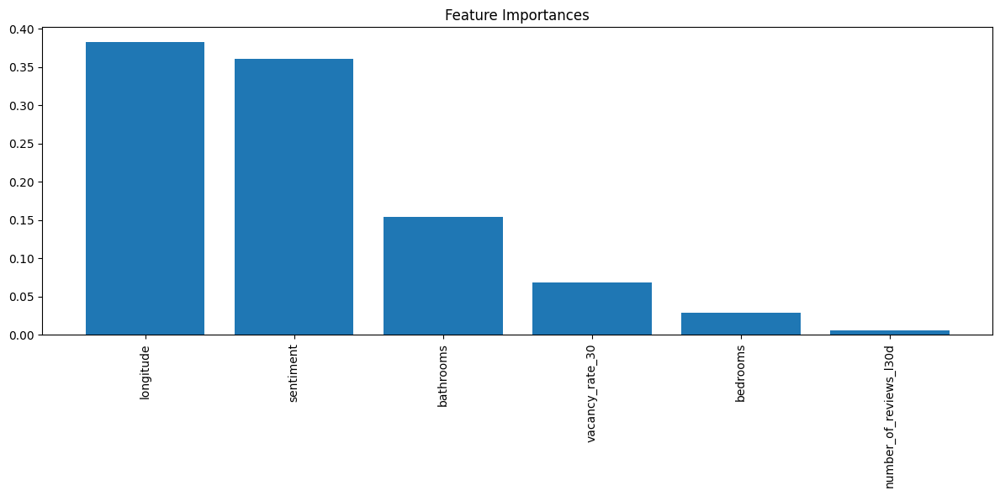

In [49]:
# **Step 8: Training and Evaluating Random Forest Model (Without Hyperparameter Tuning)**

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Train the Random Forest model without hyperparameter tuning
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


Random Forest MSE: 293379.73844501376
Random Forest RMSE: 541.6453991727556
Random Forest MAE: 151.9011641075478
Random Forest R^2: 0.11138611098895579


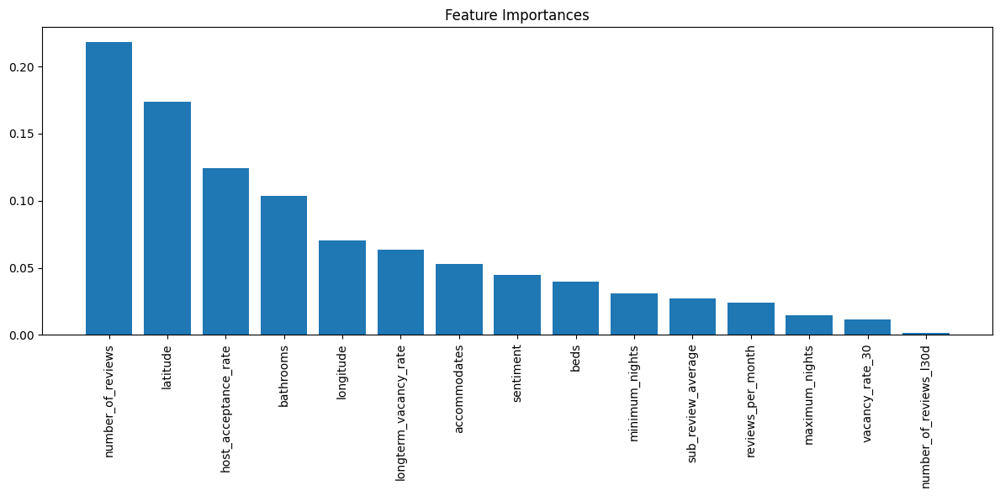

In [108]:
# **Step 8: Training and Evaluating Random Forest Model (Without Hyperparameter Tuning)**

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Train the Random Forest model without hyperparameter tuning
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


## **Step 9: Training and Evaluating Neural Network Model (Without Hyperparameter Tuning)**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Define the Neural Network model
def create_model():
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Create the model
nn_model = create_model()

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network MSE: {mse_nn}')
print(f'Neural Network RMSE: {rmse_nn}')
print(f'Neural Network MAE: {mae_nn}')
print(f'Neural Network R^2: {r2_nn}')

# Compute feature importance using permutation importance
results = permutation_importance(nn_model, X_test, y_test, n_repeats=10, random_state=42, scoring='neg_mean_squared_error')

# Plot feature importances
sorted_idx = results.importances_mean.argsort()

plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), results.importances_mean[sorted_idx], align="center")
plt.yticks(range(len(sorted_idx)), [all_feature_names[i] for i in sorted_idx])
plt.xlabel("Permutation Importance")
plt.title("Feature Importance for Neural Network")
plt.tight_layout()
plt.show()


Epoch 1/50
322/322 [==============================] - 8s 6ms/step - loss: 1411278.7500 - mae: 324.8761 - val_loss: 453881.6875 - val_mae: 224.6972
Epoch 2/50
322/322 [==============================] - 2s 5ms/step - loss: 1257866.1250 - mae: 192.1563 - val_loss: 380691.7188 - val_mae: 196.7207
Epoch 3/50
322/322 [==============================] - 2s 5ms/step - loss: 1242957.5000 - mae: 192.7756 - val_loss: 374406.5938 - val_mae: 204.2826
Epoch 4/50
322/322 [==============================] - 1s 3ms/step - loss: 1241711.1250 - mae: 198.0557 - val_loss: 374874.4062 - val_mae: 200.4388
Epoch 5/50
322/322 [==============================] - 1s 3ms/step - loss: 1240775.2500 - mae: 195.8782 - val_loss: 373889.2812 - val_mae: 201.9109
Epoch 6/50
322/322 [==============================] - 1s 4ms/step - loss: 1240186.5000 - mae: 197.8318 - val_loss: 374008.8125 - val_mae: 200.6599
Epoch 7/50
322/322 [==============================] - 1s 3ms/step - loss: 1239385.0000 - mae: 194.9775 - val_loss: 372

Epoch 1/50
343/343 [==============================] - 4s 4ms/step - loss: 1294083.1250 - mae: 291.5377 - val_loss: 535022.5000 - val_mae: 188.1077
Epoch 2/50
343/343 [==============================] - 2s 5ms/step - loss: 1157084.0000 - mae: 184.4606 - val_loss: 520530.0000 - val_mae: 199.4107
Epoch 3/50
343/343 [==============================] - 2s 5ms/step - loss: 1151100.6250 - mae: 185.8041 - val_loss: 518033.6250 - val_mae: 205.8635
Epoch 4/50
343/343 [==============================] - 1s 3ms/step - loss: 1147834.0000 - mae: 190.9396 - val_loss: 515765.2812 - val_mae: 200.8970
Epoch 5/50
343/343 [==============================] - 1s 4ms/step - loss: 1144958.3750 - mae: 189.1578 - val_loss: 515614.9688 - val_mae: 203.7111
Epoch 6/50
343/343 [==============================] - 1s 3ms/step - loss: 1142864.6250 - mae: 190.4304 - val_loss: 514119.9375 - val_mae: 197.8269
Epoch 7/50
343/343 [==============================] - 1s 3ms/step - loss: 1141399.7500 - mae: 188.8945 - val_loss: 513

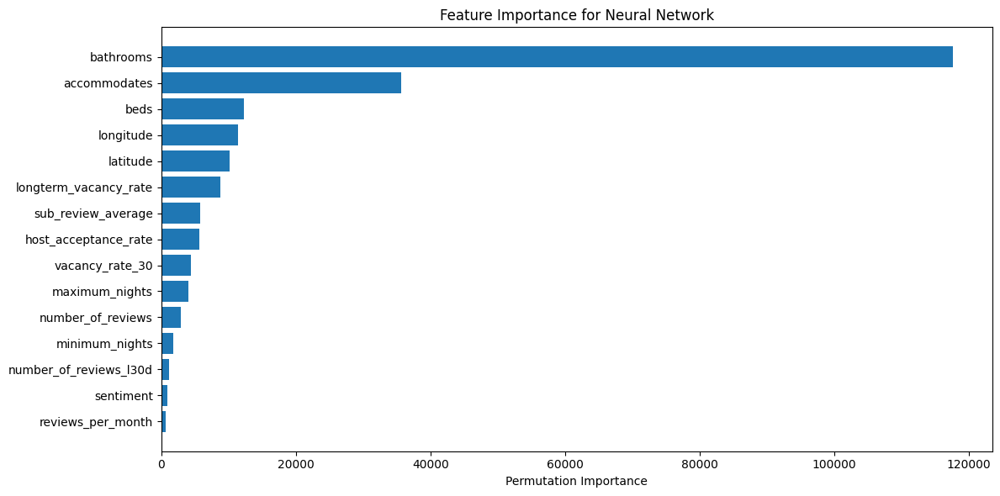

In [109]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Define the Neural Network model
def create_model():
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Create the model
nn_model = create_model()

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network MSE: {mse_nn}')
print(f'Neural Network RMSE: {rmse_nn}')
print(f'Neural Network MAE: {mae_nn}')
print(f'Neural Network R^2: {r2_nn}')

# Compute feature importance using permutation importance
results = permutation_importance(nn_model, X_test, y_test, n_repeats=10, random_state=42, scoring='neg_mean_squared_error')

# Plot feature importances
sorted_idx = results.importances_mean.argsort()

plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), results.importances_mean[sorted_idx], align="center")
plt.yticks(range(len(sorted_idx)), [all_feature_names[i] for i in sorted_idx])
plt.xlabel("Permutation Importance")
plt.title("Feature Importance for Neural Network")
plt.tight_layout()
plt.show()


In [ ]:
!pip install -q optuna
import optuna
from sklearn.model_selection import cross_val_score

def objective_rf(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 500)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)

    rf_model = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42,
        n_jobs=-1
    )

    scores = cross_val_score(rf_model, X_train, y_train, cv=3, scoring='neg_mean_squared_error')
    return -scores.mean()

study_rf = optuna.create_study(direction='minimize')
study_rf.optimize(objective_rf, n_trials=50)

print('Best hyperparameters for Random Forest:', study_rf.best_params)

# Train the Random Forest model with tuned hyperparameters
best_rf_model = RandomForestRegressor(
    **study_rf.best_params,
    random_state=42,
    n_jobs=-1
)
best_rf_model.fit(X_train, y_train)

# Make predictions
y_pred_best_rf = best_rf_model.predict(X_test)


# Evaluate the model
mse_best_rf = mean_squared_error(y_test, y_pred_best_rf)
rmse_best_rf = np.sqrt(mse_best_rf)
mae_best_rf = mean_absolute_error(y_test, y_pred_best_rf)
r2_best_rf = r2_score(y_test, y_pred_best_rf)

print(f'Tuned Random Forest MSE: {mse_best_rf}')
print(f'Tuned Random Forest RMSE: {rmse_best_rf}')
print(f'Tuned Random Forest MAE: {mae_best_rf}')
print(f'Tuned Random Forest R^2: {r2_best_rf}')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 11.2 MB/s eta 0:00:00


[I 2024-07-11 16:33:03,728] A new study created in memory with name: no-name-41f13709-279e-466d-b565-57bfca356eff
[I 2024-07-11 16:33:17,280] Trial 0 finished with value: 912550.5089615543 and parameters: {'n_estimators': 103, 'max_depth': 9, 'min_samples_split': 18, 'min_samples_leaf': 15}. Best is trial 0 with value: 912550.5089615543.
[I 2024-07-11 16:33:52,052] Trial 1 finished with value: 915277.5173067345 and parameters: {'n_estimators': 206, 'max_depth': 16, 'min_samples_split': 6, 'min_samples_leaf': 18}. Best is trial 0 with value: 912550.5089615543.
[I 2024-07-11 16:34:03,523] Trial 2 finished with value: 1107089.69516497 and parameters: {'n_estimators': 56, 'max_depth': 14, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 0 with value: 912550.5089615543.
[I 2024-07-11 16:34:46,669] Trial 3 finished with value: 908171.9851592081 and parameters: {'n_estimators': 249, 'max_depth': 14, 'min_samples_split': 20, 'min_samples_leaf': 13}. Best is trial 3 with value: 908

Best hyperparameters for Random Forest: {'n_estimators': 323, 'max_depth': 16, 'min_samples_split': 8, 'min_samples_leaf': 10}
Tuned Random Forest MSE: 272121.7621450958
Tuned Random Forest RMSE: 521.6529134828021
Tuned Random Forest MAE: 155.42523310523634
Tuned Random Forest R^2: 0.23240019695144587


Tuned Random Forest MSE: 153198.34107214632
Tuned Random Forest RMSE: 391.4055966285438
Tuned Random Forest MAE: 149.40381861652367
Tuned Random Forest R^2: 0.535979633863928


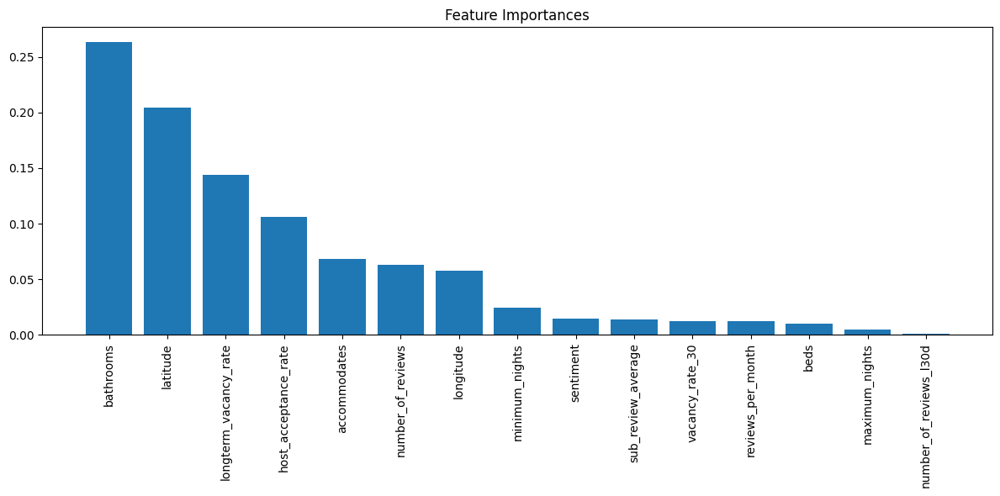

In [110]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Best hyperparameters for the Random Forest model
best_params = {'n_estimators': 323, 'max_depth': 16, 'min_samples_split': 8, 'min_samples_leaf': 10}

# Train the Random Forest model with the best hyperparameters
rf_model_tuned = RandomForestRegressor(
    n_jobs=-1,
    random_state=42,
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf']
)

rf_model_tuned.fit(X_train, y_train)

# Make predictions
y_pred_rf_tuned = rf_model_tuned.predict(X_test)

# Evaluate the model
mse_rf_tuned = mean_squared_error(y_test, y_pred_rf_tuned)
rmse_rf_tuned = np.sqrt(mse_rf_tuned)
mae_rf_tuned = mean_absolute_error(y_test, y_pred_rf_tuned)
r2_rf_tuned = r2_score(y_test, y_pred_rf_tuned)

print(f'Tuned Random Forest MSE: {mse_rf_tuned}')
print(f'Tuned Random Forest RMSE: {rmse_rf_tuned}')
print(f'Tuned Random Forest MAE: {mae_rf_tuned}')
print(f'Tuned Random Forest R^2: {r2_rf_tuned}')

# Plot feature importances
importances = rf_model_tuned.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


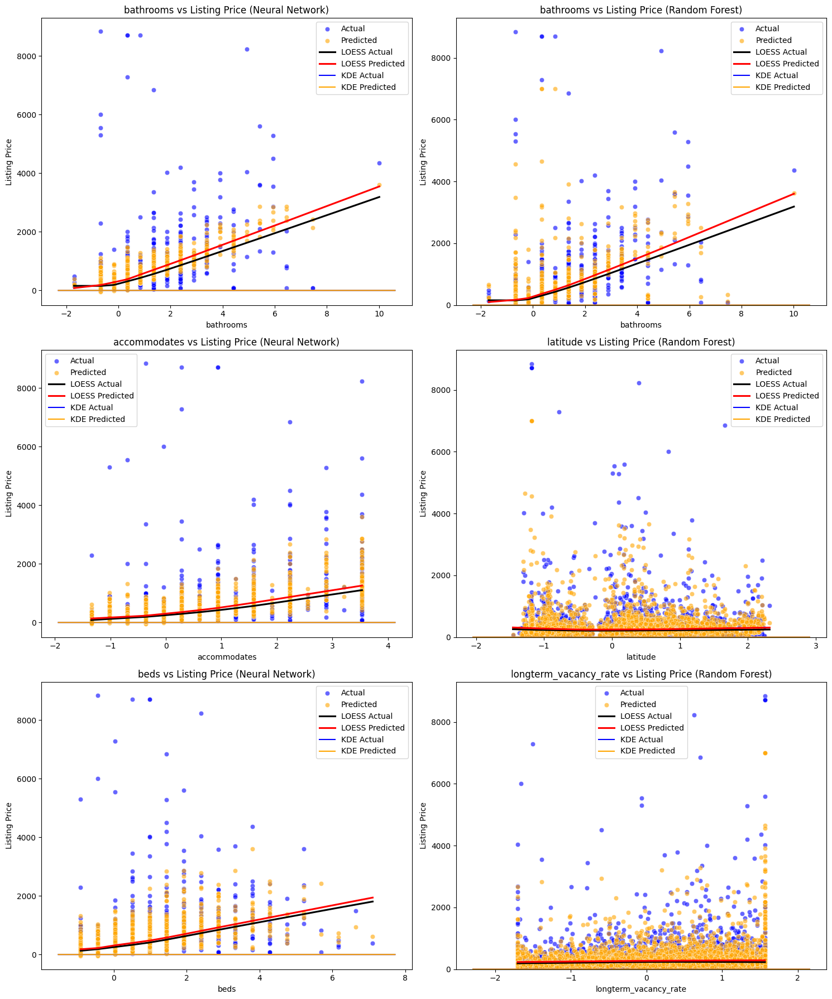

In [124]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Ensure y_test index aligns with X_test
y_test = y_test.reset_index(drop=True)

# Add the actual 'Listing Price' to X_test_df
X_test_df['Listing Price'] = y_test

# Assuming y_pred_rf_tuned and y_pred_nn are already defined
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Create a 3x2 grid for the plots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Plot relationships for Neural Network Model (left column)
for i, feature in enumerate(nn_top_features):
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    sns.kdeplot(ax=axes[i, 0], x=test_df_nn[feature], color='blue', label='KDE Actual')
    sns.kdeplot(ax=axes[i, 0], x=test_df_nn[feature], color='orange', label='KDE Predicted')
    axes[i, 0].set_title(f'{feature} vs Listing Price (Neural Network)')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Listing Price')
    axes[i, 0].legend()

# Plot relationships for Random Forest Model (right column)
for i, feature in enumerate(rf_top_features):
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    sns.kdeplot(ax=axes[i, 1], x=test_df_rf[feature], color='blue', label='KDE Actual')
    sns.kdeplot(ax=axes[i, 1], x=test_df_rf[feature], color='orange', label='KDE Predicted')
    axes[i, 1].set_title(f'{feature} vs Listing Price (Random Forest)')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Listing Price')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()


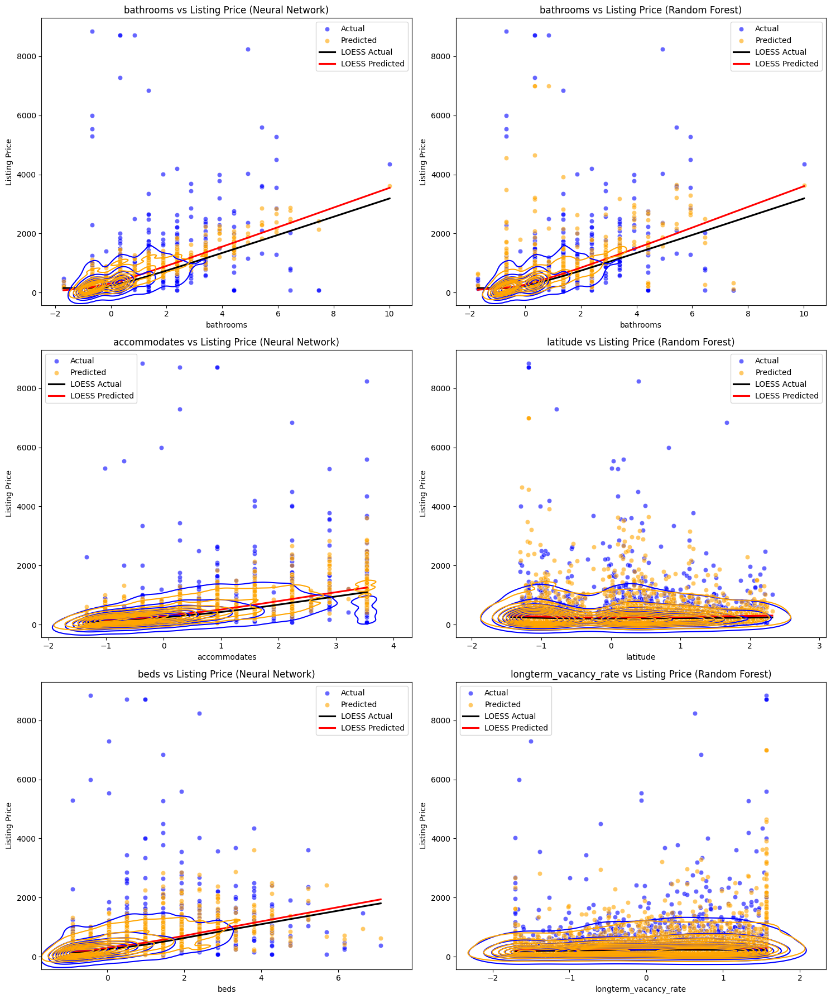

In [123]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Ensure y_test index aligns with X_test
y_test = y_test.reset_index(drop=True)

# Add the actual 'Listing Price' to X_test_df
X_test_df['Listing Price'] = y_test

# Assuming y_pred_rf_tuned and y_pred_nn are already defined
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Create a 3x2 grid for the plots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Plot relationships for Neural Network Model (left column)
for i, feature in enumerate(nn_top_features):
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    sns.kdeplot(ax=axes[i, 0], x=test_df_nn[feature], y=test_df_nn['Listing Price'], fill=False, color='blue', label='KDE Actual')
    sns.kdeplot(ax=axes[i, 0], x=test_df_nn[feature], y=test_df_nn['Predicted Listing Price NN'], fill=False, color='orange', label='KDE Predicted')
    axes[i, 0].set_title(f'{feature} vs Listing Price (Neural Network)')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Listing Price')
    axes[i, 0].legend()

# Plot relationships for Random Forest Model (right column)
for i, feature in enumerate(rf_top_features):
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    sns.kdeplot(ax=axes[i, 1], x=test_df_rf[feature], y=test_df_rf['Listing Price'], fill=False, color='blue', label='KDE Actual')
    sns.kdeplot(ax=axes[i, 1], x=test_df_rf[feature], y=test_df_rf['Predicted Listing Price RF'], fill=False, color='orange', label='KDE Predicted')
    axes[i, 1].set_title(f'{feature} vs Listing Price (Random Forest)')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Listing Price')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()


First few rows of test_df_rf:
   host_acceptance_rate  latitude  longitude  accommodates      beds  \
0             -0.126834 -0.746231  -0.327363      0.282237  0.976023   
1              0.450105 -1.156896   0.477310     -0.042985  0.033232   
2             -1.385611  1.390501   1.044754      0.282237  0.033232   
3              0.450105 -0.795232   0.533156     -0.368208 -0.438164   
4              0.450105 -0.764051   0.508615     -1.018653 -0.438164   

   minimum_nights  maximum_nights  number_of_reviews  number_of_reviews_l30d  \
0       -0.164076        1.556723          -0.032505               -0.504561   
1       -0.071716       -0.944241           0.686814                0.222365   
2       -0.164076       -1.089224          -0.512052               -0.504561   
3       -0.071716       -1.089224          -0.494925               -0.504561   
4        0.066824        1.556723          -0.255152               -0.504561   

   reviews_per_month  bathrooms  vacancy_rate_30  sentim

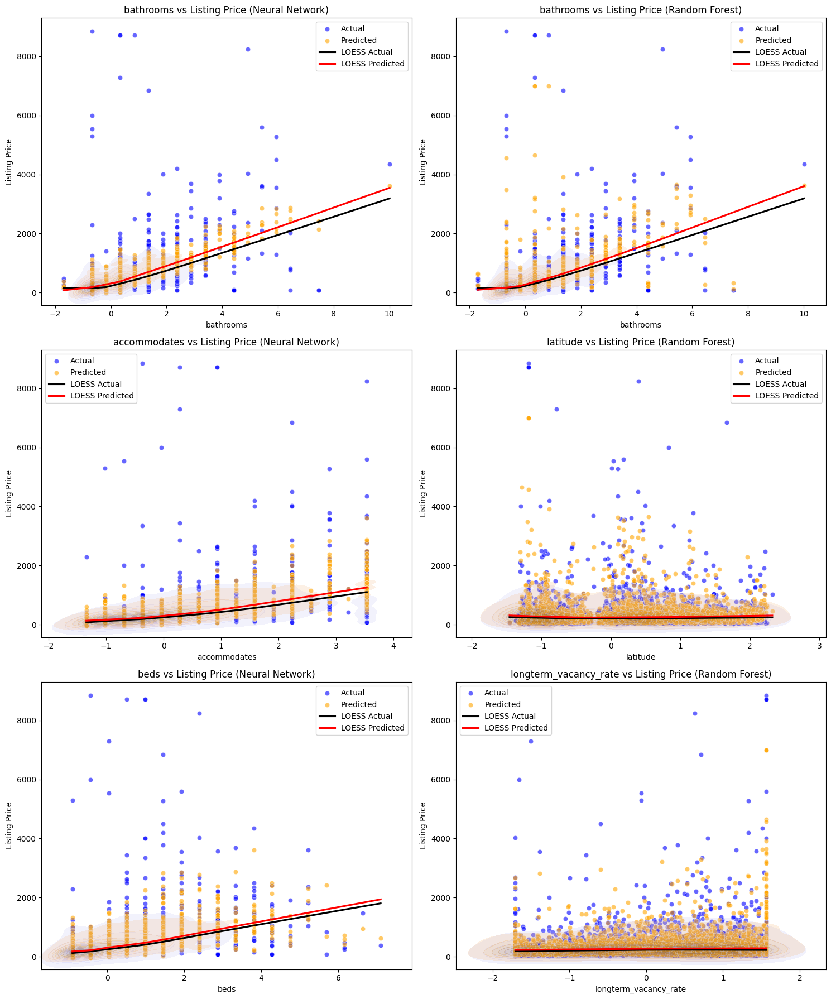

In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Ensure y_test index aligns with X_test
y_test = y_test.reset_index(drop=True)

# Add the actual 'Listing Price' to X_test_df
X_test_df['Listing Price'] = y_test

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Print first few rows to debug
print("First few rows of test_df_rf:")
print(test_df_rf.head())

# Create a 3x2 grid for the plots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Plot relationships for Neural Network Model (left column)
for i, feature in enumerate(nn_top_features):
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    sns.kdeplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, fill=True, color='blue', alpha=0.2, label='KDE Actual')
    sns.kdeplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, fill=True, color='orange', alpha=0.2, label='KDE Predicted')
    axes[i, 0].set_title(f'{feature} vs Listing Price (Neural Network)')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Listing Price')
    axes[i, 0].legend()

# Plot relationships for Random Forest Model (right column)
for i, feature in enumerate(rf_top_features):
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    sns.kdeplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, fill=True, color='blue', alpha=0.2, label='KDE Actual')
    sns.kdeplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, fill=True, color='orange', alpha=0.2, label='KDE Predicted')
    axes[i, 1].set_title(f'{feature} vs Listing Price (Random Forest)')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Listing Price')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()


First few rows of test_df_rf:
   host_acceptance_rate  latitude  longitude  accommodates      beds  \
0             -0.126834 -0.746231  -0.327363      0.282237  0.976023   
1              0.450105 -1.156896   0.477310     -0.042985  0.033232   
2             -1.385611  1.390501   1.044754      0.282237  0.033232   
3              0.450105 -0.795232   0.533156     -0.368208 -0.438164   
4              0.450105 -0.764051   0.508615     -1.018653 -0.438164   

   minimum_nights  maximum_nights  number_of_reviews  number_of_reviews_l30d  \
0       -0.164076        1.556723          -0.032505               -0.504561   
1       -0.071716       -0.944241           0.686814                0.222365   
2       -0.164076       -1.089224          -0.512052               -0.504561   
3       -0.071716       -1.089224          -0.494925               -0.504561   
4        0.066824        1.556723          -0.255152               -0.504561   

   reviews_per_month  bathrooms  vacancy_rate_30  sentim

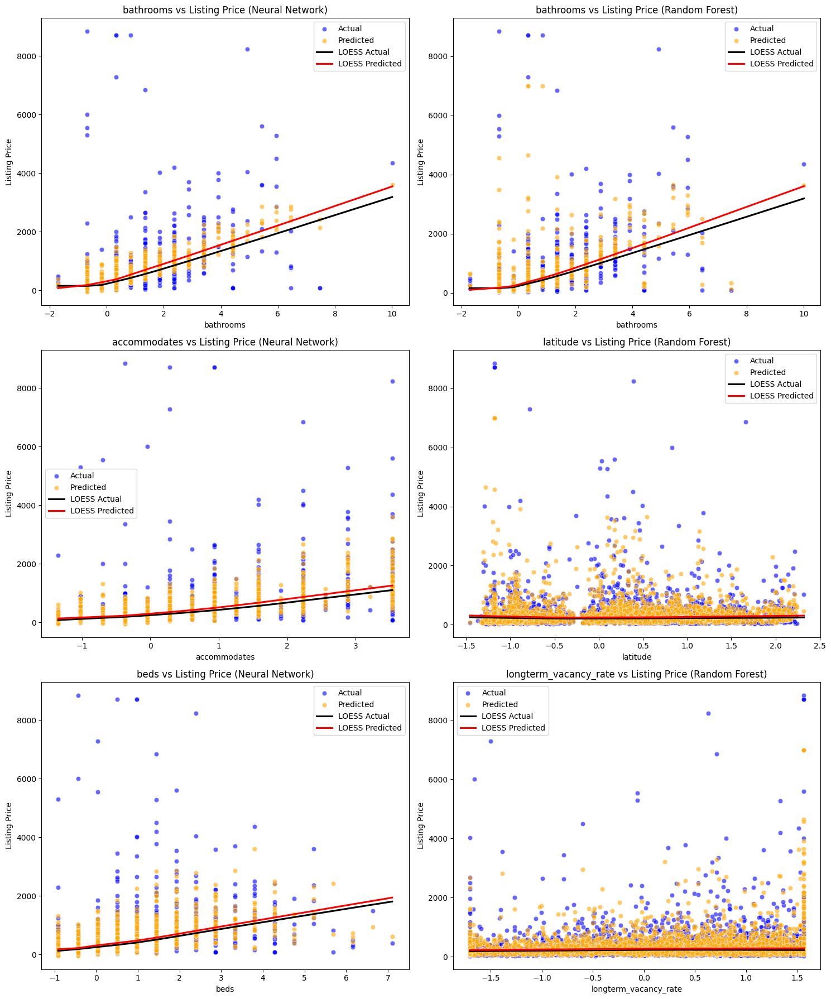

In [120]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Ensure y_test index aligns with X_test
y_test = y_test.reset_index(drop=True)

# Add the actual 'Listing Price' to X_test_df
X_test_df['Listing Price'] = y_test

# Assuming y_pred_rf_tuned and y_pred_nn are already defined
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Print first few rows to debug
print("First few rows of test_df_rf:")
print(test_df_rf.head())


# Create a 3x2 grid for the plots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Plot relationships for Neural Network Model (left column)
for i, feature in enumerate(nn_top_features):
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    axes[i, 0].set_title(f'{feature} vs Listing Price (Neural Network)')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Listing Price')
    axes[i, 0].legend()

# Plot relationships for Random Forest Model (right column)
for i, feature in enumerate(rf_top_features):
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    axes[i, 1].set_title(f'{feature} vs Listing Price (Random Forest)')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Listing Price')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()


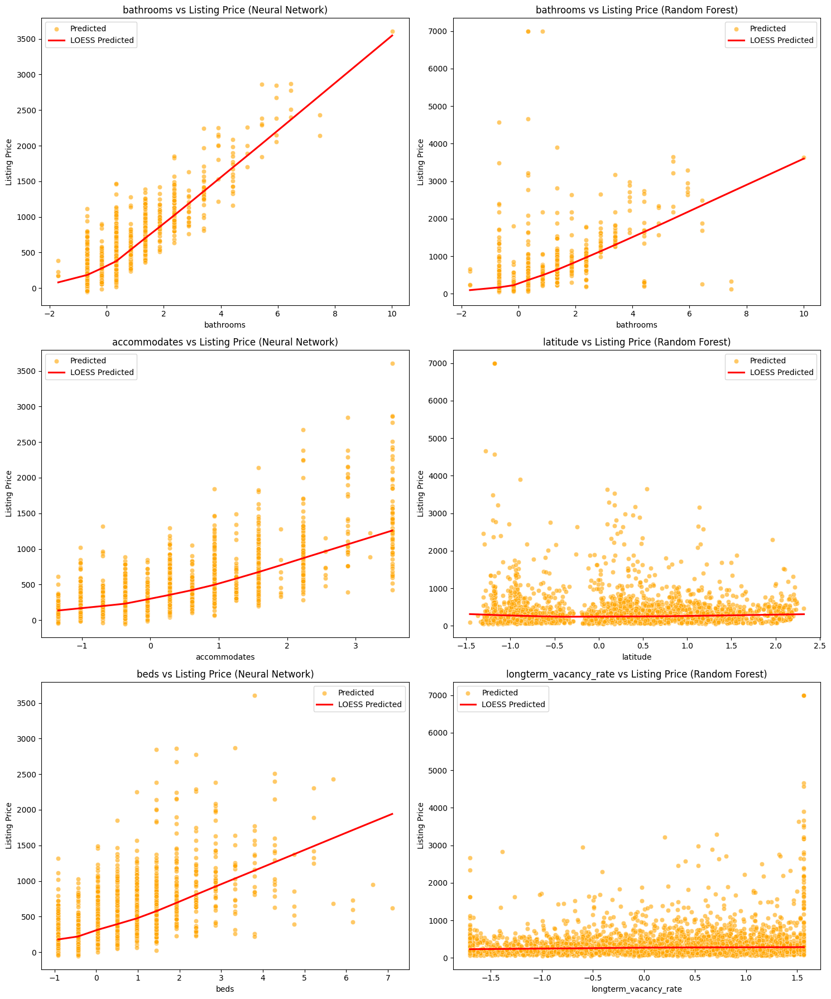

In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Create a 3x2 grid for the plots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Plot relationships for Neural Network Model (left column)
for i, feature in enumerate(nn_top_features):
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    axes[i, 0].set_title(f'{feature} vs Listing Price (Neural Network)')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Listing Price')
    axes[i, 0].legend()

# Plot relationships for Random Forest Model (right column)
for i, feature in enumerate(rf_top_features):
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    axes[i, 1].set_title(f'{feature} vs Listing Price (Random Forest)')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Listing Price')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()


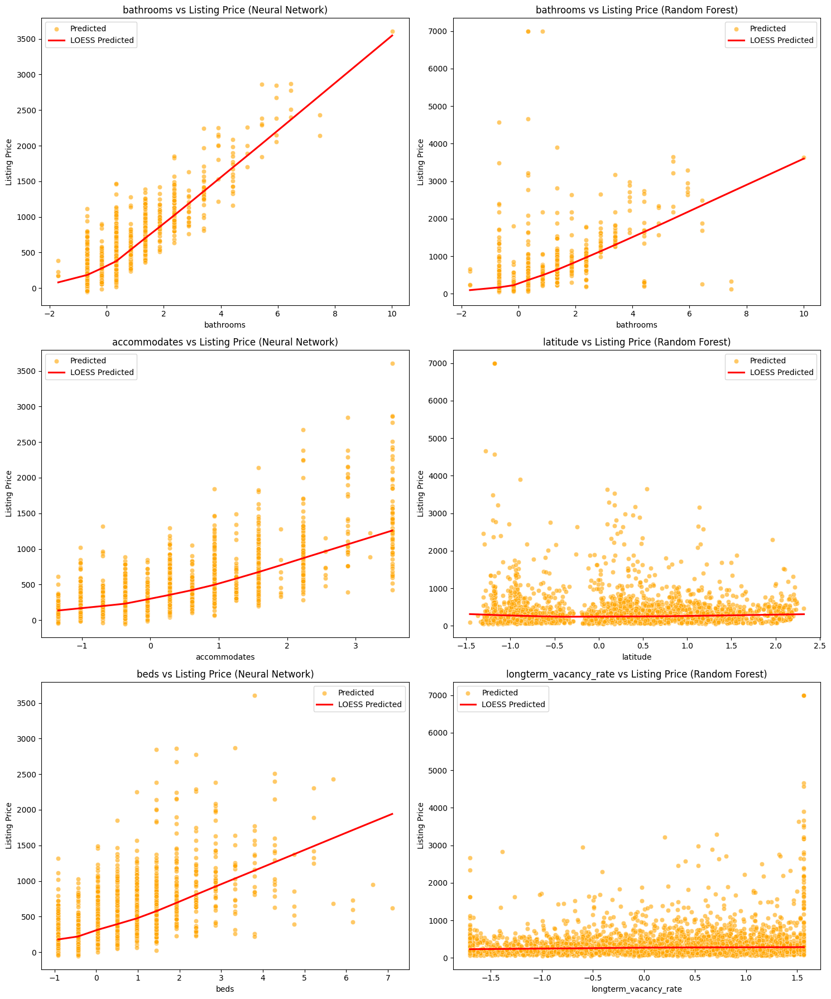

In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Create a 3x2 grid for the plots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Plot relationships for Neural Network Model (left column)
for i, feature in enumerate(nn_top_features):
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 0], x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 0], x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    axes[i, 0].set_title(f'{feature} vs Listing Price (Neural Network)')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Listing Price')
    axes[i, 0].legend()

# Plot relationships for Random Forest Model (right column)
for i, feature in enumerate(rf_top_features):
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(ax=axes[i, 1], x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(ax=axes[i, 1], x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    axes[i, 1].set_title(f'{feature} vs Listing Price (Random Forest)')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Listing Price')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()


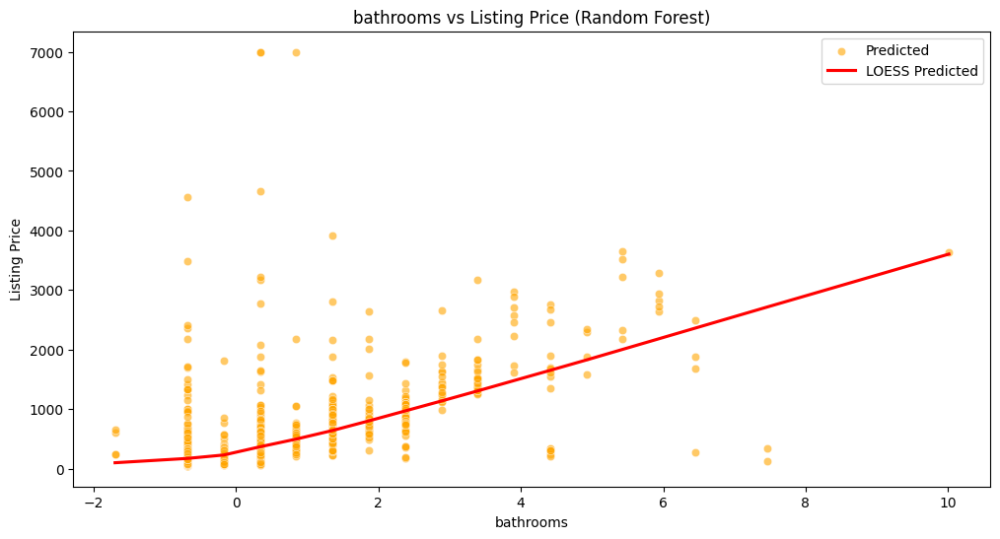

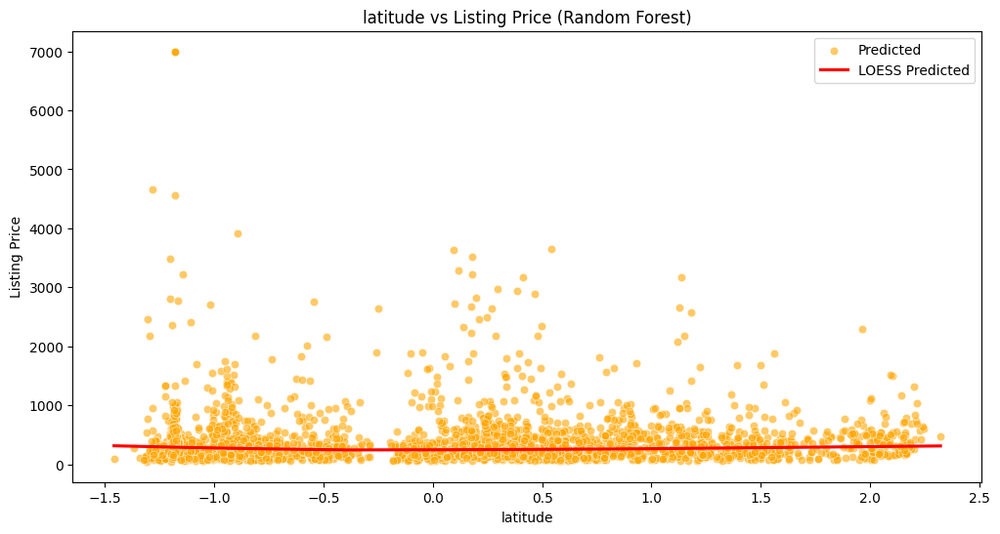

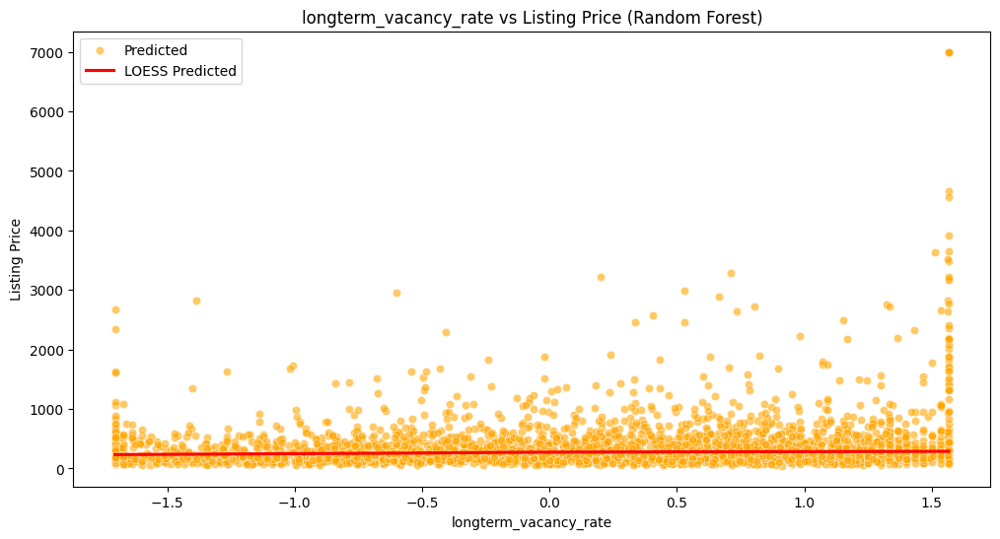

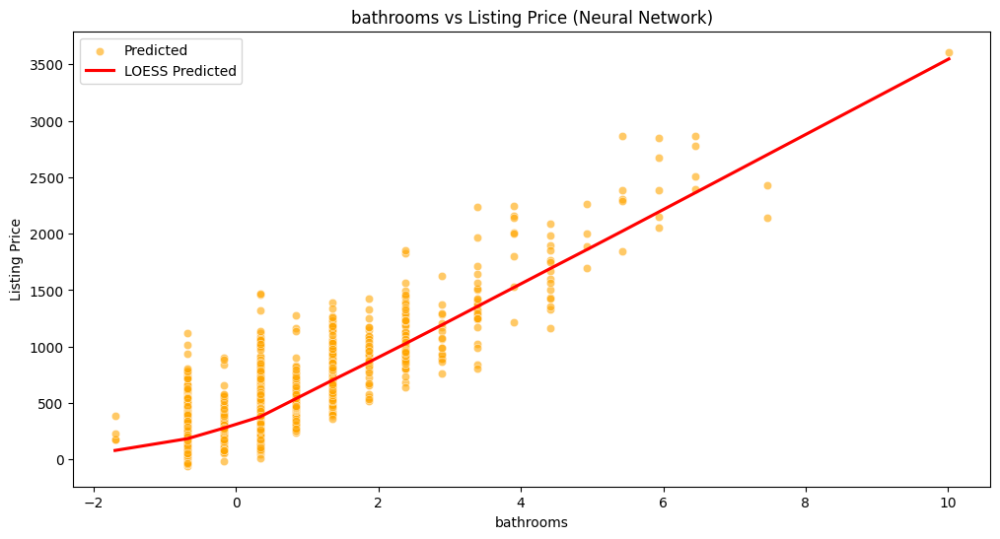

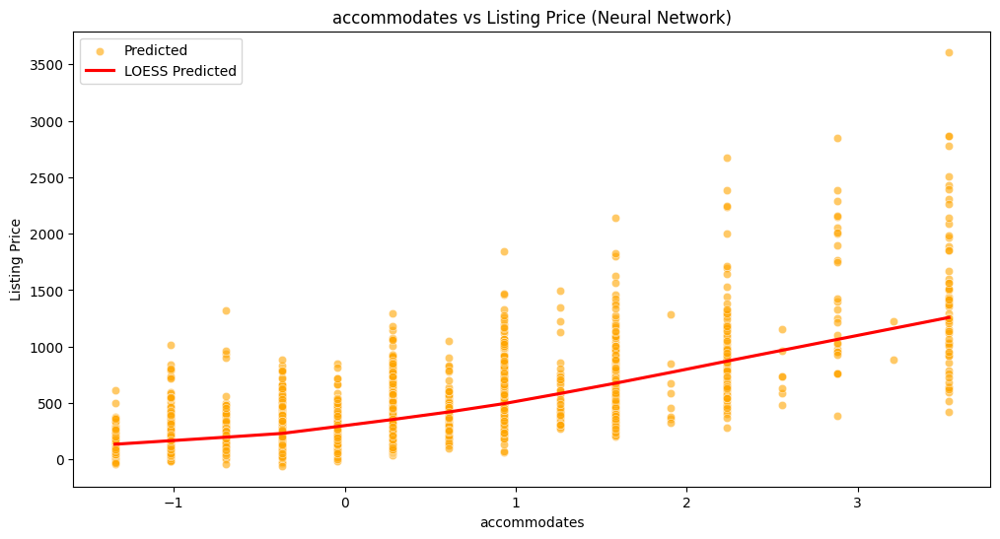

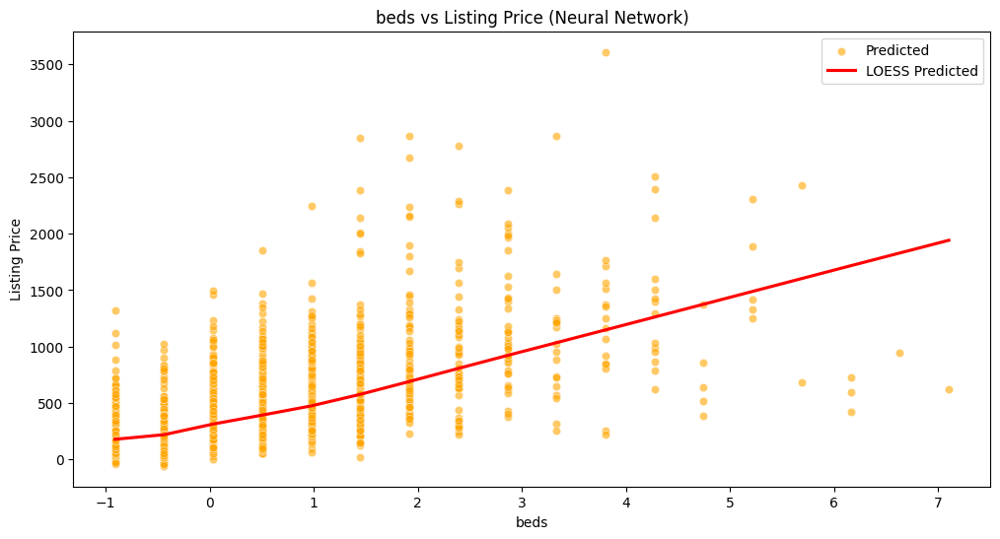

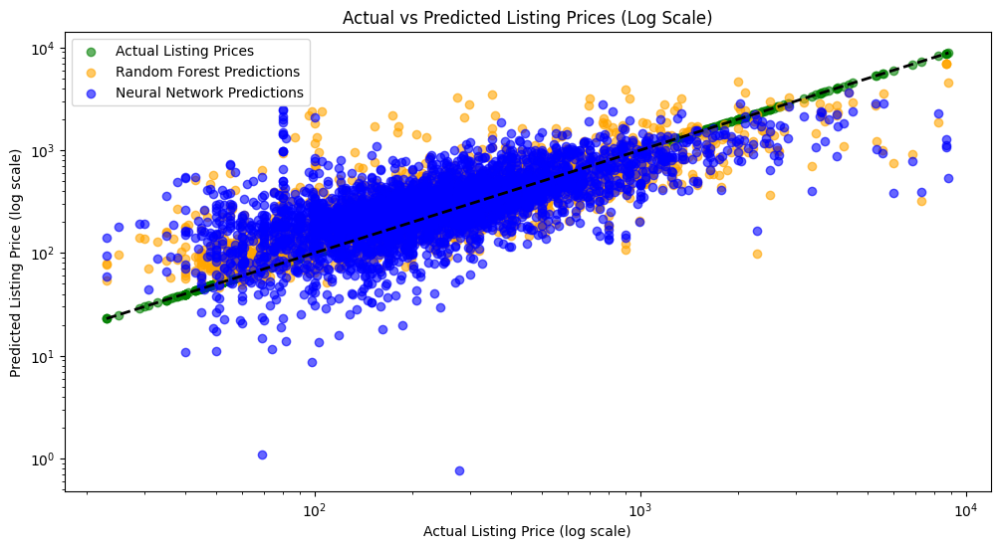

In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6, color='blue')
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6, color='orange')
    sns.regplot(x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot Actual vs Predicted Prices for both models using log scale
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_test, label='Actual Listing Prices', alpha=0.6, color='green')
plt.scatter(y_test, y_pred_rf_tuned, label='Random Forest Predictions', alpha=0.6, color='orange')
plt.scatter(y_test, y_pred_nn, label='Neural Network Predictions', alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Actual Listing Price (log scale)')
plt.ylabel('Predicted Listing Price (log scale)')
plt.title('Actual vs Predicted Listing Prices (Log Scale)')
plt.legend()
plt.show()


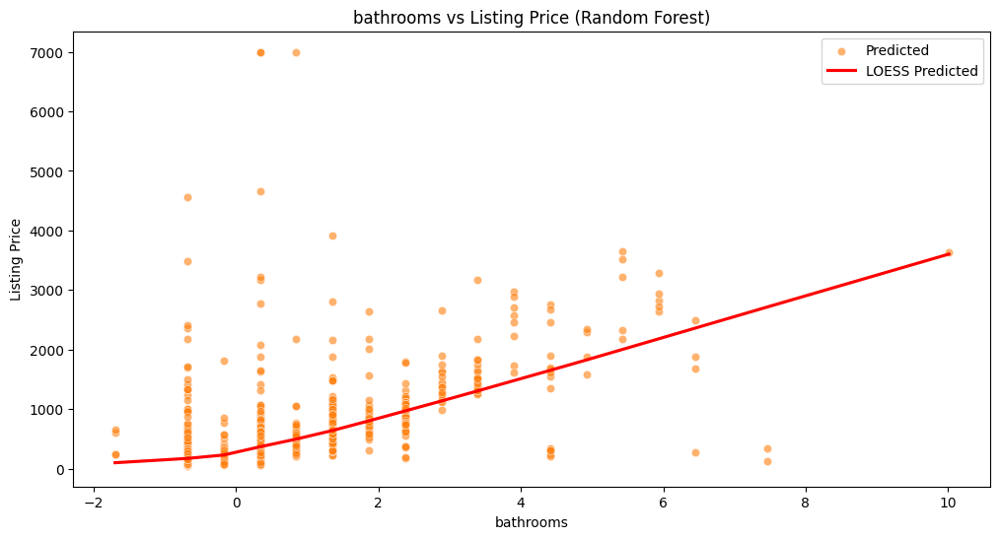

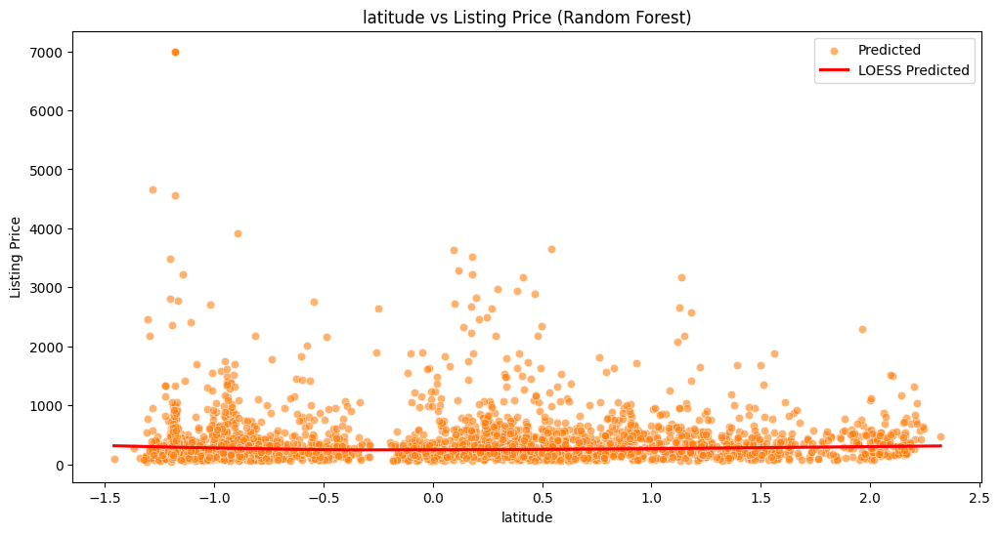

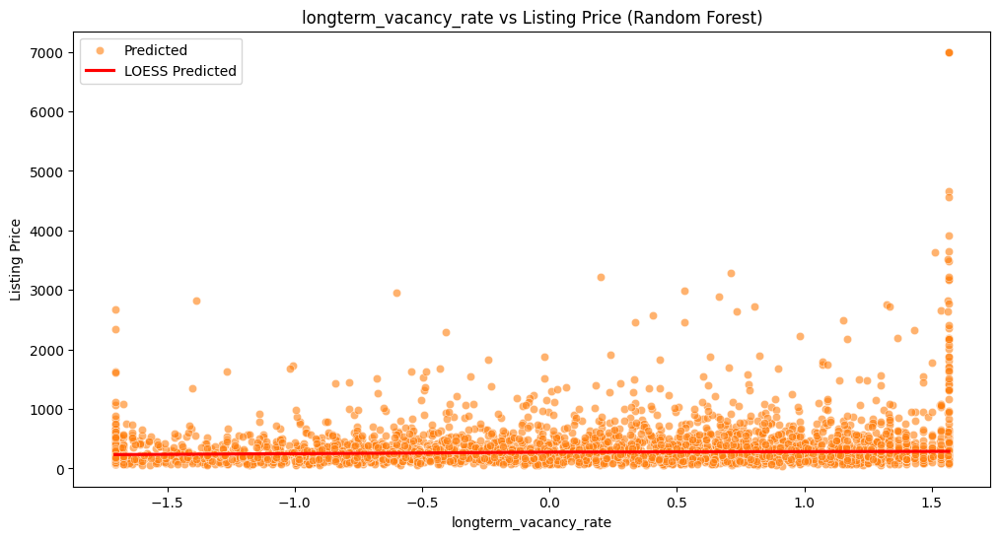

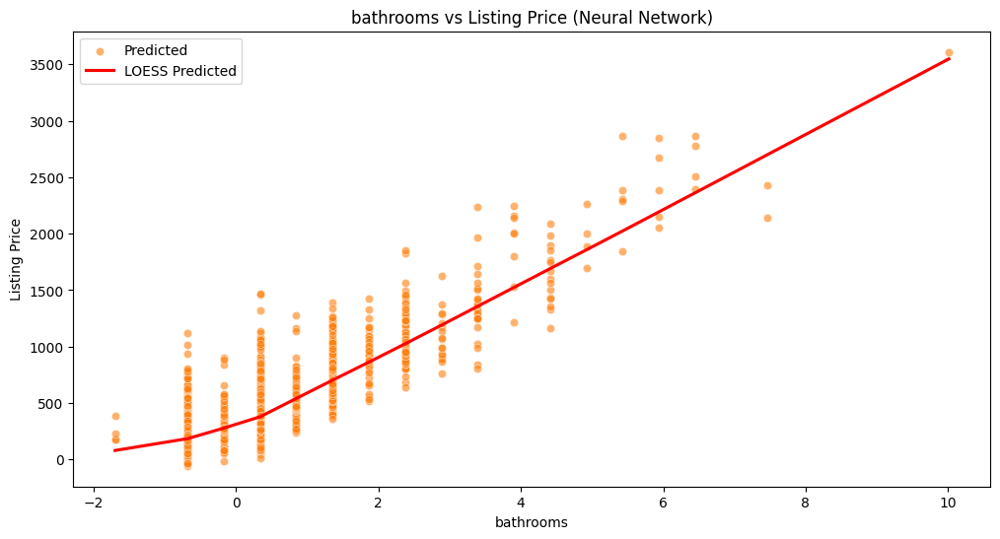

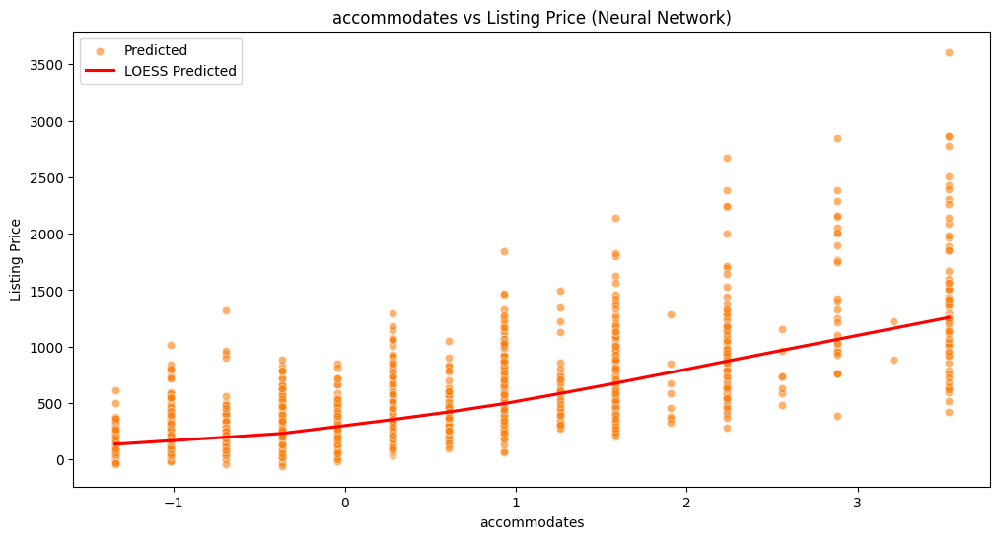

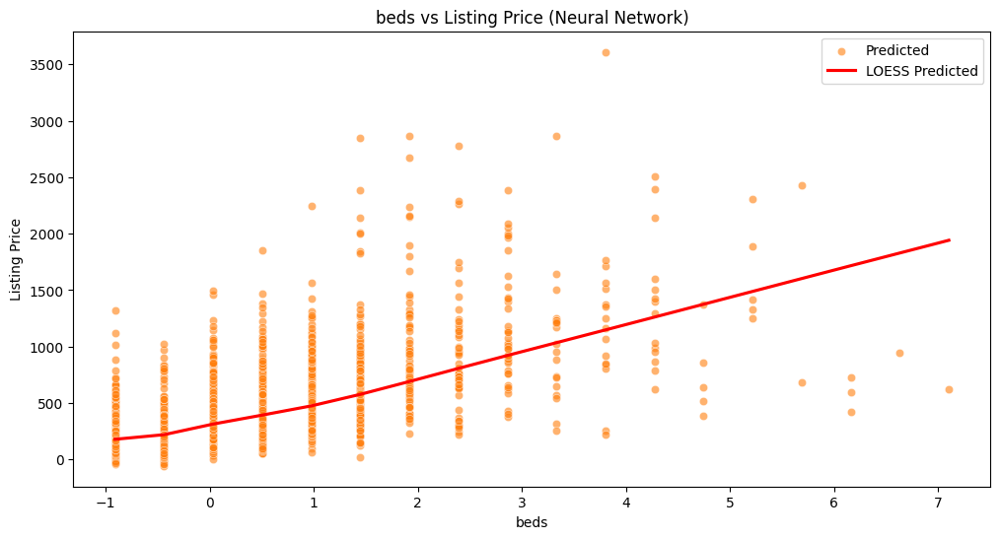

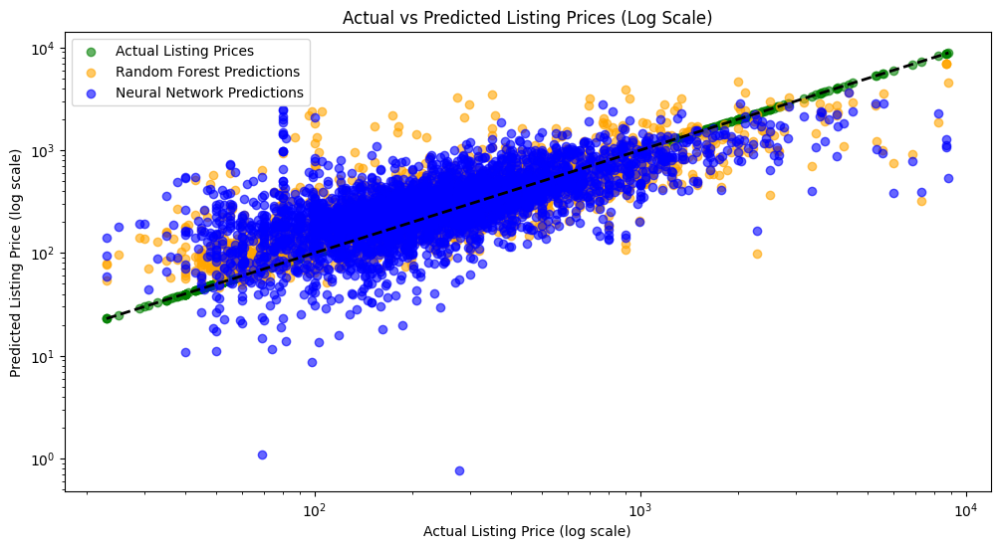

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accommodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot Actual vs Predicted Prices for both models using log scale
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_test, label='Actual Listing Prices', alpha=0.6, color='green')
plt.scatter(y_test, y_pred_rf_tuned, label='Random Forest Predictions', alpha=0.6, color='orange')
plt.scatter(y_test, y_pred_nn, label='Neural Network Predictions', alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Actual Listing Price (log scale)')
plt.ylabel('Predicted Listing Price (log scale)')
plt.title('Actual vs Predicted Listing Prices (Log Scale)')
plt.legend()
plt.show()


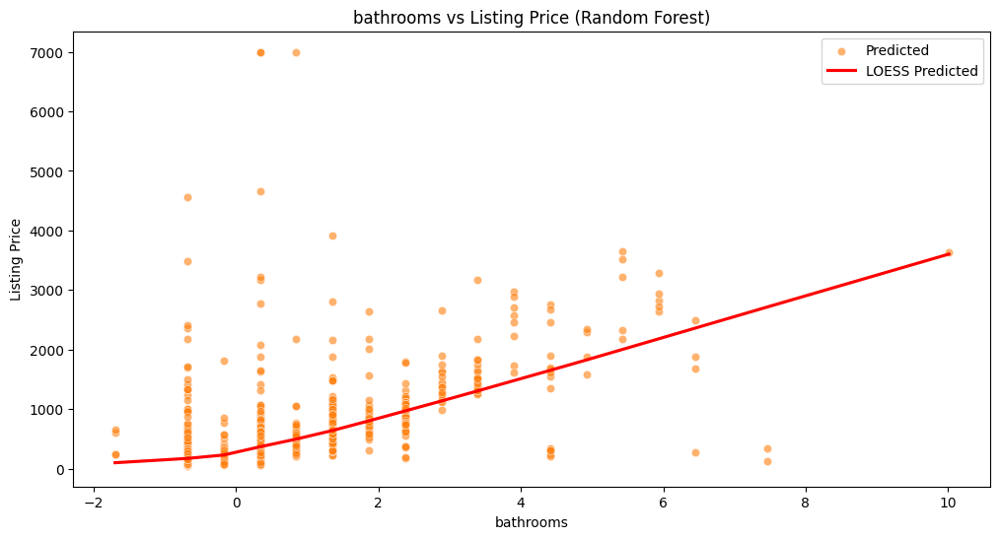

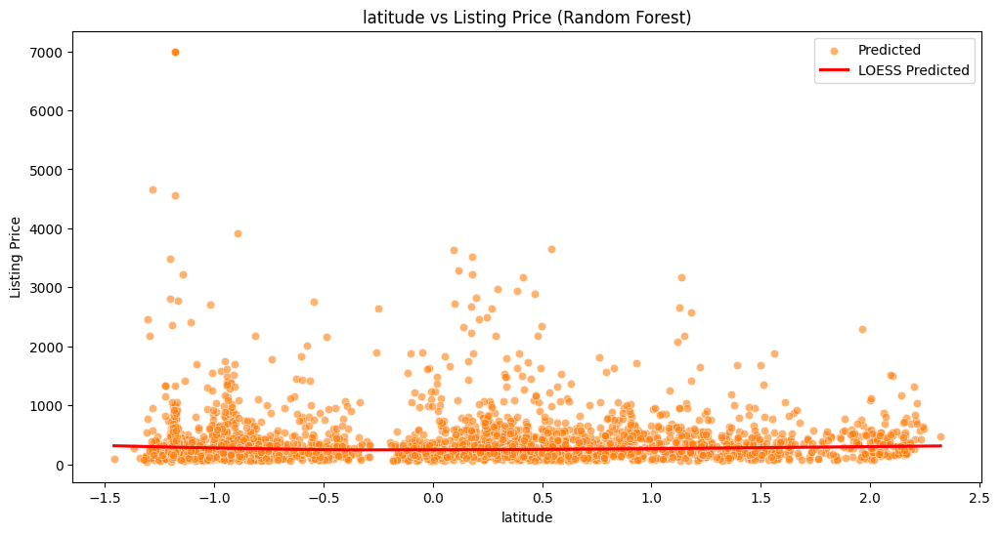

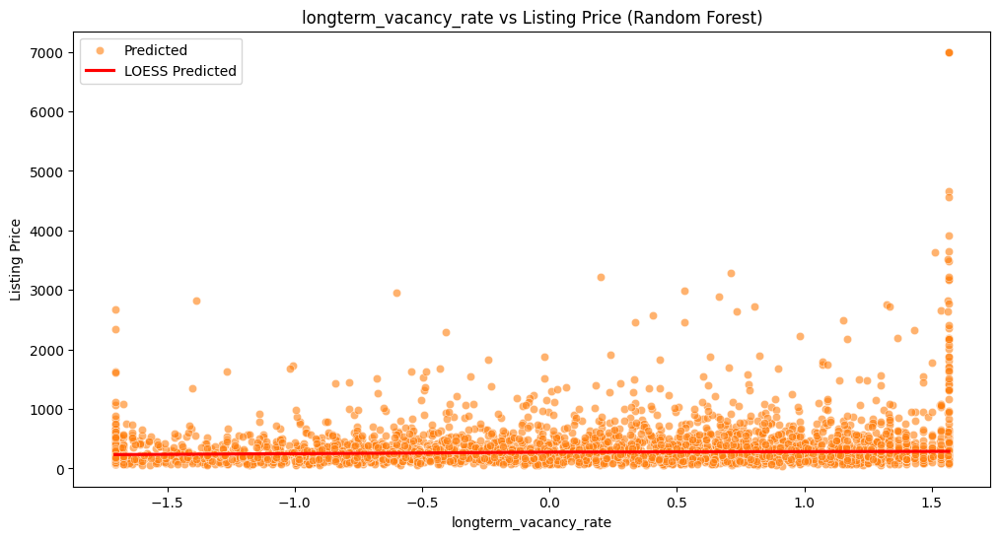

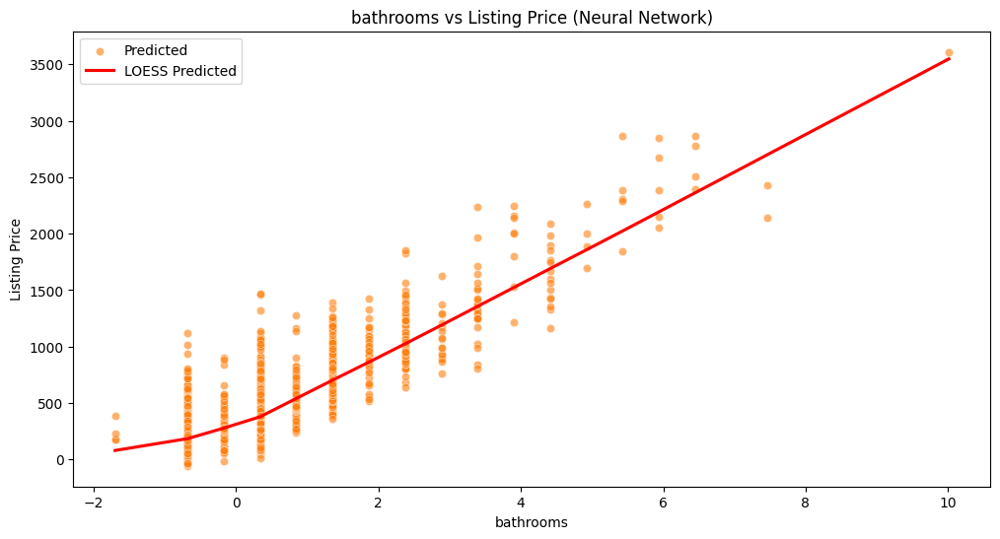

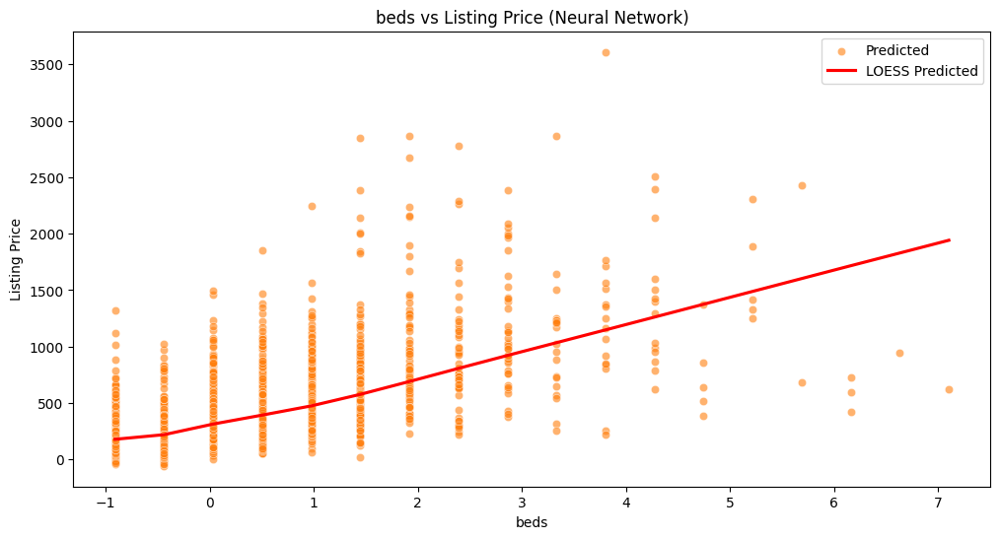

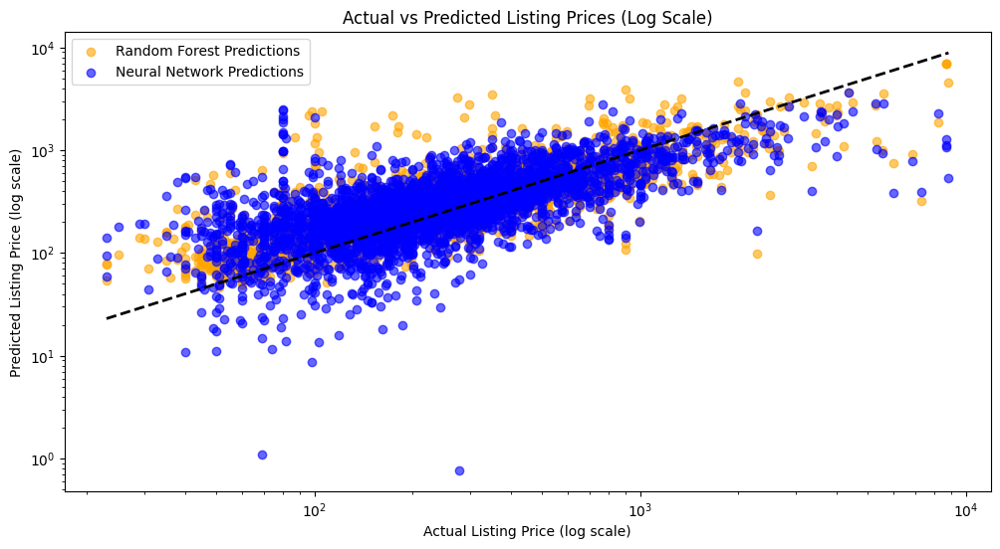

In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'longterm_vacancy_rate']
nn_top_features = ['bathrooms', 'accomodates', 'beds']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot Actual vs Predicted Prices for both models using log scale
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf_tuned, label='Random Forest Predictions', alpha=0.6, color='orange')
plt.scatter(y_test, y_pred_nn, label='Neural Network Predictions', alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Actual Listing Price (log scale)')
plt.ylabel('Predicted Listing Price (log scale)')
plt.title('Actual vs Predicted Listing Prices (Log Scale)')
plt.legend()
plt.show()


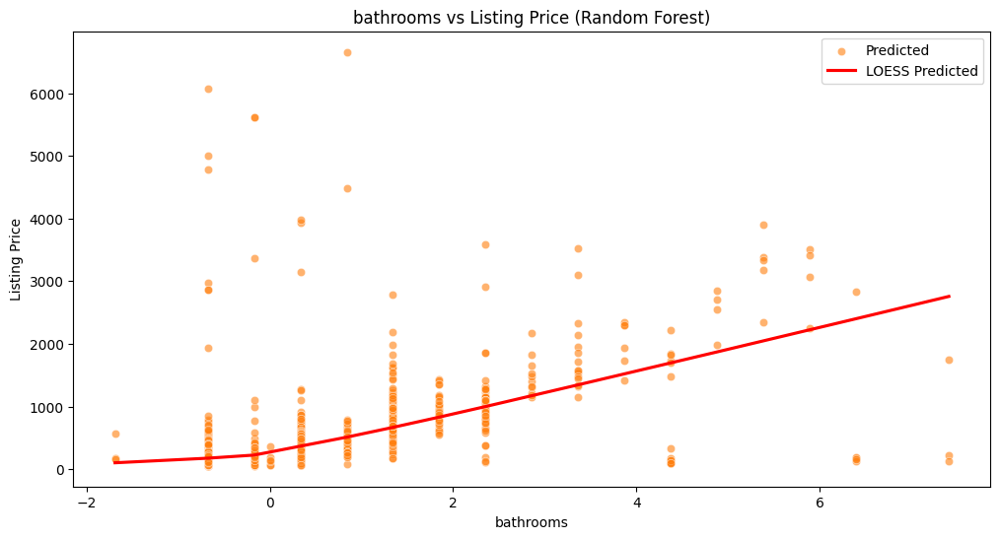

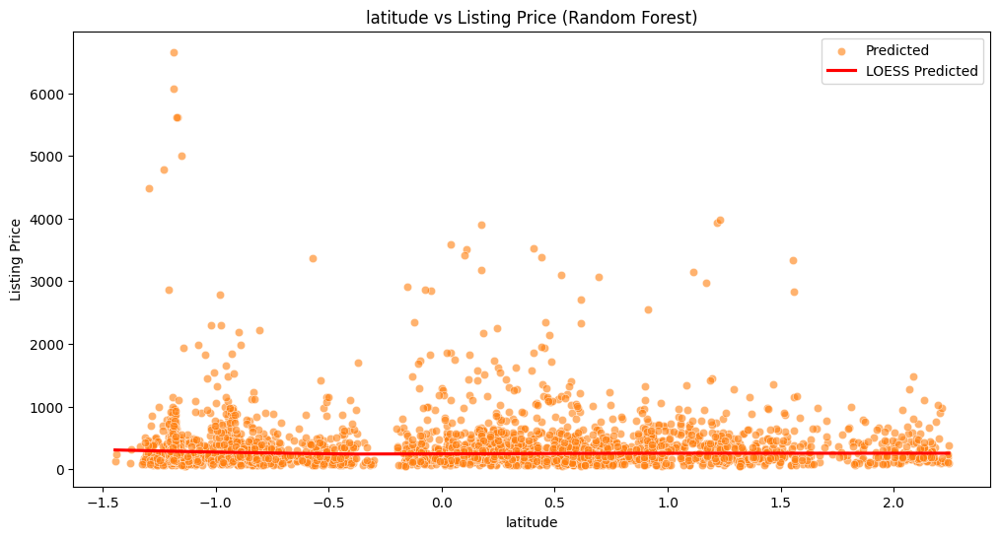

/usr/local/lib/python3.10/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


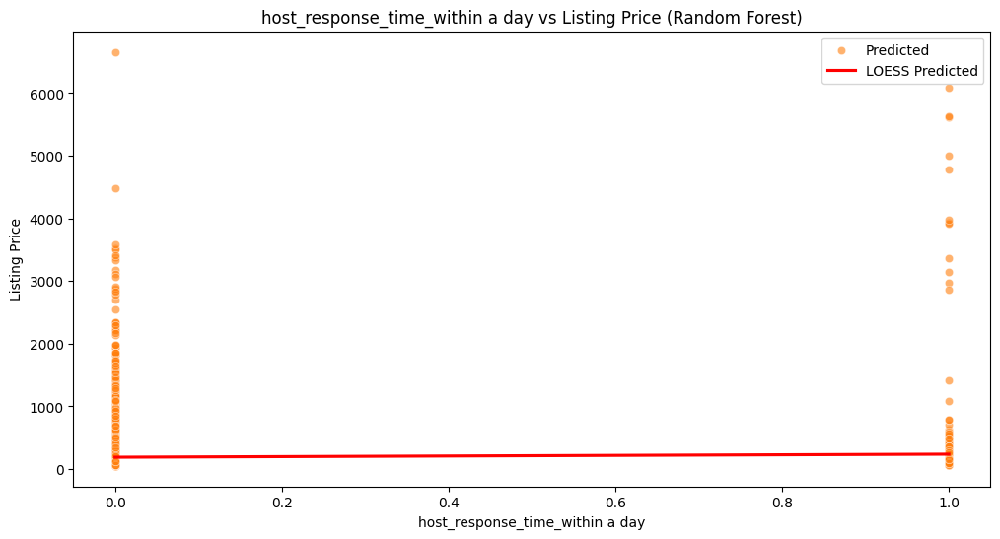

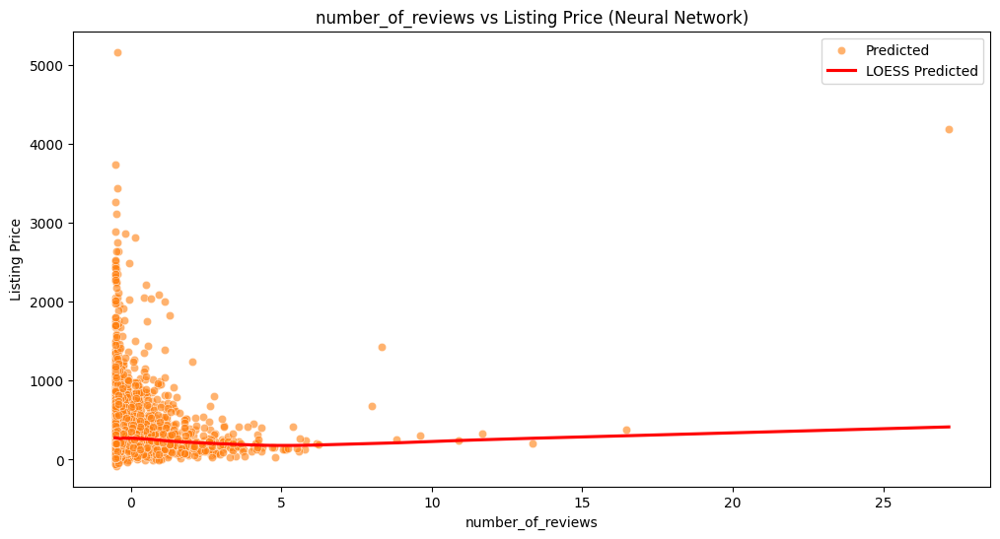

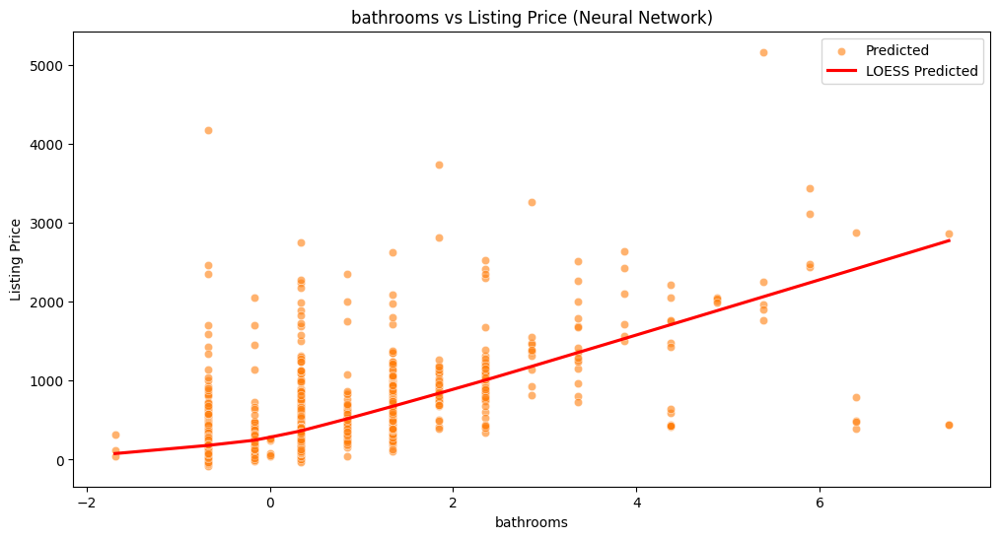

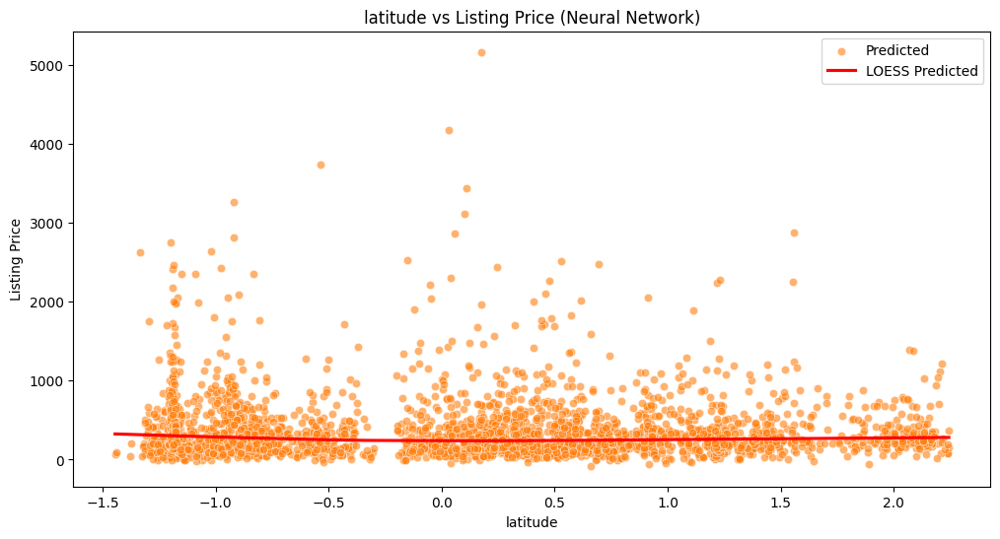

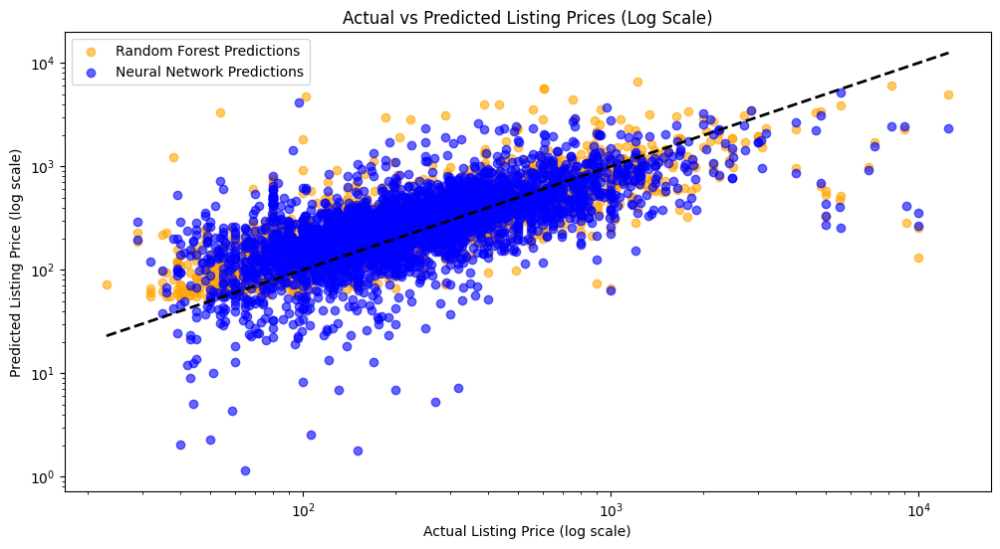

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'host_response_time_within a day']
nn_top_features = ['number_of_reviews', 'bathrooms', 'latitude']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot Actual vs Predicted Prices for both models using log scale
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf_tuned, label='Random Forest Predictions', alpha=0.6, color='orange')
plt.scatter(y_test, y_pred_nn, label='Neural Network Predictions', alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Actual Listing Price (log scale)')
plt.ylabel('Predicted Listing Price (log scale)')
plt.title('Actual vs Predicted Listing Prices (Log Scale)')
plt.legend()
plt.show()


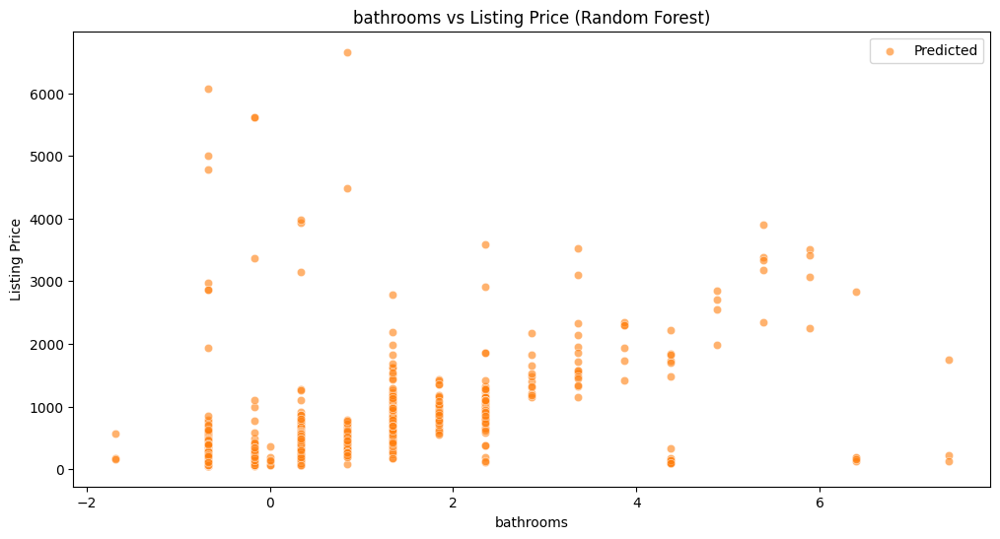

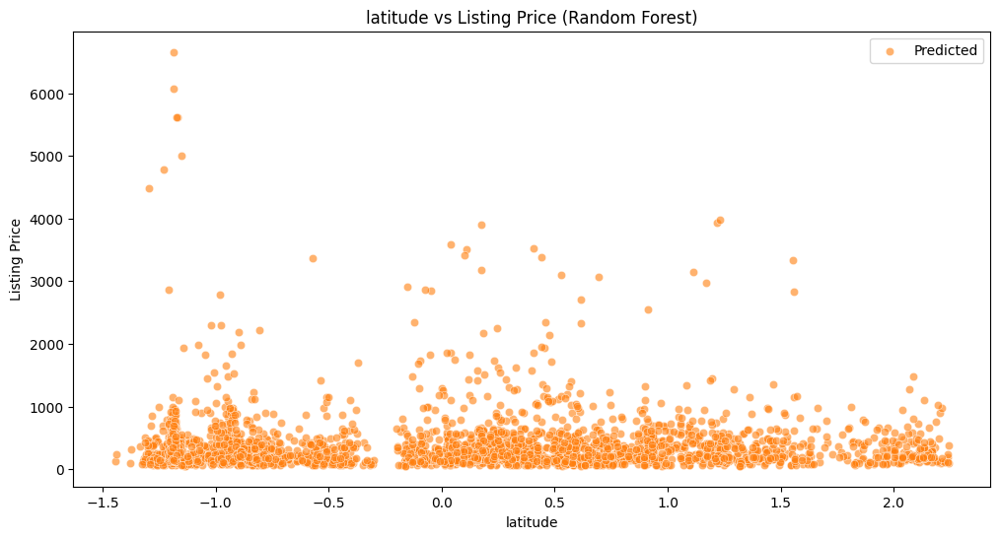

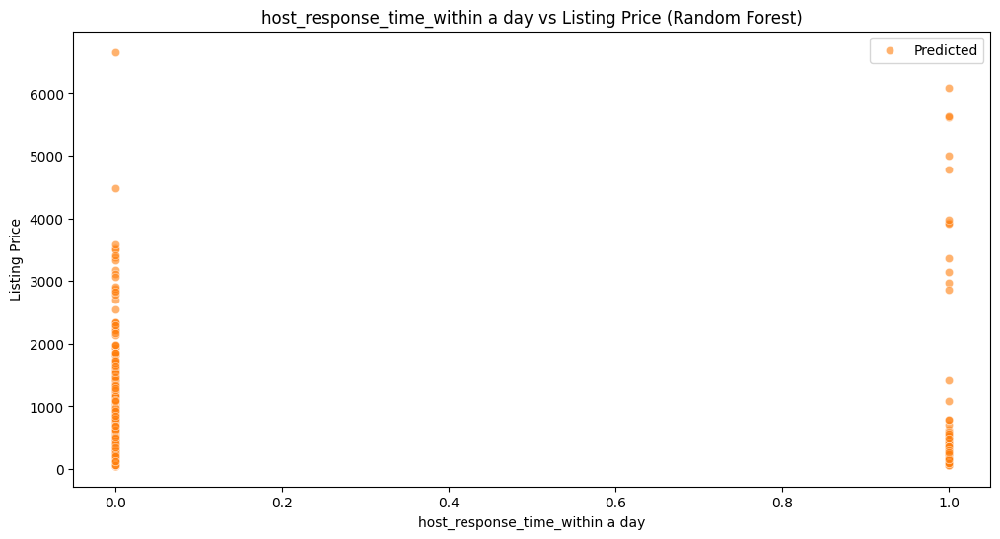

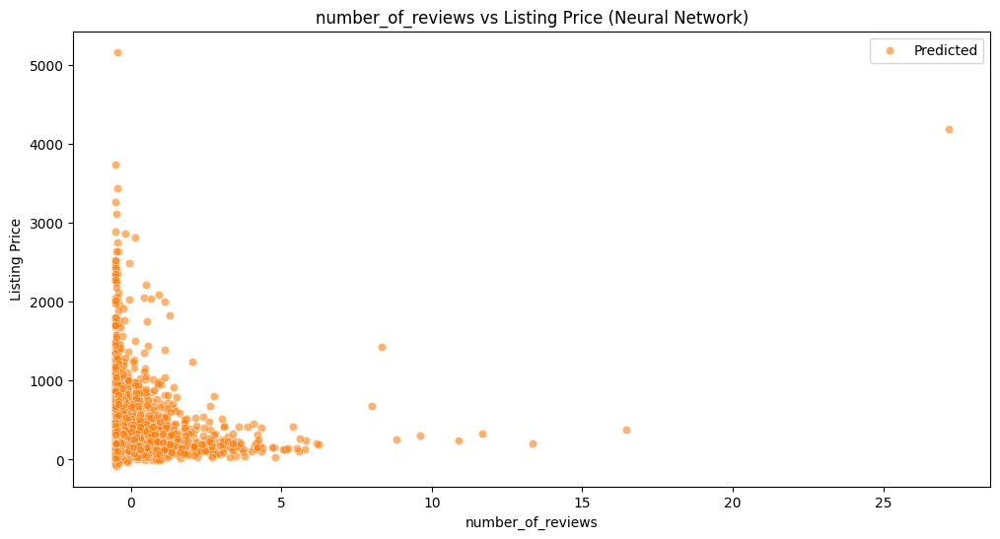

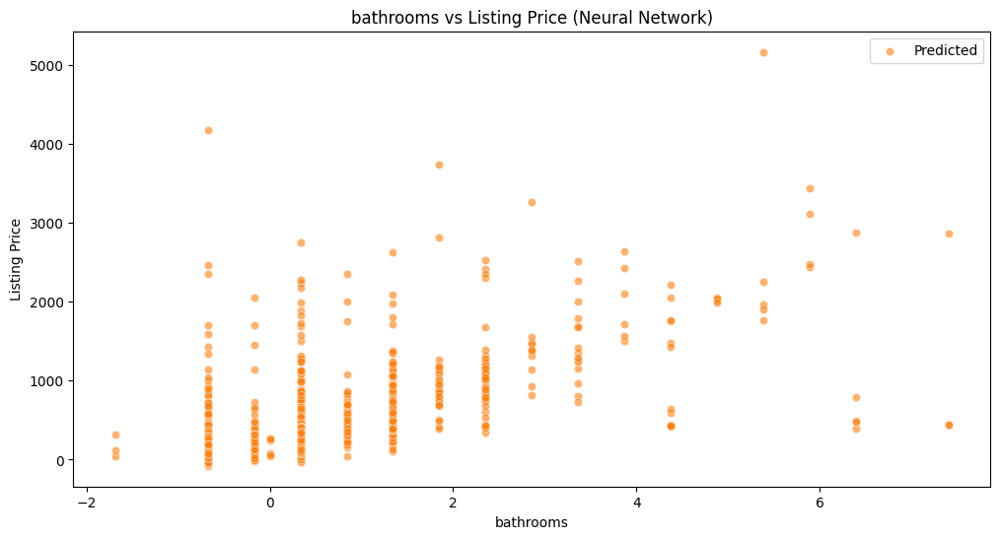

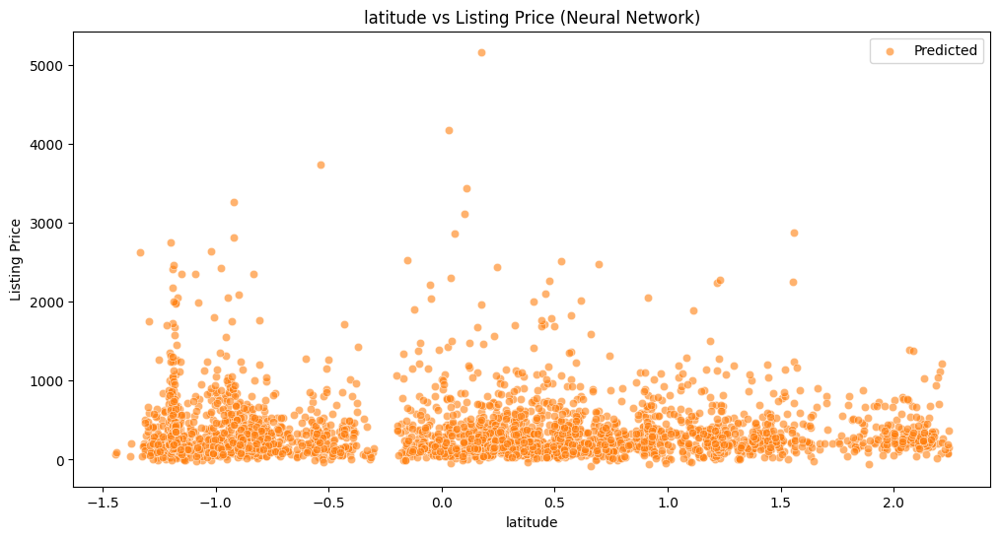

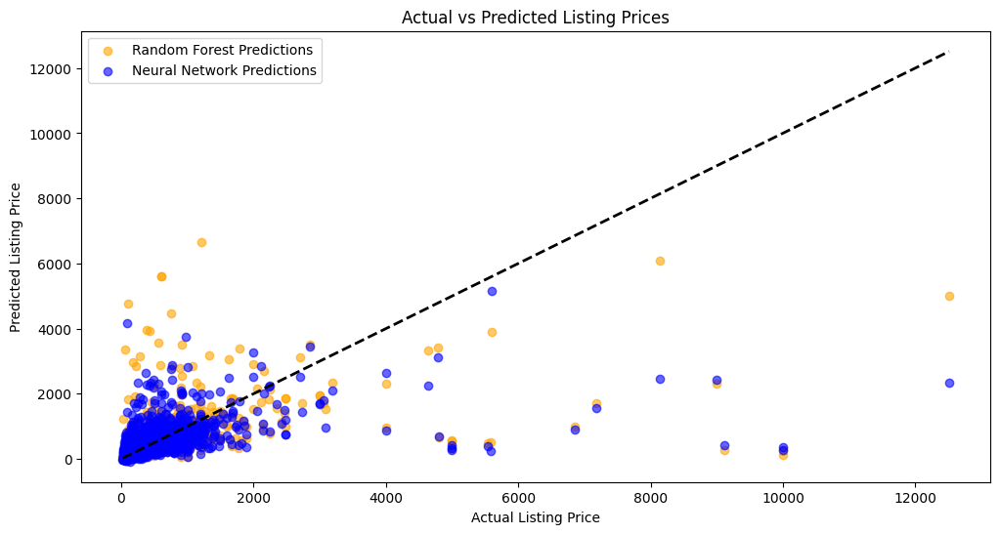

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'host_response_time_within a day']
nn_top_features = ['number_of_reviews', 'bathrooms', 'latitude']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot Actual vs Predicted Prices for both models
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf_tuned, label='Random Forest Predictions', alpha=0.6, color='orange')
plt.scatter(y_test, y_pred_nn, label='Neural Network Predictions', alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual Listing Price')
plt.ylabel('Predicted Listing Price')
plt.title('Actual vs Predicted Listing Prices')
plt.legend()
plt.show()


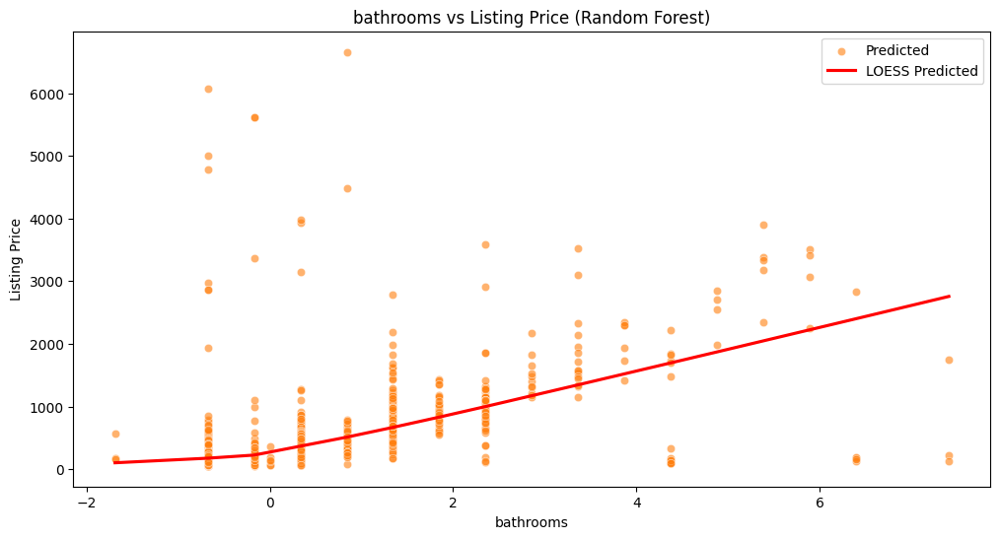

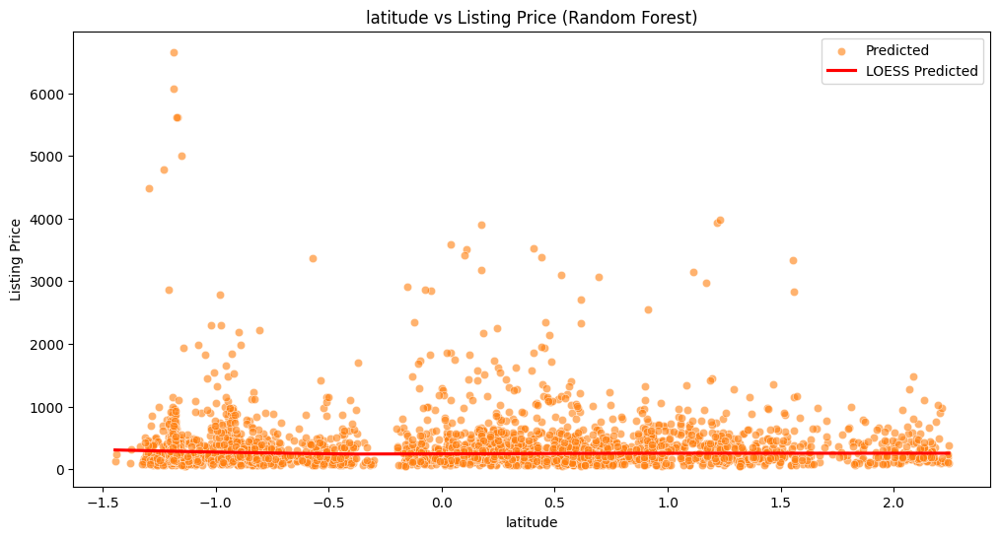

/usr/local/lib/python3.10/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


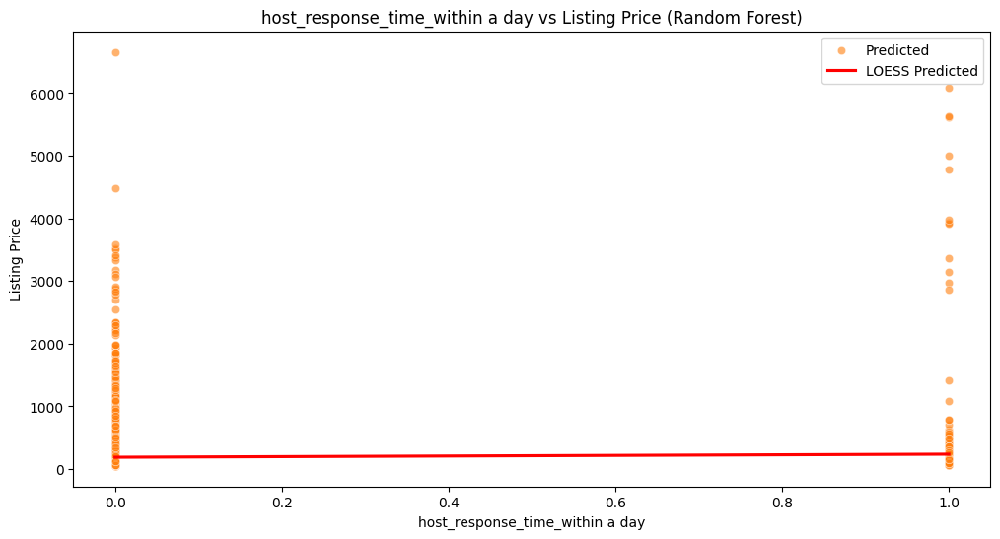

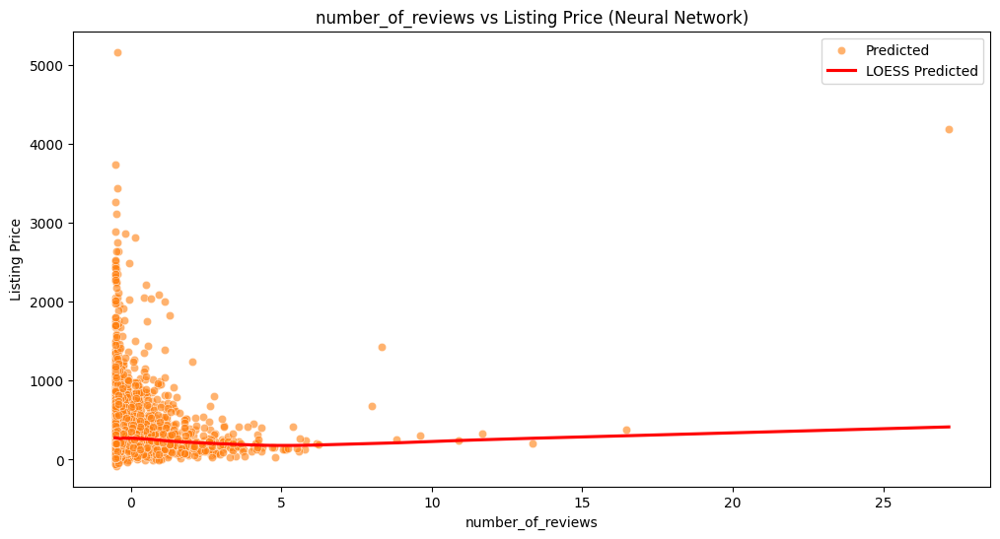

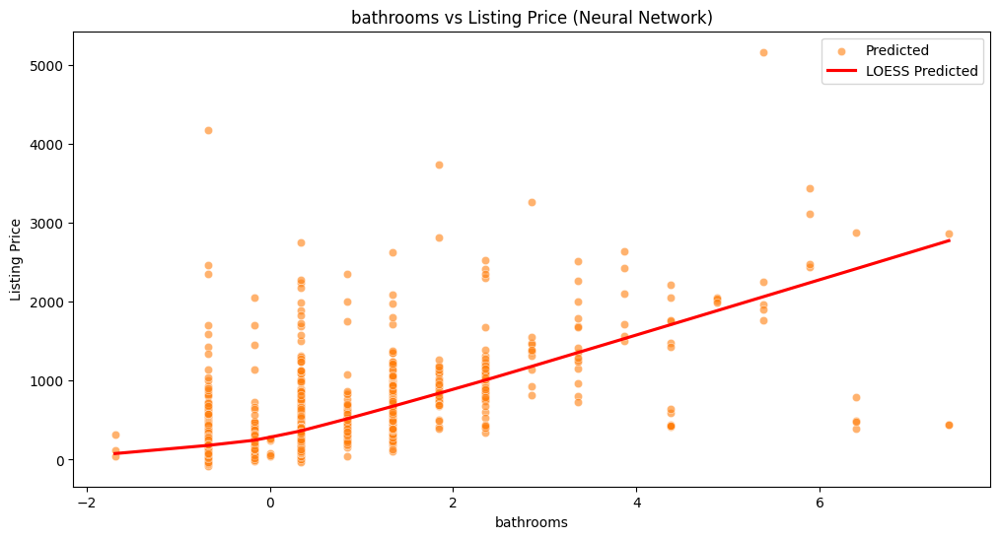

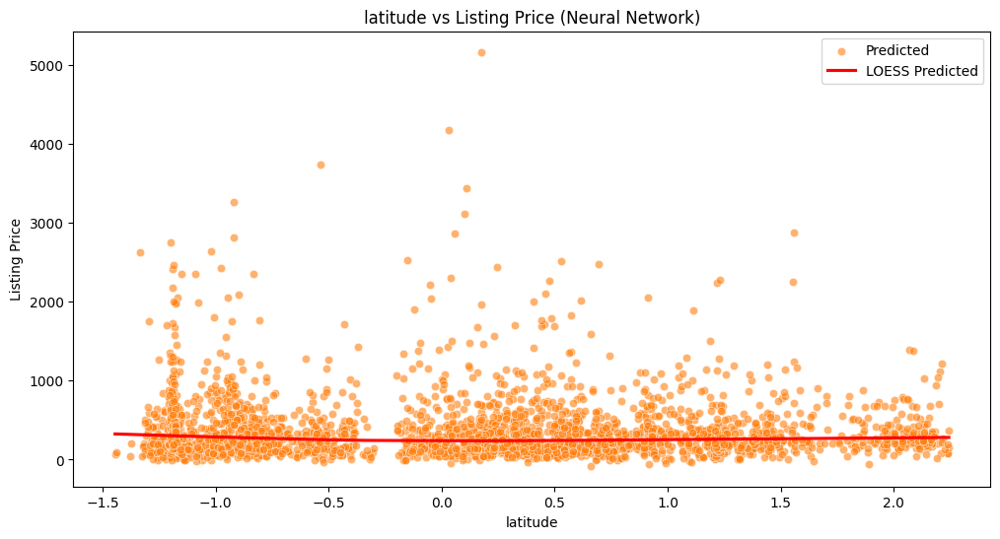

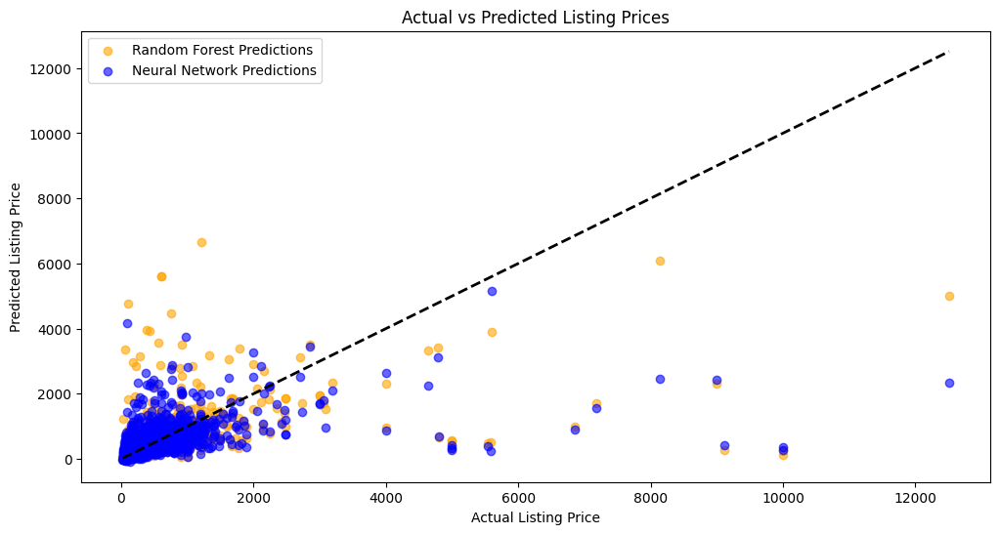

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'host_response_time_within a day']
nn_top_features = ['number_of_reviews', 'bathrooms', 'latitude']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_rf, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
    sns.regplot(x=feature, y='Listing Price', data=test_df_nn, scatter=False, lowess=True, color='black', label='LOESS Actual')
    sns.regplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, scatter=False, lowess=True, color='red', label='LOESS Predicted')
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot Actual vs Predicted Prices for both models
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf_tuned, label='Random Forest Predictions', alpha=0.6, color='orange')
plt.scatter(y_test, y_pred_nn, label='Neural Network Predictions', alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual Listing Price')
plt.ylabel('Predicted Listing Price')
plt.title('Actual vs Predicted Listing Prices')
plt.legend()
plt.show()


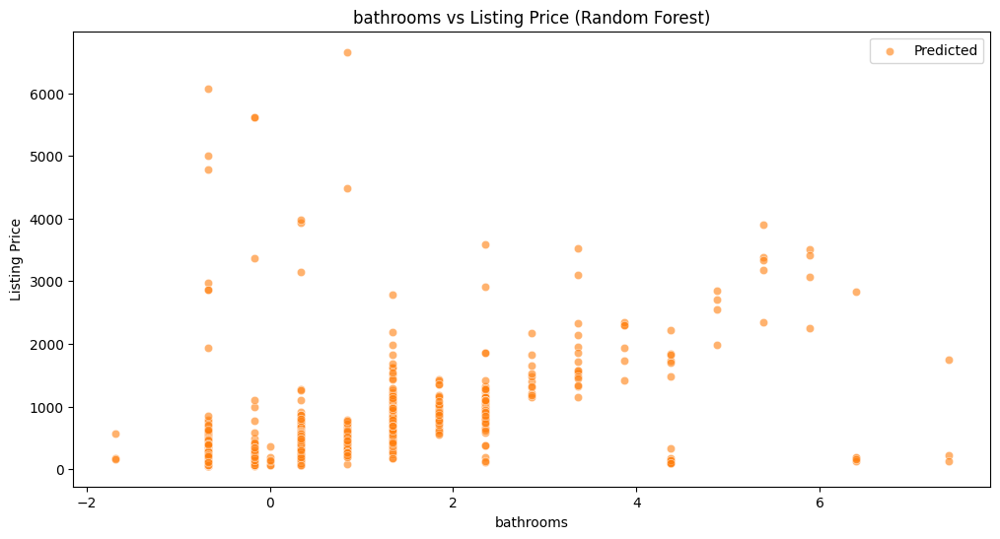

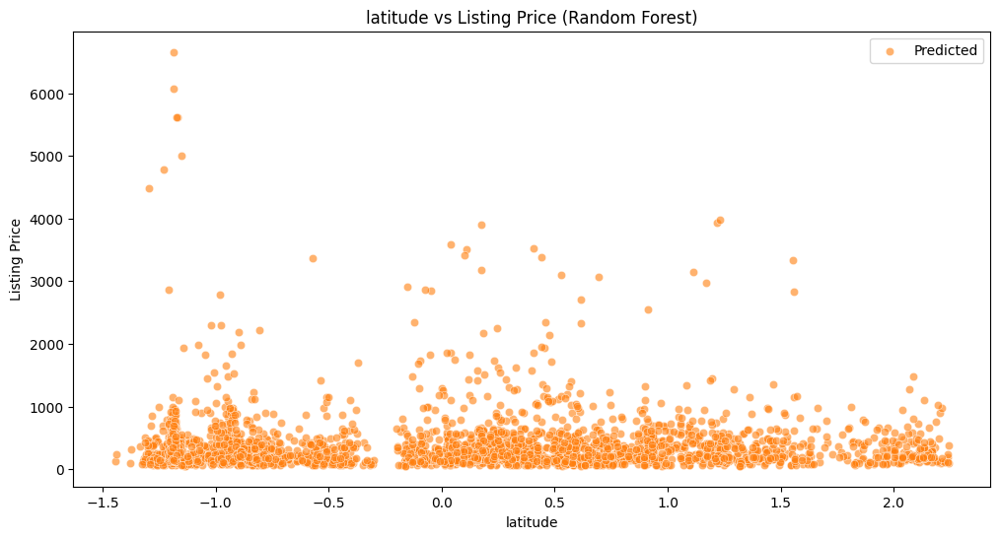

Feature host_response_time_within_a_day not found in test_df_rf columns


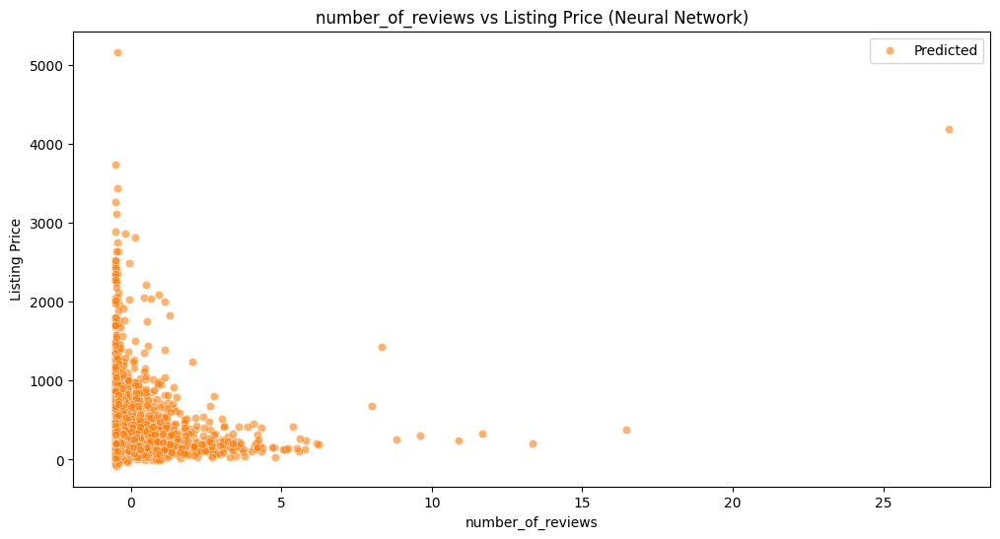

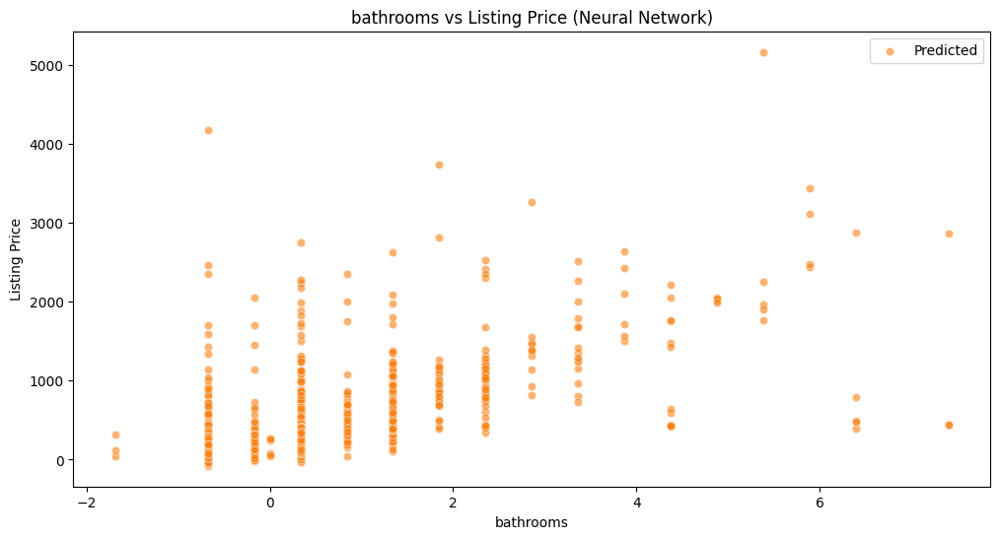

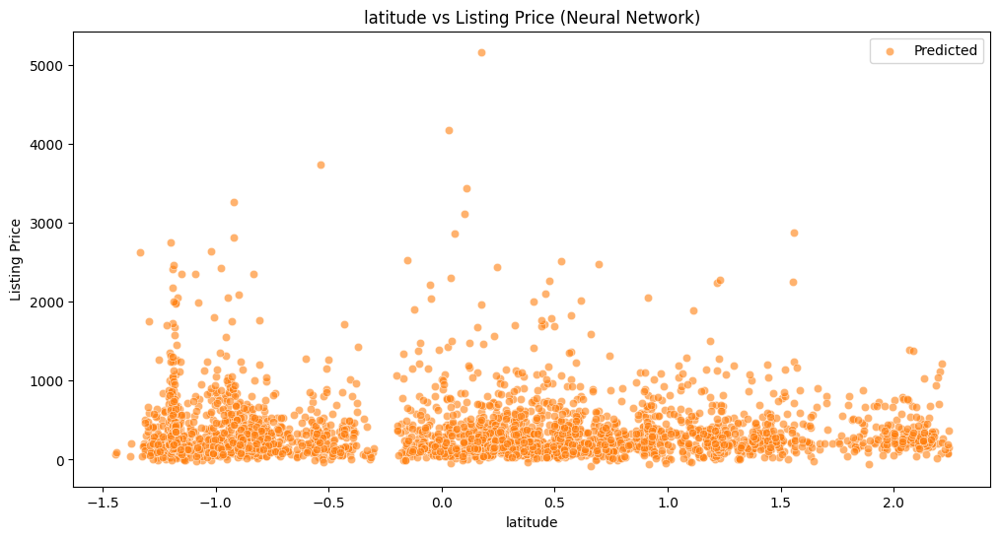

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming all_feature_names and top features are already defined

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])

# Combine actual and predicted prices with the test features for Random Forest
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
test_df_rf = pd.concat([X_test_df.reset_index(drop=True), y_test_df.reset_index(drop=True), y_pred_rf_df.reset_index(drop=True)], axis=1)

# Plot relationships for Random Forest Model
rf_top_features = ['bathrooms', 'latitude', 'host_response_time_within_a_day']
for feature in rf_top_features:
    if feature in test_df_rf.columns:
        plt.figure(figsize=(12, 6))
        sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
        sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
        plt.title(f'{feature} vs Listing Price (Random Forest)')
        plt.xlabel(feature)
        plt.ylabel('Listing Price')
        plt.legend()
        plt.show()
    else:
        print(f"Feature {feature} not found in test_df_rf columns")

# Combine actual and predicted prices with the test features for Neural Network
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])
test_df_nn = pd.concat([X_test_df.reset_index(drop=True), y_test_df.reset_index(drop=True), y_pred_nn_df.reset_index(drop=True)], axis=1)

# Plot relationships for Neural Network Model
nn_top_features = ['number_of_reviews', 'bathrooms', 'latitude']
for feature in nn_top_features:
    if feature in test_df_nn.columns:
        plt.figure(figsize=(12, 6))
        sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
        sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
        plt.title(f'{feature} vs Listing Price (Neural Network)')
        plt.xlabel(feature)
        plt.ylabel('Listing Price')
        plt.legend()
        plt.show()
    else:
        print(f"Feature {feature} not found in test_df_nn columns")


In [ ]:
import pandas as pd

# Check the columns in the DataFrame
print("Columns in test_df_rf:")
print(test_df_rf.columns)

# Check the contents of all_feature_names
print("Contents of all_feature_names:")
print(all_feature_names)


Columns in test_df_rf:
Index(['host_id', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'beds', 'minimum_nights', 'maximum_nights',
       'number_of_reviews', 'number_of_reviews_l30d', 'review_scores_rating',
       'reviews_per_month', 'bathrooms', 'vacancy_rate_30', 'vacancy_rate_60',
       'vacancy_rate_90', 'vacancy_rate_365', 'sentiment',
       'general_review_average', 'sub_review_average',
       'host_response_time_a few days or more',
       'host_response_time_within a day',
       'host_response_time_within a few hours',
       'host_response_time_within an hour', 'host_is_superhost_f',
       'host_is_superhost_t', 'room_type_Entire home/apt',
       'room_type_Hotel room', 'room_type_Private room',
       'room_type_Shared room', 'Listing Price', 'Predicted Listing Price RF'],
      dtype='object')
Contents of all_feature_names:
['host_id', 'host_listings_count', 'latitude', 'longitude', 'accommodates', 'beds', 'minimum_nights', 'maximum_nights',

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3492 entries, 0 to 3491
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   host_id                                3492 non-null   float64
 1   host_listings_count                    3492 non-null   float64
 2   latitude                               3492 non-null   float64
 3   longitude                              3492 non-null   float64
 4   accommodates                           3492 non-null   float64
 5   beds                                   3492 non-null   float64
 6   minimum_nights                         3492 non-null   float64
 7   maximum_nights                         3492 non-null   float64
 8   number_of_reviews                      3492 non-null   float64
 9   number_of_reviews_l30d                 3492 non-null   float64
 10  review_scores_rating                   3492 non-null   float64
 11  revi

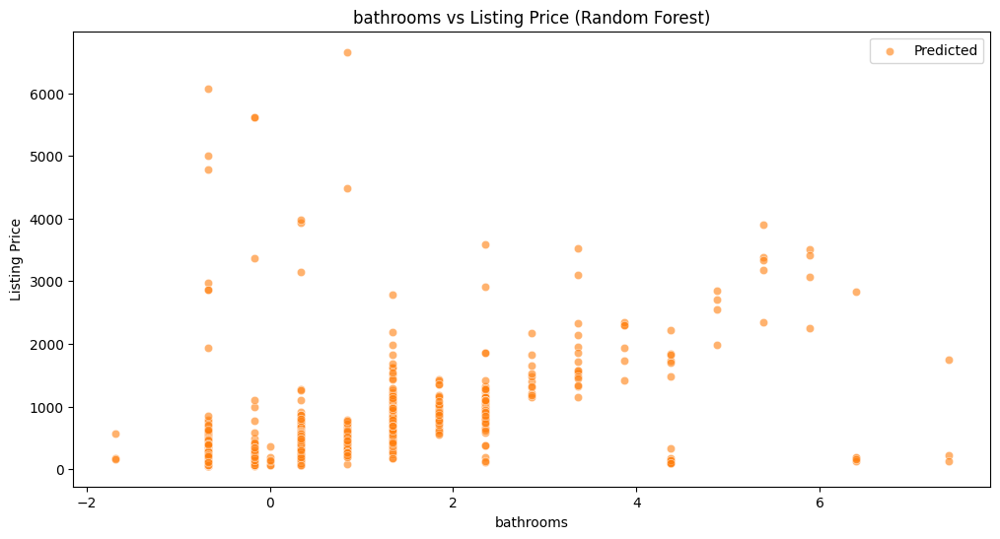

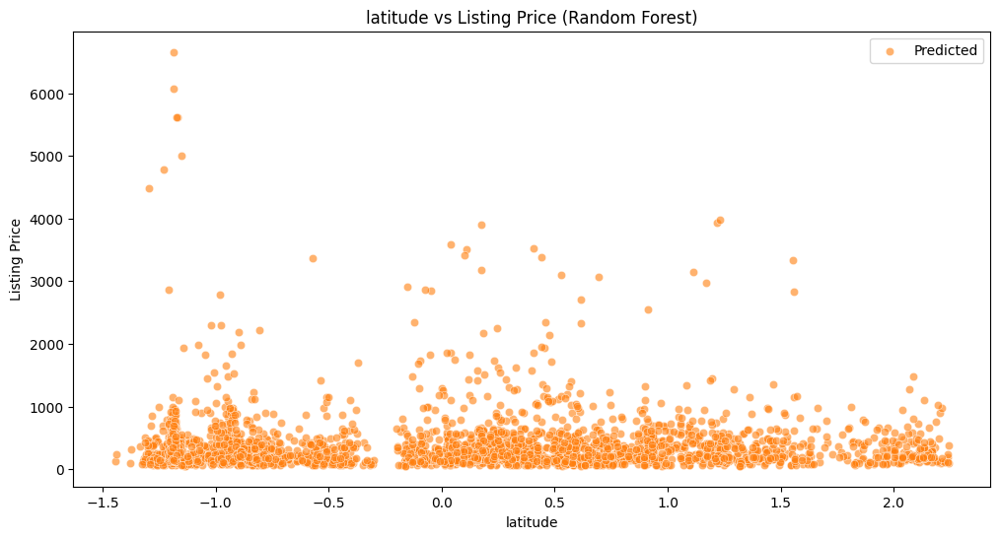

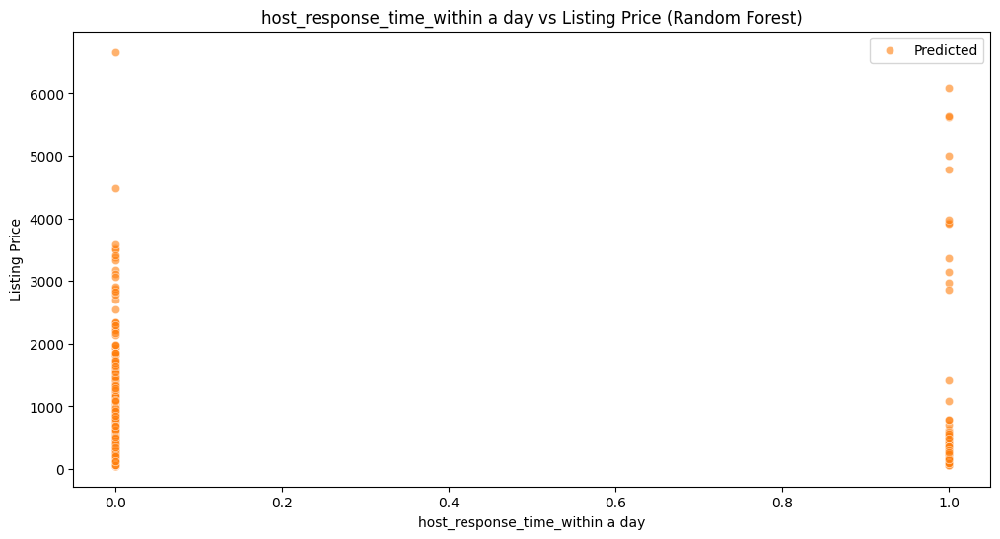

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3492 entries, 0 to 3491
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   host_id                                3492 non-null   float64
 1   host_listings_count                    3492 non-null   float64
 2   latitude                               3492 non-null   float64
 3   longitude                              3492 non-null   float64
 4   accommodates                           3492 non-null   float64
 5   beds                                   3492 non-null   float64
 6   minimum_nights                         3492 non-null   float64
 7   maximum_nights                         3492 non-null   float64
 8   number_of_reviews                      3492 non-null   float64
 9   number_of_reviews_l30d                 3492 non-null   float64
 10  review_scores_rating                   3492 non-null   float64
 11  revi

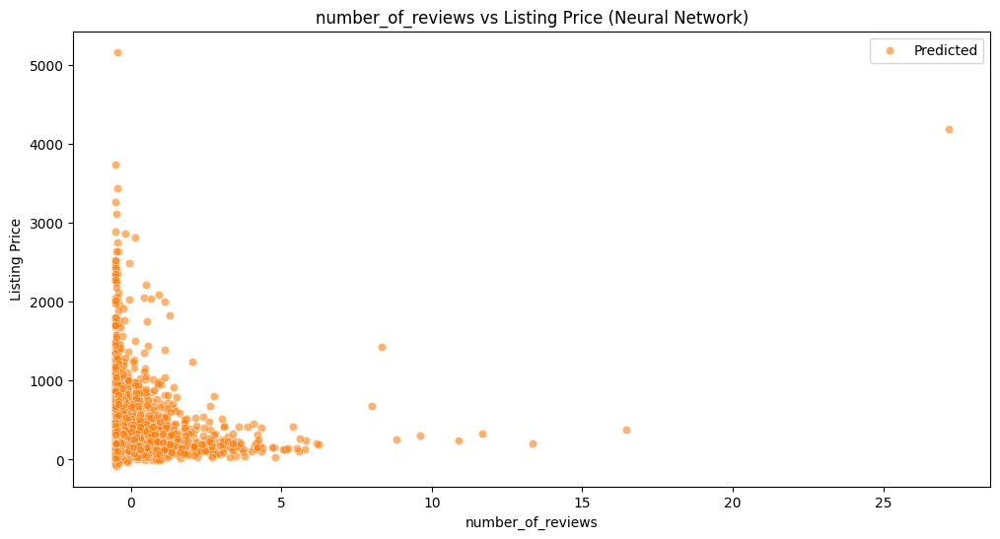

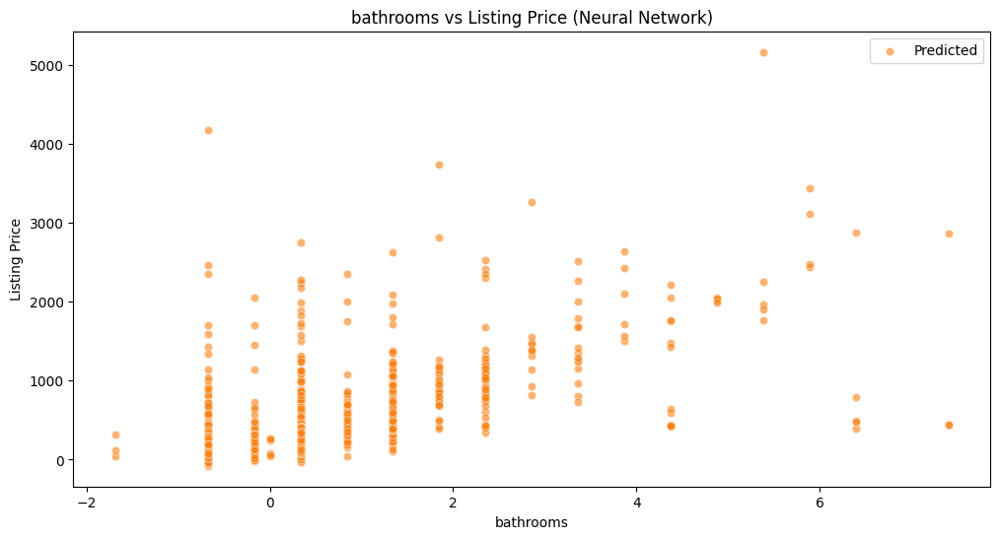

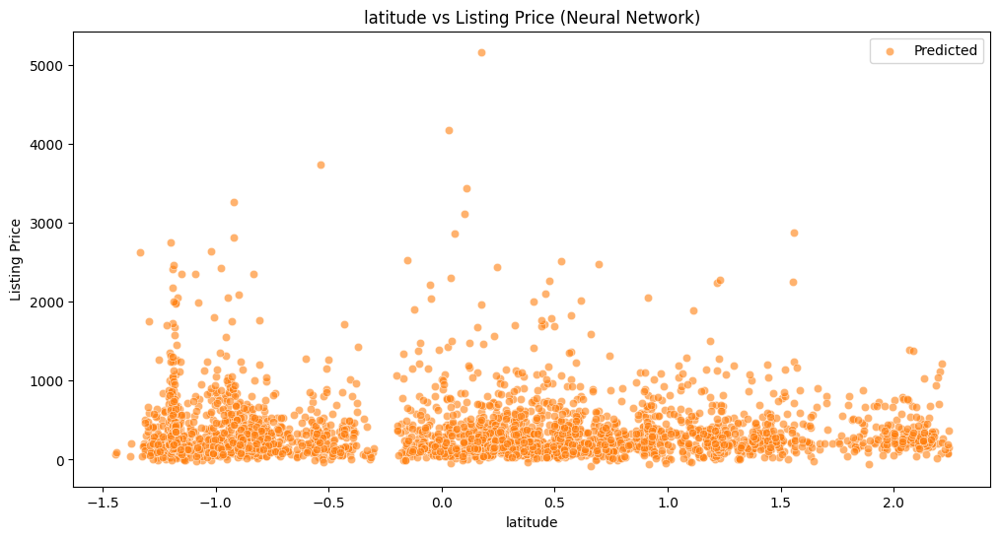

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define top features for Random Forest model
rf_top_features = ['bathrooms', 'latitude', 'host_response_time_within a day']

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])

# Combine actual and predicted prices with the test features for Random Forest
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
test_df_rf = pd.concat([X_test_df.reset_index(drop=True), y_test_df.reset_index(drop=True), y_pred_rf_df.reset_index(drop=True)], axis=1)

# Display DataFrame information
print(test_df_rf.info())

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    if feature in test_df_rf.columns:
        plt.figure(figsize=(12, 6))
        sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
        sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
        plt.title(f'{feature} vs Listing Price (Random Forest)')
        plt.xlabel(feature)
        plt.ylabel('Listing Price')
        plt.legend()
        plt.show()
    else:
        print(f"Feature {feature} not found in test_df_rf columns")

# Define top features for Neural Network model
nn_top_features = ['number_of_reviews', 'bathrooms', 'latitude']

# Combine actual and predicted prices with the test features for Neural Network
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])
test_df_nn = pd.concat([X_test_df.reset_index(drop=True), y_test_df.reset_index(drop=True), y_pred_nn_df.reset_index(drop=True)], axis=1)

# Display DataFrame information
print(test_df_nn.info())

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    if feature in test_df_nn.columns:
        plt.figure(figsize=(12, 6))
        sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
        sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
        plt.title(f'{feature} vs Listing Price (Neural Network)')
        plt.xlabel(feature)
        plt.ylabel('Listing Price')
        plt.legend()
        plt.show()
    else:
        print(f"Feature {feature} not found in test_df_nn columns")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure all arrays are 1-dimensional
y_test = y_test.flatten()
y_pred_rf_tuned = y_pred_rf_tuned.flatten()
y_pred_nn = y_pred_nn.flatten()

# Remove any entries where the prediction or actual values are less than or equal to zero
valid_indices = np.where((y_test > 0) & (y_pred_rf_tuned > 0) & (y_pred_nn > 0))

# Filter the arrays
y_test_valid = y_test[valid_indices]
y_pred_rf_tuned_valid = y_pred_rf_tuned[valid_indices]
y_pred_nn_valid = y_pred_nn[valid_indices]

# Apply log transformation
y_test_log = np.log1p(y_test_valid)
y_pred_rf_tuned_log = np.log1p(y_pred_rf_tuned_valid)
y_pred_nn_log = np.log1p(y_pred_nn_valid)

# Plot Actual vs Predicted Prices with log transformation and LOESS lines
plt.figure(figsize=(12, 6))
sns.scatterplot(x=y_test_log, y=y_pred_rf_tuned_log, label='Random Forest Predictions', alpha=0.6, color='orange', marker='o')
sns.scatterplot(x=y_test_log, y=y_pred_nn_log, label='Neural Network Predictions', alpha=0.6, color='blue', marker='x')

# Add LOESS lines for each model
sns.regplot(x=y_test_log, y=y_pred_rf_tuned_log, scatter=False, lowess=True, color='orange', label='Random Forest LOESS')
sns.regplot(x=y_test_log, y=y_pred_nn_log, scatter=False, lowess=True, color='blue', label='Neural Network LOESS')

plt.plot([y_test_log.min(), y_test_log.max()], [y_test_log.min(), y_test_log.max()], 'k--', lw=2)
plt.xlabel('Actual Listing Price (log-transformed)')
plt.ylabel('Predicted Listing Price (log-transformed)')
plt.title('Actual vs Predicted Listing Prices (log-transformed)')
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()


AttributeError: 'Series' object has no attribute 'flatten'

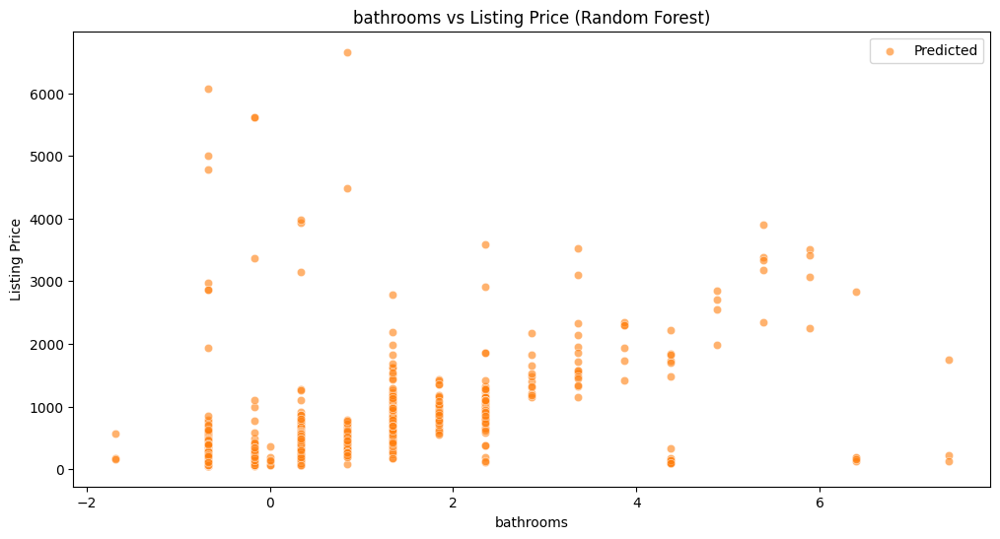

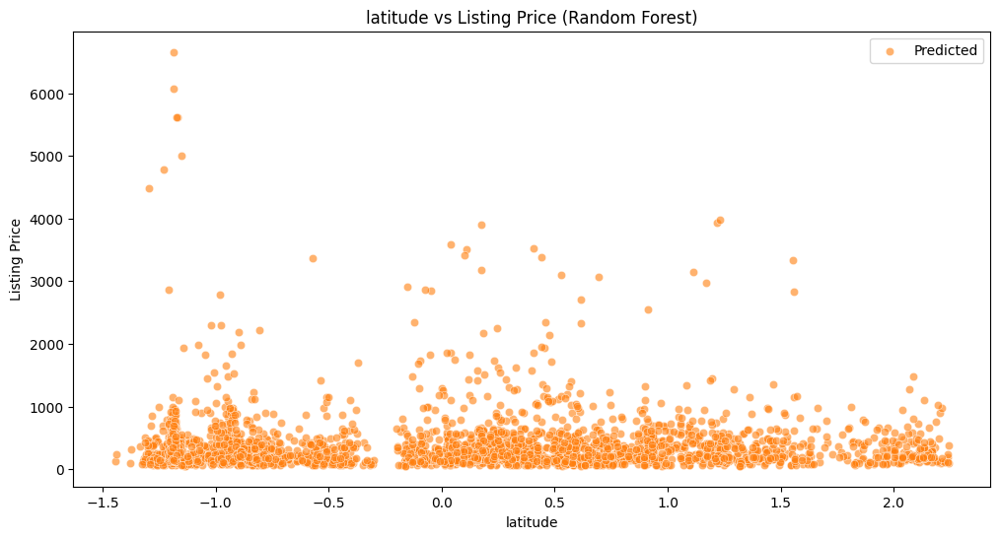

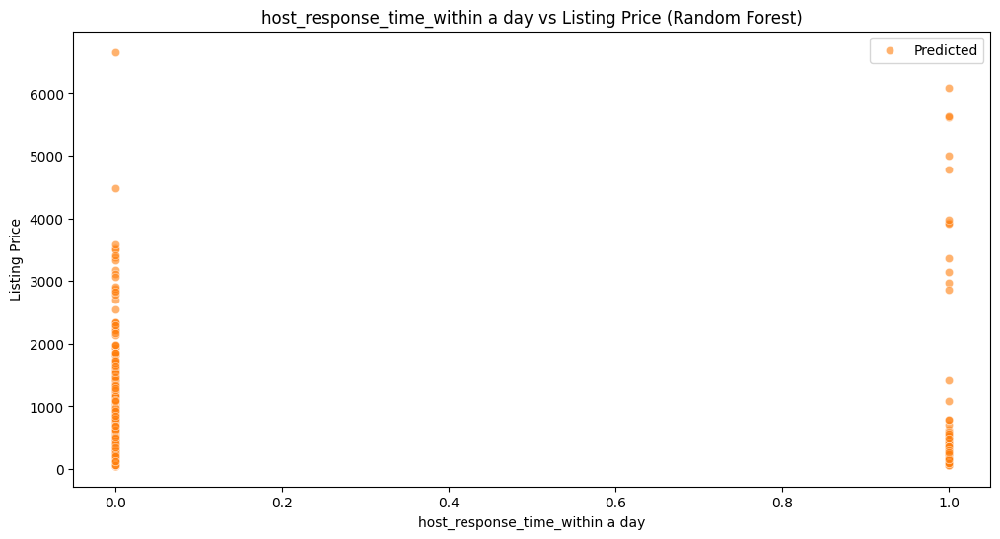

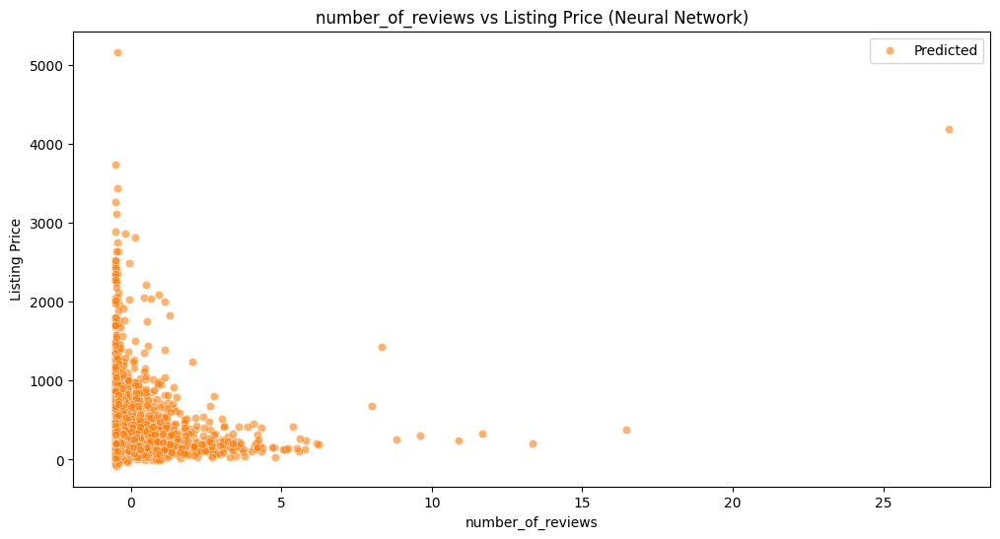

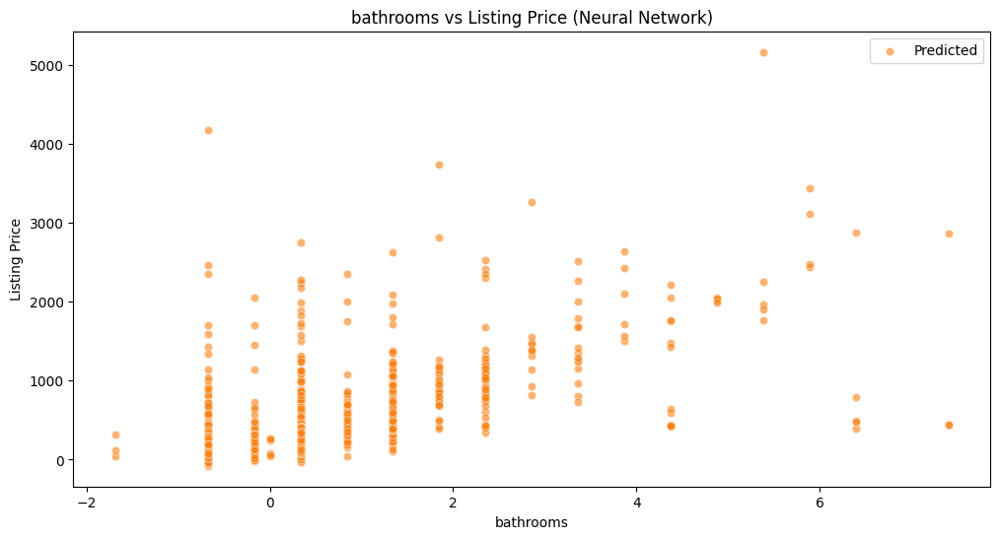

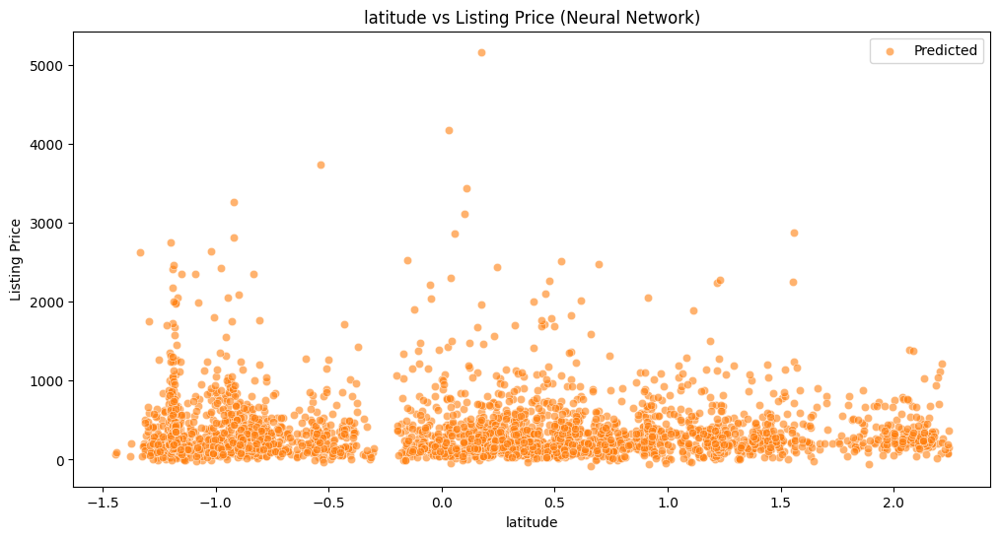

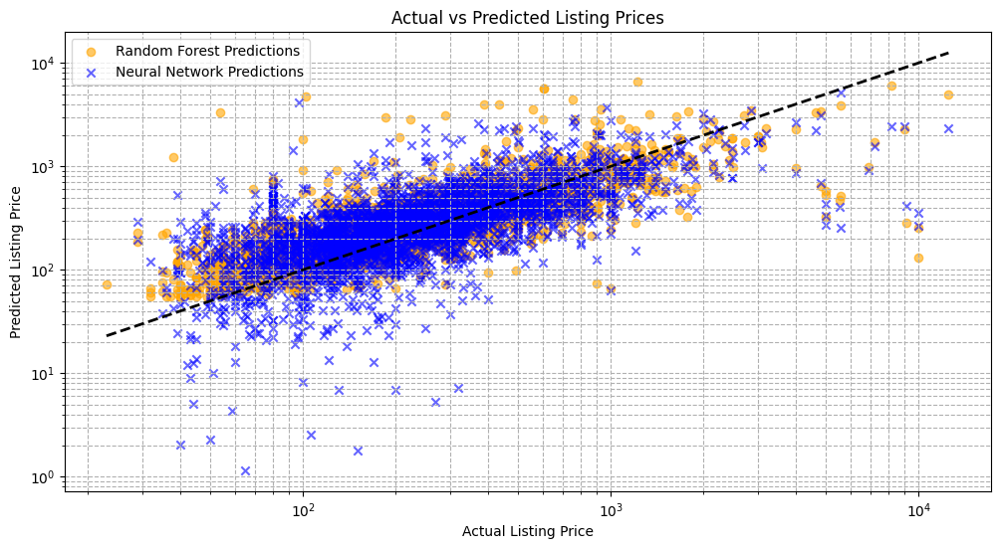

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming all_feature_names, X_test, y_test, y_pred_rf_tuned, and y_pred_nn are already defined.

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Define top features for both models
rf_top_features = ['bathrooms', 'latitude', 'host_response_time_within a day']
nn_top_features = ['number_of_reviews', 'bathrooms', 'latitude']

# Ensure features exist in the DataFrame
rf_top_features = [feature for feature in rf_top_features if feature in test_df_rf.columns]
nn_top_features = [feature for feature in nn_top_features if feature in test_df_nn.columns]

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()

# Plot Actual vs Predicted Prices for both models
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf_tuned, label='Random Forest Predictions', alpha=0.6, color='orange', marker='o')
plt.scatter(y_test, y_pred_nn, label='Neural Network Predictions', alpha=0.6, color='blue', marker='x')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Actual Listing Price')
plt.ylabel('Predicted Listing Price')
plt.title('Actual vs Predicted Listing Prices')
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()


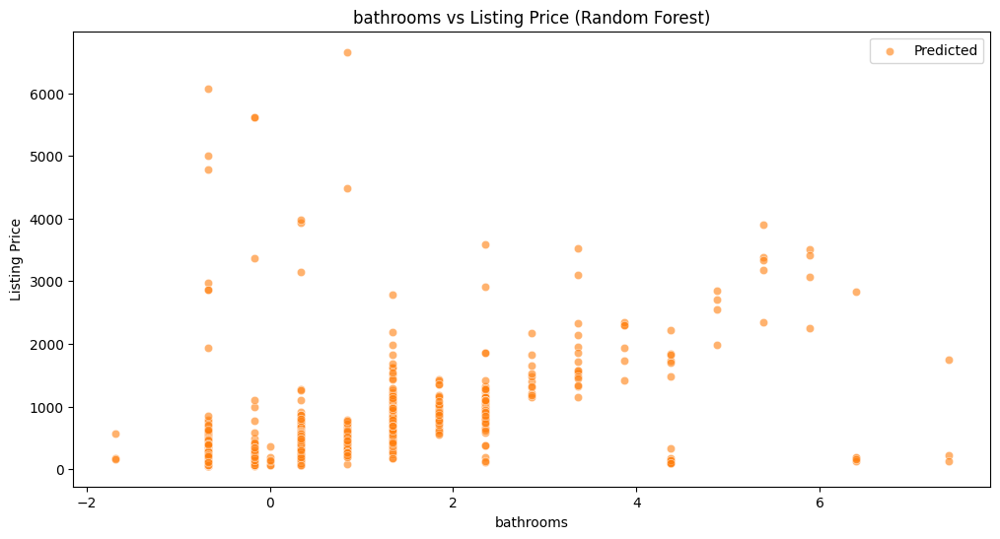

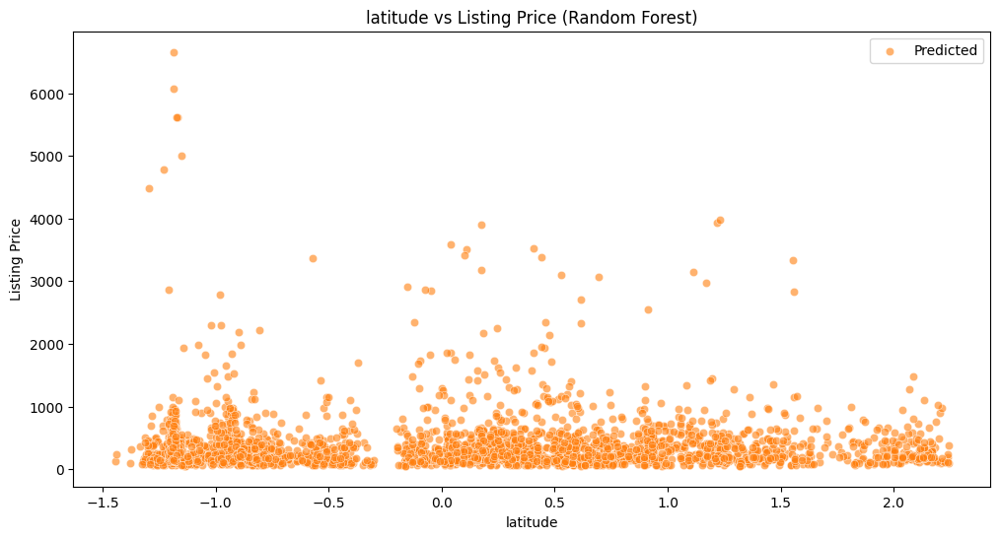

ValueError: Could not interpret value `host_response_time_within_a_day` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define top features for Random Forest model
rf_top_features = ['bathrooms', 'latitude', 'host_response_time_within_a_day']

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_rf_df = pd.DataFrame(y_pred_rf_tuned, columns=['Predicted Listing Price RF'])

# Combine actual and predicted prices with the test features
test_df_rf = pd.concat([X_test_df, y_test_df, y_pred_rf_df], axis=1)

# Plot relationships for Random Forest Model
for feature in rf_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_rf, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price RF', data=test_df_rf, label='Predicted', alpha=0.6)
    plt.title(f'{feature} vs Listing Price (Random Forest)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()


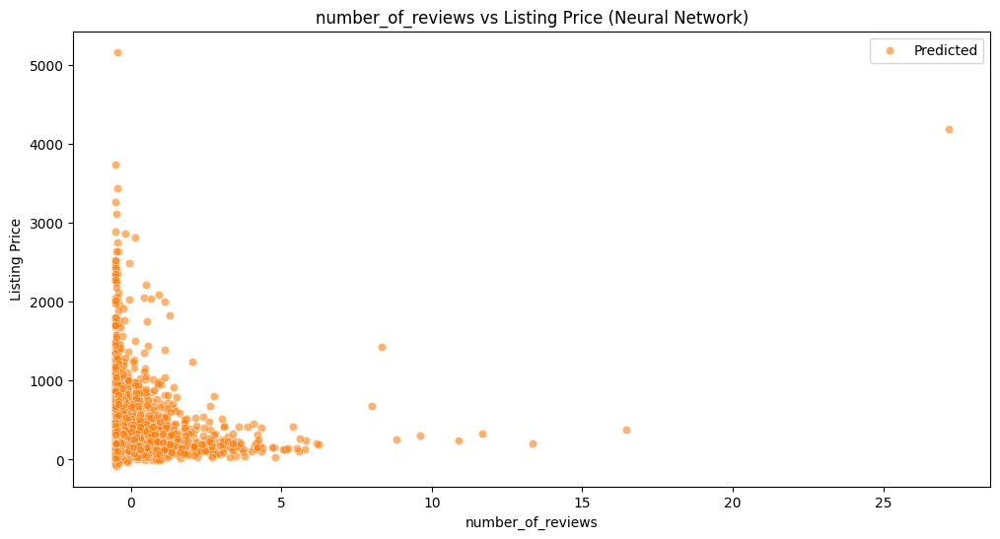

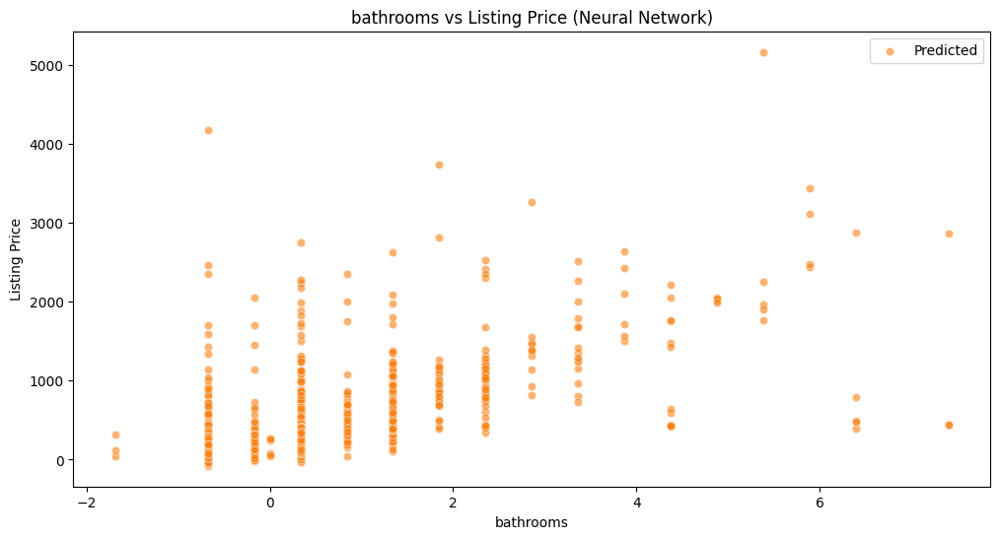

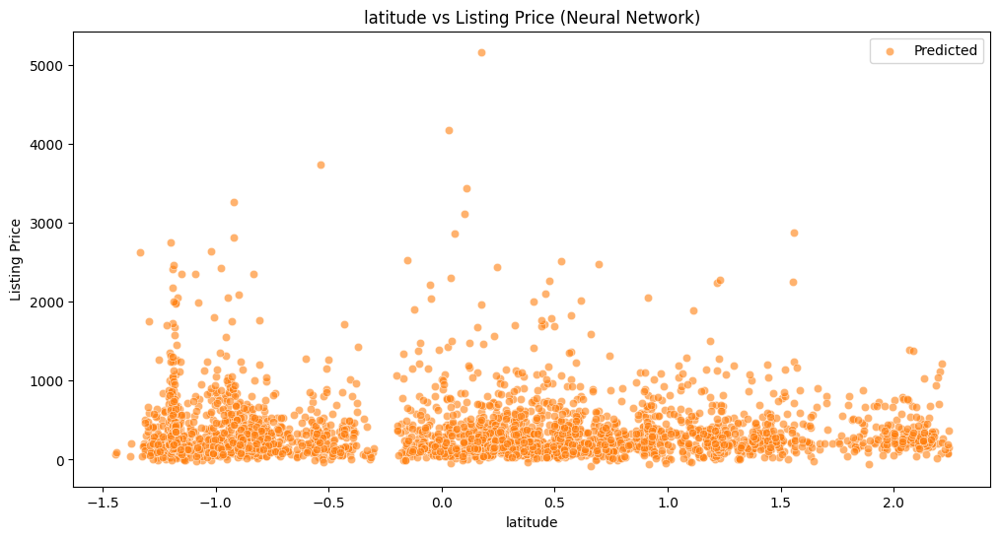

In [ ]:
# Define top features for Neural Network model
nn_top_features = ['number_of_reviews', 'bathrooms', 'latitude']

# Convert X_test and y_test back to a DataFrame for easier manipulation
y_pred_nn_df = pd.DataFrame(y_pred_nn, columns=['Predicted Listing Price NN'])

# Combine actual and predicted prices with the test features
test_df_nn = pd.concat([X_test_df, y_test_df, y_pred_nn_df], axis=1)

# Plot relationships for Neural Network Model
for feature in nn_top_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='Listing Price', data=test_df_nn, label='Actual', alpha=0.6)
    sns.scatterplot(x=feature, y='Predicted Listing Price NN', data=test_df_nn, label='Predicted', alpha=0.6)
    plt.title(f'{feature} vs Listing Price (Neural Network)')
    plt.xlabel(feature)
    plt.ylabel('Listing Price')
    plt.legend()
    plt.show()


Tuned Random Forest MSE: 272121.7621450958
Tuned Random Forest RMSE: 521.6529134828021
Tuned Random Forest MAE: 155.42523310523634
Tuned Random Forest R^2: 0.23240019695144587


IndexError: list index out of range

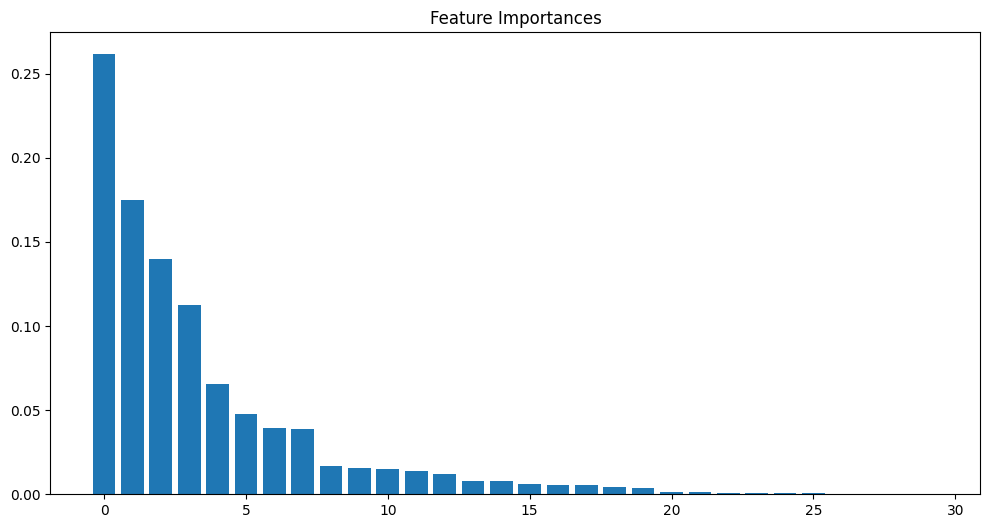

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Best hyperparameters for the Random Forest model
best_params = {'n_estimators': 323, 'max_depth': 16, 'min_samples_split': 8, 'min_samples_leaf': 10}

# Train the Random Forest model with the best hyperparameters
rf_model_tuned = RandomForestRegressor(
    n_jobs=-1,
    random_state=42,
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf']
)

rf_model_tuned.fit(X_train, y_train)

# Make predictions
y_pred_rf_tuned = rf_model_tuned.predict(X_test)

# Evaluate the model
mse_rf_tuned = mean_squared_error(y_test, y_pred_rf_tuned)
rmse_rf_tuned = np.sqrt(mse_rf_tuned)
mae_rf_tuned = mean_absolute_error(y_test, y_pred_rf_tuned)
r2_rf_tuned = r2_score(y_test, y_pred_rf_tuned)

print(f'Tuned Random Forest MSE: {mse_rf_tuned}')
print(f'Tuned Random Forest RMSE: {rmse_rf_tuned}')
print(f'Tuned Random Forest MAE: {mae_rf_tuned}')
print(f'Tuned Random Forest R^2: {r2_rf_tuned}')

# Plot feature importances
importances = rf_model_tuned.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


## Random Forest Model (Top 3 Features)

Bathrooms
Latitude
Host Response Time (within a day)

##
Neural Network Model (Top 3 Features)
Number of Reviews
Bathrooms
Latitude

We will plot the relationship between these features and the listing price.

### Random Forest Model - Feature Plots

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming X_test is a numpy array and y_test is also a numpy array
# Update all_feature_names to include all feature names
all_feature_names = ['feature1', 'feature2', 'bathrooms', 'latitude', 'feature3', 'host_response_time_within_a_day', 'number_of_reviews', ...]

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names[:X_test.shape[1]])
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_df = pd.DataFrame(y_pred_rf, columns=['Predicted Listing Price'])

# Combine actual and predicted prices with the test features
test_df = pd.concat([X_test_df, y_test_df, y_pred_df], axis=1)

# Define top features based on feature importances
top_features = ['bathrooms', 'latitude', 'host_response_time_within_a_day']

# Bathrooms vs Listing Price
plt.figure(figsize=(12, 6))
sns.scatterplot(x='bathrooms', y='Listing Price', data=test_df, label='Actual', alpha=0.6)
sns.scatterplot(x='bathrooms', y='Predicted Listing Price', data=test_df, label='Predicted', alpha=0.6)
plt.title('Bathrooms vs Listing Price')
plt.xlabel('Bathrooms')
plt.ylabel('Listing Price')
plt.legend()
plt.show()

# Latitude vs Listing Price
plt.figure(figsize=(12, 6))
sns.scatterplot(x='latitude', y='Listing Price', data=test_df, label='Actual', alpha=0.6)
sns.scatterplot(x='latitude', y='Predicted Listing Price', data=test_df, label='Predicted', alpha=0.6)
plt.title('Latitude vs Listing Price')
plt.xlabel('Latitude')
plt.ylabel('Listing Price')
plt.legend()
plt.show()

# Host Response Time (within a day) vs Listing Price
plt.figure(figsize=(12, 6))
sns.barplot(x='host_response_time_within_a_day', y='Listing Price', data=test_df, ci=None, label='Actual', alpha=0.6)
sns.barplot(x='host_response_time_within_a_day', y='Predicted Listing Price', data=test_df, ci=None, label='Predicted', alpha=0.6)
plt.title('Host Response Time (within a day) vs Listing Price')
plt.xlabel('Host Response Time (within a day)')
plt.ylabel('Listing Price')
plt.legend()
plt.show()


ValueError: Shape of passed values is (3492, 30), indices imply (3492, 8)

In [ ]:
# Example list of 30 feature names. Replace this list with your actual feature names.
all_feature_names = [
    'feature1', 'feature2', 'bathrooms', 'latitude', 'feature3',
    'host_response_time_within_a_day', 'number_of_reviews', 'feature4',
    'feature5', 'feature6', 'feature7', 'feature8', 'feature9',
    'feature10', 'feature11', 'feature12', 'feature13', 'feature14',
    'feature15', 'feature16', 'feature17', 'feature18', 'feature19',
    'feature20', 'feature21', 'feature22', 'feature23', 'feature24',
    'feature25', 'feature26', 'feature27'
]

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Convert X_test and y_test back to a DataFrame for easier manipulation
X_test_df = pd.DataFrame(X_test, columns=all_feature_names)
y_test_df = pd.DataFrame(y_test, columns=['Listing Price'])
y_pred_df = pd.DataFrame(y_pred_rf, columns=['Predicted Listing Price'])

# Combine actual and predicted prices with the test features
test_df = pd.concat([X_test_df, y_test_df, y_pred_df], axis=1)

# Define top features based on feature importances
top_features = ['bathrooms', 'latitude', 'host_response_time_within_a_day']

# Bathrooms vs Listing Price
plt.figure(figsize=(12, 6))
sns.scatterplot(x='bathrooms', y='Listing Price', data=test_df, label='Actual', alpha=0.6)
sns.scatterplot(x='bathrooms', y='Predicted Listing Price', data=test_df, label='Predicted', alpha=0.6)
plt.title('Bathrooms vs Listing Price')
plt.xlabel('Bathrooms')
plt.ylabel('Listing Price')
plt.legend()
plt.show()

# Latitude vs Listing Price
plt.figure(figsize=(12, 6))
sns.scatterplot(x='latitude', y='Listing Price', data=test_df, label='Actual', alpha=0.6)
sns.scatterplot(x='latitude', y='Predicted Listing Price', data=test_df, label='Predicted', alpha=0.6)
plt.title('Latitude vs Listing Price')
plt.xlabel('Latitude')
plt.ylabel('Listing Price')
plt.legend()
plt.show()

# Host Response Time (within a day) vs Listing Price
plt.figure(figsize=(12, 6))
sns.barplot(x='host_response_time_within_a_day', y='Listing Price', data=test_df, ci=None, label='Actual', alpha=0.6)
sns.barplot(x='host_response_time_within_a_day', y='Predicted Listing Price', data=test_df, ci=None, label='Predicted', alpha=0.6)
plt.title('Host Response Time (within a day) vs Listing Price')
plt.xlabel('Host Response Time (within a day)')
plt.ylabel('Listing Price')
plt.legend()
plt.show()


ValueError: Shape of passed values is (3492, 30), indices imply (3492, 31)

In [ ]:
from google.colab import drive
import pandas as pd
import geopandas as gpd
import os

drive.mount("/content/drive", force_remount=True)
mount_point = '/content/drive/MyDrive/airbnd/airbnb-price-analysis/data'

# Check if the directory exists
if os.path.exists(mount_point):
    # Change the current working directory to the specified path
    os.chdir(mount_point)
    print(f"Changed current directory to {mount_point}")
else:
    print(f"The directory {mount_point} does not exist in your Google Drive.")

# Define file paths (update these paths based on your local directory)
file_paths = {
    "listings": "listings.csv.gz",
    "calendar": "calendar.csv.gz",
    "reviews": "reviews.csv.gz",
    "listings_summary": "listings.csv",
    "reviews_summary": "reviews.csv",
    "neighbourhoods": "neighbourhoods.csv",
    "neighbourhoods_geojson": "neighbourhoods.geojson"
}


# Load files into individual dataframes
listings = pd.read_csv(file_paths["listings"], low_memory=False)
calendar = pd.read_csv(file_paths["calendar"], low_memory=False)
reviews = pd.read_csv(file_paths["reviews"], low_memory=False)
listings_summary = pd.read_csv(file_paths["listings_summary"], low_memory=False)
reviews_summary = pd.read_csv(file_paths["reviews_summary"], low_memory=False)
neighbourhoods = pd.read_csv(file_paths["neighbourhoods"], low_memory=False)
neighbourhoods_geojson = gpd.read_file(file_paths["neighbourhoods_geojson"])

# Display summary and head of each dataframe
dataframes = {
    "listings": listings,
    "calendar": calendar,
    "reviews": reviews,
    "listings_summary": listings_summary,
    "reviews_summary": reviews_summary,
    "neighbourhoods": neighbourhoods,
    "neighbourhoods_geojson": neighbourhoods_geojson
}

for df_name, df in dataframes.items():
    print(f"DataFrame name: {df_name}")
    print(f"Summary of {df_name}:")
    print(df.info())
    print(f"\nFirst 5 rows of {df_name}:")
    print(df.head())
    print("\n")

Mounted at /content/drive
Changed current directory to /content/drive/MyDrive/airbnd/airbnb-price-analysis/data
DataFrame name: listings
Summary of listings:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18230 entries, 0 to 18229
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            18230 non-null  int64  
 1   listing_url                                   18230 non-null  object 
 2   scrape_id                                     18230 non-null  int64  
 3   last_scraped                                  18230 non-null  object 
 4   source                                        18230 non-null  object 
 5   name                                          18230 non-null  object 
 6   description                                   0 non-null      float64
 7   neighborhood_overview                         11081 n

Now we display the columns in `listings`

In [ ]:
# Adjust display settings to show all columns
pd.set_option('display.max_columns', None)
listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,57818,https://www.airbnb.com/rooms/57818,20231225202534,2023-12-26,city scrape,Home in Hollywood · ★4.63 · 2 bedrooms · 2 bed...,NaN,Check-in window<br />After 3:00 PM<br />Edit<b...,https://a0.muscache.com/pictures/miso/Hosting-...,275948,https://www.airbnb.com/users/show/275948,Von Inc,2010-11-01,"Hollywood, FL","I love my house...the neighbors are wonderful,...",within an hour,100%,96%,t,https://a0.muscache.com/im/pictures/user/1f267...,https://a0.muscache.com/im/pictures/user/1f267...,NaN,3.0,3.0,"['email', 'phone']",t,t,"Hollywood, Florida, United States",Hollywood,NaN,26.01859,-80.12430,Entire home,Entire home/apt,4,NaN,1 bath,NaN,2.0,[],$190.00,32,1125,1,32,1125,1125,31.9,1125.0,NaN,t,2,2,10,214,2023-12-26,58,1,0,2013-01-03,2023-03-31,4.63,4.69,4.61,5.00,4.97,4.88,4.71,NaN,f,2,2,0,0,0.43
1,69824,https://www.airbnb.com/rooms/69824,20231225202534,2023-12-26,city scrape,Rental unit in Hallandale · ★4.0 · 2 bedrooms ...,NaN,NaN,https://a0.muscache.com/pictures/443102/f6b94e...,351303,https://www.airbnb.com/users/show/351303,Tracy,2011-01-17,"Silver Spring, MD",NaN,within an hour,100%,50%,f,https://a0.muscache.com/im/users/351303/profil...,https://a0.muscache.com/im/users/351303/profil...,NaN,3.0,5.0,"['email', 'phone']",t,t,NaN,Hallandale Beach,NaN,25.97641,-80.12052,Entire rental unit,Entire home/apt,6,NaN,2 baths,NaN,4.0,[],$140.00,30,365,30,30,365,365,30.0,365.0,NaN,t,19,19,19,281,2023-12-26,4,2,0,2021-03-27,2023-06-03,4.00,4.50,4.00,4.75,4.75,5.00,4.50,NaN,f,2,2,0,0,0.12
2,83449,https://www.airbnb.com/rooms/83449,20231225202534,2023-12-27,city scrape,Rental unit in Dania Beach · ★4.77 · 2 bedroom...,NaN,"Residential neighborhood, less than 2 miles to...",https://a0.muscache.com/pictures/8c21bda0-5194...,454736,https://www.airbnb.com/users/show/454736,"Jon, Mary Pop Apartments",2011-03-21,"Dania Beach, FL","LOCATION,LOCATION,LOCATION, NUMBER 1 ACCOMMOD...",within an hour,100%,97%,f,https://a0.muscache.com/im/users/454736/profil...,https://a0.muscache.com/im/users/454736/profil...,NaN,17.0,20.0,"['email', 'phone']",t,t,"Dania Beach, Florida, United States",Dania Beach,NaN,26.03392,-80.14201,Entire rental unit,Entire home/apt,5,NaN,1 bath,NaN,3.0,[],$127.00,7,180,7,7,180,180,7.0,180.0,NaN,t,0,1,1,1,2023-12-27,31,9,1,2011-11-01,2023-12-17,4.77,4.87,4.84,4.94,4.90,4.81,4.87,NaN,f,15,15,0,0,0.21
3,105411,https://www.airbnb.com/rooms/105411,20231225202534,2023-12-26,city scrape,Rental unit in Southwest Ranches · ★5.0 · 3 be...,NaN,"Very close to I75, one of the main highways. Y...",https://a0.muscache.com/pictures/787317/2cc18e...,532930,https://www.airbnb.com/users/show/532930,Sonia,2011-04-25,"Southwest Ranches, FL",We are 

## Reducing Uneccesary Columns

In [ ]:
# Remove unnecessary columns
columns_to_remove = [
    "listing_url", "scrape_id", "last_scraped", "source", "description",
    "neighborhood_overview", "picture_url", "host_url", "host_about",
    "host_thumbnail_url", "host_picture_url", "host_neighbourhood",
    "neighbourhood", "neighbourhood_group_cleansed", "bathrooms",
    "bedrooms", "amenities", "calendar_updated", "calendar_last_scraped",
    "license", "instant_bookable", "host_verifications", "property_type", "name", "minimum_minimum_nights", "maximum_minimum_nights", "minimum_maximum_nights", "maximum_maximum_nights",
    "minimum_nights_avg_ntm", "maximum_nights_avg_ntm", "calculated_host_listings_count", "calculated_host_listings_count_entire_homes", "calculated_host_listings_count_private_rooms", "calculated_host_listings_count_shared_rooms"
]

listings_cleaned = listings.drop(columns=columns_to_remove)

# Clean the price column by removing dollar signs and converting to numeric
listings_cleaned['price'] = listings_cleaned['price'].replace('[\$,]', '', regex=True).astype(float)

# Extract numeric values from bathrooms_text and create a new bathrooms column
listings_cleaned['bathrooms'] = listings_cleaned['bathrooms_text'].str.extract('(\d+(\.\d+)?)')[0].astype(float)

# Drop the old bathrooms_text column
listings_cleaned.drop(columns=['bathrooms_text'], inplace=True)

# Calculate vacancy and booking rates
listings_cleaned['vacancy_rate_30'] = listings_cleaned['availability_30'] / 30
listings_cleaned['vacancy_rate_60'] = listings_cleaned['availability_60'] / 60
listings_cleaned['vacancy_rate_90'] = listings_cleaned['availability_90'] / 90
listings_cleaned['vacancy_rate_365'] = listings_cleaned['availability_365'] / 365


# Display the first 5 rows of the cleaned dataframe
listings_cleaned.head(10)

,id,host_id,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,bathrooms,vacancy_rate_30,vacancy_rate_60,vacancy_rate_90,vacancy_rate_365
0,57818,275948,Von Inc,2010-11-01,"Hollywood, FL",within an hour,100%,96%,t,3.0,3.0,t,t,Hollywood,26.01859,-80.12430,Entire home/apt,4,2.0,190.0,32,1125,t,2,2,10,214,58,1,0,2013-01-03,2023-03-31,4.63,4.69,4.61,5.00,4.97,4.88,4.71,0.43,1.0,0.066667,0.033333,0.111111,0.586301
1,69824,351303,Tracy,2011-01-17,"Silver Spring, MD",within an hour,100%,50%,f,3.0,5.0,t,t,Hallandale Beach,25.97641,-80.12052,Entire home/apt,6,4.0,140.0,30,365,t,19,19,19,281,4,2,0,2021-03-27,2023-06-03,4.00,4.50,4.00,4.75,4.75,5.00,4.50,0.12,2.0,0.633333,0.316667,0.211111,0.769863
2,83449,454736,"Jon, Mary Pop Apartments",2011-03-21,"Dania Beach, FL",within an hour,100%,97%,f,17.0,20.0,t,t,Dania Beach,26.03392,-80.14201,Entire home/apt,5,3.0,127.0,7,180,t,0,1,1,1,31,9,1,2011-11-01,2023-12-17,4.77,4.87,4.84,4.94,4.90,4.81,4.87,0.21,1.0,0.000000,0.016667,0.011111,0.002740
3,105411,532930,Sonia,2011-04-25,"Southwest Ranches, FL",within an hour,80%,57%,f,3.0,3.0,t,t,Southwest Ranches,26.04750,-80.36668,Entire home/apt,5,3.0,235.0,4,180,t,24,54,84,359,4,0,0,2012-08-06,2018-03-28,5.00,5.00,5.00,5.00,5.00,4.25,5.00,0.03,2.0,0.800000,0.900000,0.933333,0.983562
4,129099,637272,Bianca,2011-05-28,"Buenos Aires, Argentina",a few days or more,36%,18%,f,9.0,19.0,t,t,Hollywood,25.99414,-80.11814,Entire home/apt,5,2.0,324.0,20,365,t,6,18,29,304,27,0,0,2011-08-23,2022-07-01,4.29,4.42,4.24,4.44,4.32,4.54,4.08,0.18,1.5,0.200000,0.300000,0.322222,0.832877
5,191160,924482,Dan,2011-08-05,"Fort Lauderdale, FL",NaN,NaN,NaN,f,2.0,3.0,t,f,Deerfield Beach,26.30707,-80.07793,Entire home/apt,4,2.0,119.0,2,180,t,1,1,1,86,25,0,0,2012-01-04,2019-11-08,4.25,4.39,4.46,4.83,4.87,4.87,4.43,0.17,1.0,0.033333,0.016667,0.011111,0.235616
6,216046,964836,Gary,2011-08-13,"Hollywood, FL",within an hour,100%,93%,t,1.0,2.0,t,t,Hollywood,26.00770,-80.19722,Entire home/apt,10,7.0,295.0,3,21,t,11,18,29,279,106,11,0,2012-01-02,2023-11-21,4.81,4.79,4.81,4.92,4.77,4.77,4.77,0.73,3.0,0.366667,0.300000,0.322222,0.764384
7,217990,637272,Bianca,2011-05-28,"Buenos Aires, Argentina",a few days or more,36%,18%,f,9.0,19.0,t,t,Hollywood,25.99398,-80.11677,Entire home/apt,5,1.0,250.0,10,365,t,19,49,79,354,18,0,0,2011-11-21,2018-03-19,4.93,4.88,4.81,5.00,5.00,4.88,4.81,0.12,1.5,0.633333,0.816667,0.877778,0.969863
8,241944,454736,"Jon, Mary Pop Apartments",2011-03-21,"Dania Beach, FL",within an hour,100%,97%,f,17.0,20.0,t,t,Dania Beach,26.03392,-80.14201,Entire home/apt,3,2.0,89.0,7,175,t,17,17,17,17,13,3,1,2012-07-28,2023-12-02,4.58,4.54,4.54,4.85,4.92,4.54,4.54,0.09,1.0,0.566667,0.283333,0.188889,0.046575
9,256386,1304156,Nicolas,2011-10-17,"Sunny Isles Beach, FL",within an hour,100%,99%,t,7.0,10.0,t,t,Hollywood,26.02584,-80.14191,Entire home/apt,4,2.0,120.0,2,365,t,17,35,54,327,247,27,4,2012-01-02,2023-12-18,4.84,4.88,4.87,4.93,4.91,4.67,4.79,1.69,1.0,0.566667,0.583333,0.600000,0.895890


# Adding Reviews data

To create a new column with sentiment scores for the reviews, we can use a sentiment analysis library such as TextBlob or VADER. These libraries provide tools to analyze the sentiment of text and return a score. Here’s how you can do it:

In [ ]:
%pip install -q textblob vaderSentiment

from textblob import TextBlob

# Calculate sentiment scores for reviews
def get_sentiment(text):
    return TextBlob(text).sentiment.polarity

reviews['sentiment'] = reviews['comments'].apply(lambda x: get_sentiment(str(x)))

# Merge sentiment scores with listings data
sentiment_by_listing = reviews.groupby('listing_id')['sentiment'].mean().reset_index()
listings_cleaned = listings_cleaned.merge(sentiment_by_listing, left_on='id', right_on='listing_id', how='left')

reviews.head()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 840.6 kB/s eta 0:00:00


,listing_id,id,date,reviewer_id,reviewer_name,comments,sentiment
0,57818,3247141,2013-01-03,4203034,Gaurav,It was the first trip to Miami for most of us ...,0.332544
1,57818,3402974,2013-01-23,252741,Karen & Adam,Wonderful! Janice was a pleasure to work with...,0.288095
2,57818,3427358,2013-01-28,4539300,Seth,Janice was a wonderful host. Very accommodati...,0.267857
3,57818,3483222,2013-02-05,2171166,Claude,Janice is an fine host. She was very prompt on...,0.381636
4,57818,3514314,2013-02-11,435179,Sean,"Nice place in an excellent, peaceful and famil...",0.494048




```
# This is formatted as code
```

# Correlations of Features to Price

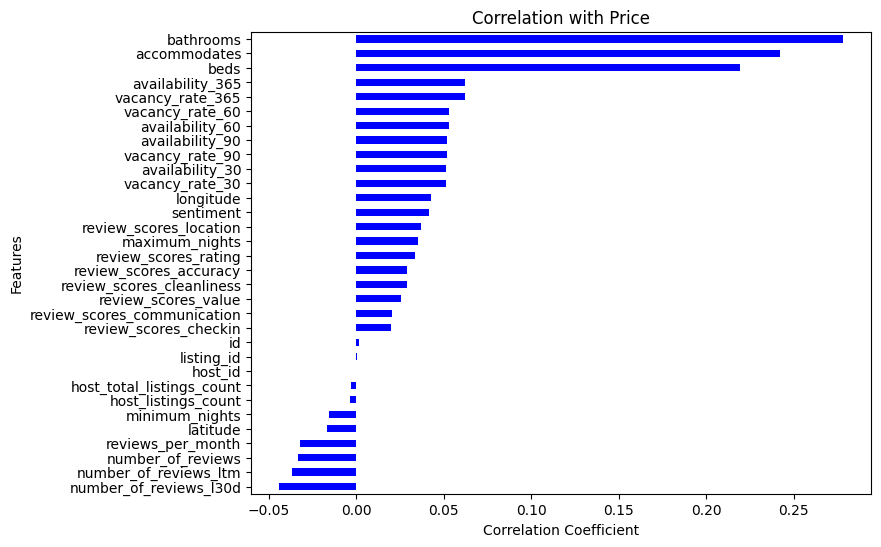

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix for only numeric columns
correlation_matrix = listings_cleaned.select_dtypes(include='number').corr()

# Display the correlation matrix for price with other numerical columns as a bar plot
plt.figure(figsize=(8, 6))
correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='blue')
plt.title('Correlation with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()

In [ ]:
listings_cleaned.head()

,id,host_id,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,bathrooms,vacancy_rate_30,vacancy_rate_60,vacancy_rate_90,vacancy_rate_365,listing_id,sentiment
0,57818,275948,Von Inc,2010-11-01,"Hollywood, FL",within an hour,100%,96%,t,3.0,3.0,t,t,Hollywood,26.01859,-80.12430,Entire home/apt,4,2.0,190.0,32,1125,t,2,2,10,214,58,1,0,2013-01-03,2023-03-31,4.63,4.69,4.61,5.00,4.97,4.88,4.71,0.43,1.0,0.066667,0.033333,0.111111,0.586301,57818.0,0.374216
1,69824,351303,Tracy,2011-01-17,"Silver Spring, MD",within an hour,100%,50%,f,3.0,5.0,t,t,Hallandale Beach,25.97641,-80.12052,Entire home/apt,6,4.0,140.0,30,365,t,19,19,19,281,4,2,0,2021-03-27,2023-06-03,4.00,4.50,4.00,4.75,4.75,5.00,4.50,0.12,2.0,0.633333,0.316667,0.211111,0.769863,69824.0,0.190601
2,83449,454736,"Jon, Mary Pop Apartments",2011-03-21,"Dania Beach, FL",within an hour,100%,97%,f,17.0,20.0,t,t,Dania Beach,26.03392,-80.14201,Entire home/apt,5,3.0,127.0,7,180,t,0,1,1,1,31,9,1,2011-11-01,2023-12-17,4.77,4.87,4.84,4.94,4.90,4.81,4.87,0.21,1.0,0.000000,0.016667,0.011111,0.002740,83449.0,0.392146
3,105411,532930,Sonia,2011-04-25,"Southwest Ranches, FL",within an hour,80%,57%,f,3.0,3.0,t,t,Southwest Ranches,26.04750,-80.36668,Entire home/apt,5,3.0,235.0,4,180,t,24,54,84,359,4,0,0,2012-08-06,2018-03-28,5.00,5.00,5.00,5.00,5.00,4.25,5.00,0.03,2.0,0.800000,0.900000,0.933333,0.983562,105411.0,0.184327
4,129099,637272,Bianca,2011-05-28,"Buenos Aires, Argentina",a few days or more,36%,18%,f,9.0,19.0,t,t,Hollywood,25.99414,-80.11814,Entire home/apt,5,2.0,324.0,20,365,t,6,18,29,304,27,0,0,2011-08-23,2022-07-01,4.29,4.42,4.24,4.44,4.32,4.54,4.08,0.18,1.5,0.200000,0.300000,0.322222,0.832877,129099.0,0.374725


# Reducing More Unecessary Features

There are some features that are capturing the same concepts. We remove those and proceed with splitting our data, and hyper parameter tuning.

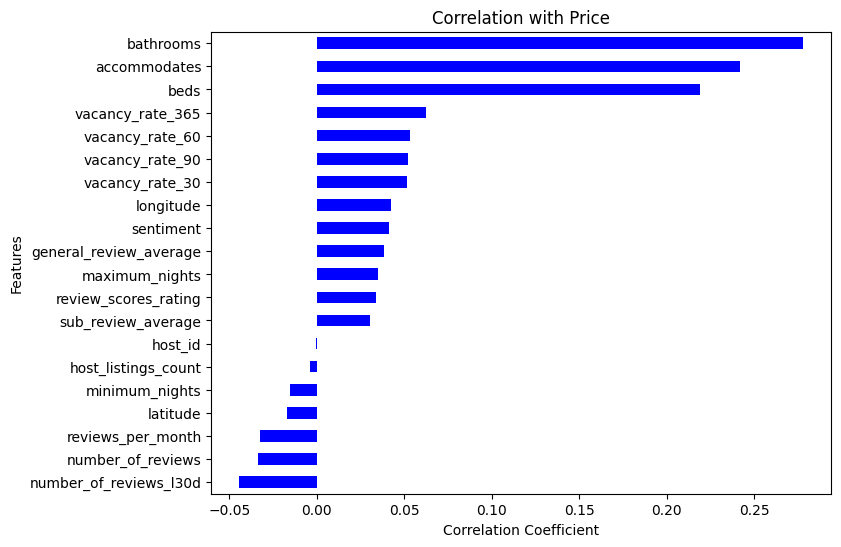

In [ ]:
import pandas as pd

# Calculate the general review average score

# Calculate the average sub-review score
sub_review_columns = [
    'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
    'review_scores_communication', 'review_scores_location', 'review_scores_value'
]
listings_cleaned['sub_review_average'] = listings_cleaned[sub_review_columns].mean(axis=1)

# Drop the individual sub-review score columns
listings_cleaned_reduced = listings_cleaned.drop(columns=sub_review_columns)

# Define columns to remove
columns_to_remove = [
    "id", "listing_id", "host_total_listings_count", "availability_60",
    "availability_30", "availability_90", "availability_365", "number_of_reviews_ltm"
]


# Only drop columns that exist in the DataFrame
existing_columns_to_remove = [col for col in columns_to_remove if col in listings_cleaned.columns]

# Drop the existing columns
listings_cleaned_reduced = listings_cleaned_reduced.drop(columns=existing_columns_to_remove)

# Display the first 5 rows of the modified dataframe
listings_cleaned_reduced.head()

# Calculate the correlation matrix for only numeric columns
correlation_matrix = listings_cleaned_reduced.select_dtypes(include='number').corr()

# Display the correlation matrix for price with other numerical columns as a bar plot
plt.figure(figsize=(8, 6))
correlation_matrix['price'].drop('price').sort_values().plot(kind='barh', color='blue')
plt.title('Correlation with Price')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()


In [ ]:
listings_cleaned_reduced.head()

,host_id,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,beds,price,minimum_nights,maximum_nights,has_availability,number_of_reviews,number_of_reviews_l30d,first_review,last_review,review_scores_rating,reviews_per_month,bathrooms,vacancy_rate_30,vacancy_rate_60,vacancy_rate_90,vacancy_rate_365,sentiment,general_review_average,sub_review_average
0,275948,Von Inc,2010-11-01,"Hollywood, FL",within an hour,100%,96%,t,3.0,t,t,Hollywood,26.01859,-80.12430,Entire home/apt,4,2.0,190.0,32,1125,t,58,0,2013-01-03,2023-03-31,4.63,0.43,1.0,0.066667,0.033333,0.111111,0.586301,0.374216,2.502108,4.810000
1,351303,Tracy,2011-01-17,"Silver Spring, MD",within an hour,100%,50%,f,3.0,t,t,Hallandale Beach,25.97641,-80.12052,Entire home/apt,6,4.0,140.0,30,365,t,4,0,2021-03-27,2023-06-03,4.00,0.12,2.0,0.633333,0.316667,0.211111,0.769863,0.190601,2.095301,4.583333
2,454736,"Jon, Mary Pop Apartments",2011-03-21,"Dania Beach, FL",within an hour,100%,97%,f,17.0,t,t,Dania Beach,26.03392,-80.14201,Entire home/apt,5,3.0,127.0,7,180,t,31,1,2011-11-01,2023-12-17,4.77,0.21,1.0,0.000000,0.016667,0.011111,0.002740,0.392146,2.581073,4.871667
3,532930,Sonia,2011-04-25,"Southwest Ranches, FL",within an hour,80%,57%,f,3.0,t,t,Southwest Ranches,26.04750,-80.36668,Entire home/apt,5,3.0,235.0,4,180,t,4,0,2012-08-06,2018-03-28,5.00,0.03,2.0,0.800000,0.900000,0.933333,0.983562,0.184327,2.592163,4.875000
4,637272,Bianca,2011-05-28,"Buenos Aires, Argentina",a few days or more,36%,18%,f,9.0,t,t,Hollywood,25.99414,-80.11814,Entire home/apt,5,2.0,324.0,20,365,t,27,0,2011-08-23,2022-07-01,4.29,0.18,1.5,0.200000,0.300000,0.322222,0.832877,0.374725,2.332362,4.340000


Training Features Shape: (13965, 30)
Testing Features Shape: (3492, 30)
Training Target Shape: (13965,)
Testing Target Shape: (3492,)

Training Features Sample:
     host_id  host_listings_count  latitude  longitude  accommodates      beds  \
0  1.139072            -0.224458 -0.980623   0.518511     -0.039078  0.029550   
1  1.789502            -0.252884  0.149572  -0.408458     -0.363143  0.029550   
2  0.826688            -0.131429 -0.926276   0.146953     -0.363143  0.029550   
3  0.683562            -0.121093 -1.177086   0.479111      0.284987  0.501257   
4 -0.719624            -0.242547  0.742843   0.854491      0.284987  0.029550   

   minimum_nights  maximum_nights  number_of_reviews  number_of_reviews_l30d  \
0       -0.194779       -0.720659           0.047116               -0.510888   
1       -0.152213       -1.091517          -0.525256               -0.510888   
2       -0.067081       -0.723083          -0.471596                0.952760   
3       -0.152213       -0.2746

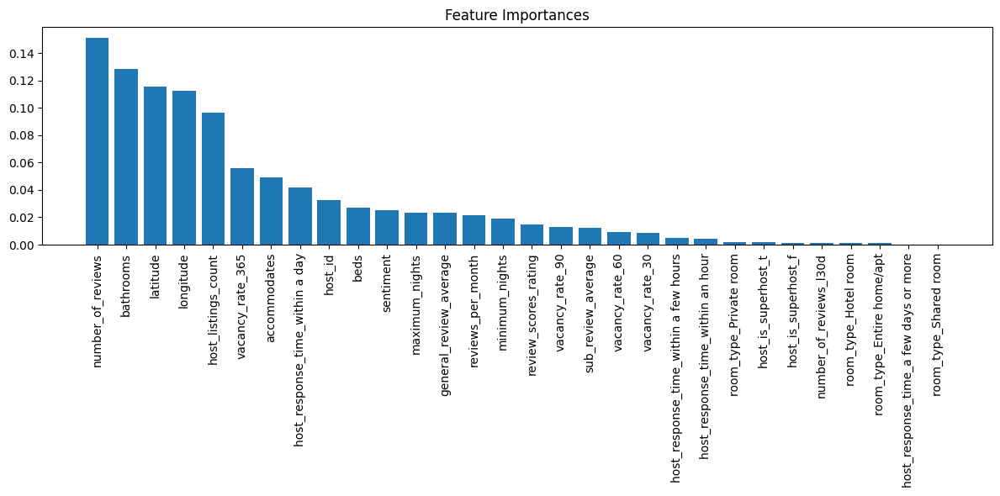

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Define the features and target variable
features = listings_cleaned_reduced.drop(columns=['price'])
target = listings_cleaned_reduced['price']

# Drop rows with NaN values in the target variable
features = features[target.notna()]
target = target.dropna()

# Columns to remove
additional_columns_to_remove = [
    "host_has_profile_pic", "host_identity_verified", "has_availability"
]

# Identify categorical columns with more than 4 unique values and exclude them
categorical_columns = features.select_dtypes(include=[object, 'category']).columns.tolist()
columns_to_exclude = [col for col in categorical_columns if features[col].nunique() > 4]

# Combine additional columns to remove with those to exclude based on unique values
columns_to_exclude.extend(additional_columns_to_remove)

# Keep all numeric columns and only categorical columns with 4 or fewer unique values
filtered_features = features.drop(columns=columns_to_exclude)

# Identify numeric and categorical columns
numeric_features = filtered_features.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = filtered_features.select_dtypes(include=[object, 'category']).columns.tolist()

# Preprocessing for numeric data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(filtered_features, target, test_size=0.2, random_state=42)

# Apply preprocessing
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Extract feature names from the preprocessor
onehot_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features)
all_feature_names = numeric_features + list(onehot_feature_names)

# Display the shape of the split data
print("Training Features Shape:", X_train.shape)
print("Testing Features Shape:", X_test.shape)
print("Training Target Shape:", y_train.shape)
print("Testing Target Shape:", y_test.shape)

print("\nTraining Features Sample:\n", pd.DataFrame(X_train[:5], columns=all_feature_names).head())
print("\nTesting Features Sample:\n", pd.DataFrame(X_test[:5], columns=all_feature_names).head())
print("\nTraining Target Sample:\n", y_train.head())
print("\nTesting Target Sample:\n", y_test.head())

# Train the Random Forest model without hyperparameter tuning
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


# 3) List top three factors that impact the listing price and describe why

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Define the features and target variable
features = listings_cleaned_reduced.drop(columns=['price'])
target = listings_cleaned_reduced['price']

# Drop rows with NaN values in the target variable
features = features[target.notna()]
target = target.dropna()

# Columns to remove
additional_columns_to_remove = [
    "host_has_profile_pic", "host_identity_verified", "has_availability"
]

# Identify categorical columns with more than 4 unique values and exclude them
categorical_columns = features.select_dtypes(include=[object, 'category']).columns.tolist()
columns_to_exclude = [col for col in categorical_columns if features[col].nunique() > 4]

# Combine additional columns to remove with those to exclude based on unique values
columns_to_exclude.extend(additional_columns_to_remove)

# Keep all numeric columns and only categorical columns with 4 or fewer unique values
filtered_features = features.drop(columns=columns_to_exclude)

# Identify numeric and categorical columns
numeric_features = filtered_features.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = filtered_features.select_dtypes(include=[object, 'category']).columns.tolist()

# Preprocessing for numeric data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(filtered_features, target, test_size=0.2, random_state=42)

# Apply preprocessing
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Extract feature names from the preprocessor
onehot_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features)
all_feature_names = numeric_features + list(onehot_feature_names)

# Display the shape of the split data
print("Training Features Shape:", X_train.shape)
print("Testing Features Shape:", X_test.shape)
print("Training Target Shape:", y_train.shape)
print("Testing Target Shape:", y_test.shape)

print("\nTraining Features Sample:\n", pd.DataFrame(X_train[:5], columns=all_feature_names).head())
print("\nTesting Features Sample:\n", pd.DataFrame(X_test[:5], columns=all_feature_names).head())
print("\nTraining Target Sample:\n", y_train.head())
print("\nTesting Target Sample:\n", y_test.head())

Training Features Shape: (13965, 30)
Testing Features Shape: (3492, 30)
Training Target Shape: (13965,)
Testing Target Shape: (3492,)

Training Features Sample:
     host_id  host_listings_count  latitude  longitude  accommodates      beds  \
0  1.139072            -0.224458 -0.980623   0.518511     -0.039078  0.029550   
1  1.789502            -0.252884  0.149572  -0.408458     -0.363143  0.029550   
2  0.826688            -0.131429 -0.926276   0.146953     -0.363143  0.029550   
3  0.683562            -0.121093 -1.177086   0.479111      0.284987  0.501257   
4 -0.719624            -0.242547  0.742843   0.854491      0.284987  0.029550   

   minimum_nights  maximum_nights  number_of_reviews  number_of_reviews_l30d  \
0       -0.194779       -0.720659           0.047116               -0.510888   
1       -0.152213       -1.091517          -0.525256               -0.510888   
2       -0.067081       -0.723083          -0.471596                0.952760   
3       -0.152213       -0.2746

# Random Forest without Hyperparameter Tuning

Random Forest MSE: 491244.44199023425
Random Forest RMSE: 700.8883234797354
Random Forest MAE: 164.5717002672776
Random Forest R^2: -0.38570004084914533


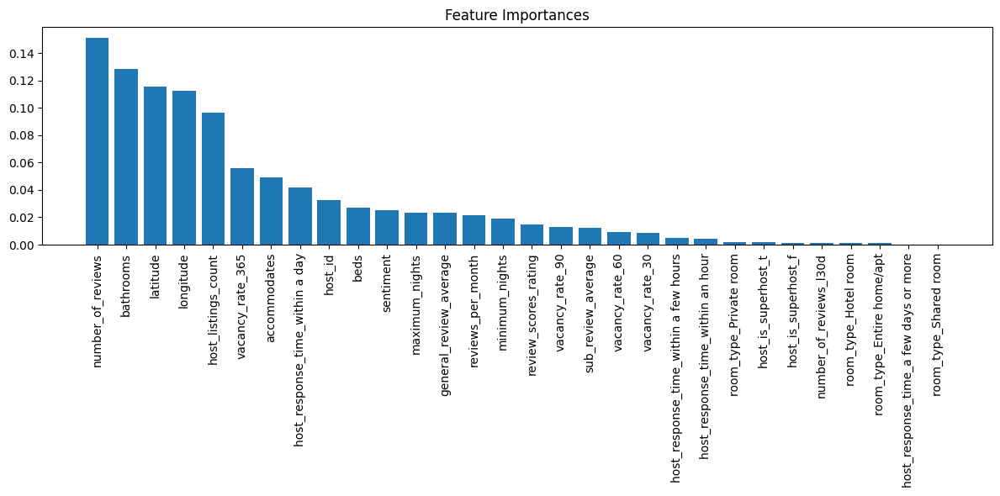

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Train the Random Forest model without hyperparameter tuning
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


# Neural Network without Hyperparameter Tuning

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define the Neural Network model
def create_model():
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Create the model
nn_model = create_model()

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network MSE: {mse_nn}')
print(f'Neural Network RMSE: {rmse_nn}')
print(f'Neural Network MAE: {mae_nn}')
print(f'Neural Network R^2: {r2_nn}')


Epoch 1/50
350/350 [==============================] - 4s 4ms/step - loss: 1320716.0000 - mae: 285.5612 - val_loss: 272632.5938 - val_mae: 187.0339
Epoch 2/50
350/350 [==============================] - 1s 3ms/step - loss: 1185846.2500 - mae: 198.2607 - val_loss: 255263.0312 - val_mae: 190.4048
Epoch 3/50
350/350 [==============================] - 1s 4ms/step - loss: 1177229.0000 - mae: 193.1123 - val_loss: 251117.2031 - val_mae: 182.8873
Epoch 4/50
350/350 [==============================] - 2s 4ms/step - loss: 1172637.5000 - mae: 192.0401 - val_loss: 248530.0156 - val_mae: 194.0719
Epoch 5/50
350/350 [==============================] - 2s 7ms/step - loss: 1169060.1250 - mae: 196.7843 - val_loss: 245145.2031 - val_mae: 181.8750
Epoch 6/50
350/350 [==============================] - 2s 5ms/step - loss: 1165961.3750 - mae: 190.0186 - val_loss: 242929.6562 - val_mae: 186.8100
Epoch 7/50
350/350 [==============================] - 1s 3ms/step - loss: 1163379.6250 - mae: 192.5136 - val_loss: 240

# Random Forest with Hyperparameter Tuning using Optuna
[link text](https:// [link text](https://))

# *Both*

In [ ]:
!pip install -q tensorflow keras scikit-learn


In [ ]:
!pip install -q tensorflow==2.12.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 92.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 75.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 107.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 47.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.
tf-keras 2.15.1 requires tensorflow<2.16,>=2.15, but you have tensorflow 2.12.0 which is incompatible.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, median_absolute_error
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

# Define the features and target variable
features = listings_cleaned_reduced.drop(columns=['price'])
target = listings_cleaned_reduced['price']

# Drop rows with NaN values in the target variable
features = features[target.notna()]
target = target.dropna()

# Columns to remove
additional_columns_to_remove = ["host_has_profile_pic", "host_identity_verified", "has_availability"]

# Identify categorical columns with more than 4 unique values and exclude them
categorical_columns = features.select_dtypes(include=[object, 'category']).columns.tolist()
columns_to_exclude = [col for col in categorical_columns if features[col].nunique() > 4]
columns_to_exclude.extend(additional_columns_to_remove)

# Keep all numeric columns and only categorical columns with 4 or fewer unique values
filtered_features = features.drop(columns=columns_to_exclude)

# Identify numeric and categorical columns
numeric_features = filtered_features.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = filtered_features.select_dtypes(include=[object, 'category']).columns.tolist()

# Preprocessing for numeric data
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features),
    ('cat', categorical_transformer, categorical_features)
])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(filtered_features, target, test_size=0.2, random_state=42)

# Apply preprocessing
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Extract feature names from the preprocessor
onehot_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features)
all_feature_names = numeric_features + list(onehot_feature_names)

# Display the shape of the split data
print("Training Features Shape:", X_train.shape)
print("Testing Features Shape:", X_test.shape)
print("Training Target Shape:", y_train.shape)
print("Testing Target Shape:", y_test.shape)

print("\nTraining Features Sample:\n", pd.DataFrame(X_train[:5], columns=all_feature_names).head())
print("\nTesting Features Sample:\n", pd.DataFrame(X_test[:5], columns=all_feature_names).head())
print("\nTraining Target Sample:\n", y_train.head())
print("\nTesting Target Sample:\n", y_test.head())

# Random Forest
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()

# Neural Network
def create_model():
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

nn_model = create_model()
nn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)
y_pred_nn = nn_model.predict(X_test)
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)
print(f'Neural Network MSE: {mse_nn}')
print(f'Neural Network RMSE: {rmse_nn}')
print(f'Neural Network MAE: {mae_nn}')
print(f'Neural Network R^2: {r2_nn}')

# Additional metrics
mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
mape_nn = mean_absolute_percentage_error(y_test, y_pred_nn)
medae_rf = median_absolute_error(y_test, y_pred_rf)
medae_nn = median_absolute_error(y_test, y_pred_nn)
n_test = X_test.shape[0]
p_test = X_test.shape[1]
adj_r2_rf = adjusted_r2_score(r2_rf, n_test, p_test)
adj_r2_nn = adjusted_r2_score(r2_nn, n_test, p_test)
print(f'Random Forest MAPE: {mape_rf}')
print(f'Random Forest MedAE: {medae_rf}')
print(f'Random Forest Adjusted R²: {adj_r2_rf}')
print(f'Neural Network MAPE: {mape_nn}')
print(f'Neural Network MedAE: {medae_nn}')
print(f'Neural Network Adjusted R²: {adj_r2_nn}')

# Cross-validation scores
rf_cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
rf_cv_rmse = np.sqrt(-rf_cv_scores.mean())
nn_model_cv = KerasRegressor(build_fn=create_model, epochs=50, batch_size=32, verbose=0)
nn_cv_scores = cross_val_score(nn_model_cv, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
nn_cv_rmse = np.sqrt(-nn_cv_scores.mean())
print(f'Random Forest Cross-Validation RMSE: {rf_cv_rmse}')
print(f'Neural Network Cross-Validation RMSE: {nn_cv_rmse}')

# Plot residuals
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_test - y_pred_rf, alpha=0.5, label='Random Forest')
plt.scatter(y_test, y_test - y_pred_nn, alpha=0.5, label='Neural Network')
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Actual values')
plt.ylabel('Residuals')
plt.legend()
plt.show()

# Plot prediction errors
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf, alpha=0.5, label='Random Forest')
plt.scatter(y_test, y_pred_nn, alpha=0.5, label='Neural Network')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.legend()
plt.show()


Training Features Shape: (13965, 32)
Testing Features Shape: (3492, 32)
Training Target Shape: (13965,)
Testing Target Shape: (3492,)

Training Features Sample:
     host_id  host_listings_count  latitude  longitude  accommodates      beds  \
0  1.139072            -0.224426 -0.980623   0.518511     -0.039078  0.029333   
1  1.789502            -0.252848  0.149572  -0.408458     -0.363143  0.029333   
2  0.826688            -0.131410 -0.926276   0.146953     -0.363143  0.029333   
3  0.683562            -0.121075 -1.177086   0.479111      0.284987  0.497564   
4 -0.719624            -0.242513  0.742843   0.854491      0.284987  0.029333   

   minimum_nights  maximum_nights  number_of_reviews  number_of_reviews_l30d  \
0       -0.194779       -0.720659           0.047116               -0.510888   
1       -0.152213       -1.091517          -0.525256               -0.510888   
2       -0.067081       -0.723083          -0.471596                0.952760   
3       -0.152213       -0.2746

ValueError: Input X contains NaN.
RandomForestRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [ ]:
# !pip install -q tensorflow-addons

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, median_absolute_error
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import cross_val_score
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

# Define the features and target variable
features = listings_cleaned_reduced.drop(columns=['price'])
target = listings_cleaned_reduced['price']

# Drop rows with NaN values in the target variable
features = features[target.notna()]
target = target.dropna()

# Columns to remove
additional_columns_to_remove = ["host_has_profile_pic", "host_identity_verified", "has_availability"]

# Identify categorical columns with more than 4 unique values and exclude them
categorical_columns = features.select_dtypes(include=[object, 'category']).columns.tolist()
columns_to_exclude = [col for col in categorical_columns if features[col].nunique() > 4]
columns_to_exclude.extend(additional_columns_to_remove)

# Keep all numeric columns and only categorical columns with 4 or fewer unique values
filtered_features = features.drop(columns=columns_to_exclude)

# Identify numeric and categorical columns
numeric_features = filtered_features.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = filtered_features.select_dtypes(include=[object, 'category']).columns.tolist()

# Preprocessing for numeric data
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features),
    ('cat', categorical_transformer, categorical_features)
])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(filtered_features, target, test_size=0.2, random_state=42)

# Apply preprocessing
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Extract feature names from the preprocessor
onehot_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features)
all_feature_names = numeric_features + list(onehot_feature_names)

# Display the shape of the split data
print("Training Features Shape:", X_train.shape)
print("Testing Features Shape:", X_test.shape)
print("Training Target Shape:", y_train.shape)
print("Testing Target Shape:", y_test.shape)

print("\nTraining Features Sample:\n", pd.DataFrame(X_train[:5], columns=all_feature_names).head())
print("\nTesting Features Sample:\n", pd.DataFrame(X_test[:5], columns=all_feature_names).head())
print("\nTraining Target Sample:\n", y_train.head())
print("\nTesting Target Sample:\n", y_test.head())

# Random Forest
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()

# Neural Network
def create_model():
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

nn_model = create_model()
nn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)
y_pred_nn = nn_model.predict(X_test)
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)
print(f'Neural Network MSE: {mse_nn}')
print(f'Neural Network RMSE: {rmse_nn}')
print(f'Neural Network MAE: {mae_nn}')
print(f'Neural Network R^2: {r2_nn}')

# Additional metrics
mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
mape_nn = mean_absolute_percentage_error(y_test, y_pred_nn)
medae_rf = median_absolute_error(y_test, y_pred_rf)
medae_nn = median_absolute_error(y_test, y_pred_nn)
n_test = X_test.shape[0]
p_test = X_test.shape[1]
adj_r2_rf = adjusted_r2_score(r2_rf, n_test, p_test)
adj_r2_nn = adjusted_r2_score(r2_nn, n_test, p_test)
print(f'Random Forest MAPE: {mape_rf}')
print(f'Random Forest MedAE: {medae_rf}')
print(f'Random Forest Adjusted R²: {adj_r2_rf}')
print(f'Neural Network MAPE: {mape_nn}')
print(f'Neural Network MedAE: {medae_nn}')
print(f'Neural Network Adjusted R²: {adj_r2_nn}')

# Cross-validation scores
rf_cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
rf_cv_rmse = np.sqrt(-rf_cv_scores.mean())
nn_model_cv = KerasRegressor(build_fn=create_model, epochs=50, batch_size=32, verbose=0)
nn_cv_scores = cross_val_score(nn_model_cv, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
nn_cv_rmse = np.sqrt(-nn_cv_scores.mean())
print(f'Random Forest Cross-Validation RMSE: {rf_cv_rmse}')
print(f'Neural Network Cross-Validation RMSE: {nn_cv_rmse}')

# Plot residuals
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_test - y_pred_rf, alpha=0.5, label='Random Forest')
plt.scatter(y_test, y_test - y_pred_nn, alpha=0.5, label='Neural Network')
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Actual values')
plt.ylabel('Residuals')
plt.legend()
plt.show()

# Plot prediction errors
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf, alpha=0.5, label='Random Forest')
plt.scatter(y_test, y_pred_nn, alpha=0.5, label='Neural Network')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.legend()
plt.show()


ModuleNotFoundError: No module named 'tensorflow.keras.wrappers'

In [ ]:
# Mean Absolute Percentage Error
mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
mape_nn = mean_absolute_percentage_error(y_test, y_pred_nn)

# Median Absolute Error
medae_rf = median_absolute_error(y_test, y_pred_rf)
medae_nn = median_absolute_error(y_test, y_pred_nn)

# Adjusted R² Score
n_test = X_test.shape[0]
p_test = X_test.shape[1]
adj_r2_rf = adjusted_r2_score(r2_rf, n_test, p_test)
adj_r2_nn = adjusted_r2_score(r2_nn, n_test, p_test)

# Display additional metrics
print(f'Random Forest MAPE: {mape_rf}')
print(f'Random Forest MedAE: {medae_rf}')
print(f'Random Forest Adjusted R²: {adj_r2_rf}')

print(f'Neural Network MAPE: {mape_nn}')
print(f'Neural Network MedAE: {medae_nn}')
print(f'Neural Network Adjusted R²: {adj_r2_nn}')

# Cross-validation scores
print(f'Random Forest Cross-Validation RMSE: {rf_cv_rmse}')
print(f'Neural Network Cross-Validation RMSE: {nn_cv_rmse}')

# Plot residuals and prediction errors
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_test - y_pred_rf, alpha=0.5, label='Random Forest')
plt.scatter(y_test, y_test - y_pred_nn, alpha=0.5, label='Neural Network')
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Actual values')
plt.ylabel('Residuals')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_rf, alpha=0.5, label='Random Forest')
plt.scatter(y_test, y_pred_nn, alpha=0.5, label='Neural Network')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.legend()
plt.show()


NameError: name 'mean_absolute_percentage_error' is not defined

# Random Forest with Hyperparameter Tuning using Optuna

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score

def objective_rf(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 500)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)

    rf_model = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42,
        n_jobs=-1
    )

    scores = cross_val_score(rf_model, X_train, y_train, cv=3, scoring='neg_mean_squared_error')
    return -scores.mean()

study_rf = optuna.create_study(direction='minimize')
study_rf.optimize(objective_rf, n_trials=50)

print('Best hyperparameters for Random Forest:', study_rf.best_params)

# Train the Random Forest model with tuned hyperparameters
best_rf_model = RandomForestRegressor(
    **study_rf.best_params,
    random_state=42,
    n_jobs=-1
)
best_rf_model.fit(X_train, y_train)

# Make predictions
y_pred_best_rf = best_rf_model.predict(X_test)

# Evaluate the model
mse_best_rf = mean_squared_error(y_test, y_pred_best_rf)
rmse_best_rf = np.sqrt(mse_best_rf)
mae_best_rf = mean_absolute_error(y_test, y_pred_best_rf)
r2_best_rf = r2_score(y_test, y_pred_best_rf)

print(f'Tuned Random Forest MSE: {mse_best_rf}')
print(f'Tuned Random Forest RMSE: {rmse_best_rf}')
print(f'Tuned Random Forest MAE: {mae_best_rf}')
print(f'Tuned Random Forest R^2: {r2_best_rf}')


In [ ]:
%pip install -q scikit-learn tensorflow optuna shap


import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import optuna
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import shap

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)




[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


## Step 2: Data Preparation
Ensure the data is ready for model training. Handle any missing values, encode categorical variables, and split the data into training and testing sets.

In [ ]:
listings_cleaned_reduced.head()

,host_id,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,beds,price,minimum_nights,maximum_nights,has_availability,number_of_reviews,number_of_reviews_l30d,first_review,last_review,review_scores_rating,reviews_per_month,bathrooms,vacancy_rate_30,vacancy_rate_60,vacancy_rate_90,vacancy_rate_365,sentiment,general_review_average,sub_review_average
0,275948,Von Inc,2010-11-01,"Hollywood, FL",within an hour,100%,96%,t,3.0,t,t,Hollywood,26.01859,-80.12430,Entire home/apt,4,2.0,190.0,32,1125,t,58,0,2013-01-03,2023-03-31,4.63,0.43,1.0,0.066667,0.033333,0.111111,0.586301,0.374216,2.502108,4.810000
1,351303,Tracy,2011-01-17,"Silver Spring, MD",within an hour,100%,50%,f,3.0,t,t,Hallandale Beach,25.97641,-80.12052,Entire home/apt,6,4.0,140.0,30,365,t,4,0,2021-03-27,2023-06-03,4.00,0.12,2.0,0.633333,0.316667,0.211111,0.769863,0.190601,2.095301,4.583333
2,454736,"Jon, Mary Pop Apartments",2011-03-21,"Dania Beach, FL",within an hour,100%,97%,f,17.0,t,t,Dania Beach,26.03392,-80.14201,Entire home/apt,5,3.0,127.0,7,180,t,31,1,2011-11-01,2023-12-17,4.77,0.21,1.0,0.000000,0.016667,0.011111,0.002740,0.392146,2.581073,4.871667
3,532930,Sonia,2011-04-25,"Southwest Ranches, FL",within an hour,80%,57%,f,3.0,t,t,Southwest Ranches,26.04750,-80.36668,Entire home/apt,5,3.0,235.0,4,180,t,4,0,2012-08-06,2018-03-28,5.00,0.03,2.0,0.800000,0.900000,0.933333,0.983562,0.184327,2.592163,4.875000
4,637272,Bianca,2011-05-28,"Buenos Aires, Argentina",a few days or more,36%,18%,f,9.0,t,t,Hollywood,25.99414,-80.11814,Entire home/apt,5,2.0,324.0,20,365,t,27,0,2011-08-23,2022-07-01,4.29,0.18,1.5,0.200000,0.300000,0.322222,0.832877,0.374725,2.332362,4.340000


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Define the features and target variable
features = listings_cleaned_reduced.drop(columns=['price'])
target = listings_cleaned_reduced['price']

# Drop rows with NaN values in the target variable
features = features[target.notna()]
target = target.dropna()

# Columns to remove
additional_columns_to_remove = [
    "host_has_profile_pic", "host_identity_verified", "has_availability"
]

# Identify categorical columns with more than 4 unique values and exclude them
categorical_columns = features.select_dtypes(include=[object, 'category']).columns.tolist()
columns_to_exclude = [col for col in categorical_columns if features[col].nunique() > 4]

# Combine additional columns to remove with those to exclude based on unique values
columns_to_exclude.extend(additional_columns_to_remove)

# Keep all numeric columns and only categorical columns with 4 or fewer unique values
filtered_features = features.drop(columns=columns_to_exclude)

# Identify numeric and categorical columns
numeric_features = filtered_features.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = filtered_features.select_dtypes(include=[object, 'category']).columns.tolist()

# Preprocessing for numeric data
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(filtered_features, target, test_size=0.2, random_state=42)

# Apply preprocessing
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Extract feature names from the preprocessor
onehot_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features)
all_feature_names = numeric_features + list(onehot_feature_names)

# Display the shape of the split data
print("Training Features Shape:", X_train.shape)
print("Testing Features Shape:", X_test.shape)
print("Training Target Shape:", y_train.shape)
print("Testing Target Shape:", y_test.shape)

print("\nTraining Features Sample:\n", pd.DataFrame(X_train[:5], columns=all_feature_names).head())
print("\nTesting Features Sample:\n", pd.DataFrame(X_test[:5], columns=all_feature_names).head())
print("\nTraining Target Sample:\n", y_train.head())
print("\nTesting Target Sample:\n", y_test.head())

# Train the Random Forest model without hyperparameter tuning
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


Training Features Shape: (13965, 32)
Testing Features Shape: (3492, 32)
Training Target Shape: (13965,)
Testing Target Shape: (3492,)

Training Features Sample:
     host_id  host_listings_count  latitude  longitude  accommodates      beds  \
0  1.139072            -0.224426 -0.980623   0.518511     -0.039078  0.029333   
1  1.789502            -0.252848  0.149572  -0.408458     -0.363143  0.029333   
2  0.826688            -0.131410 -0.926276   0.146953     -0.363143  0.029333   
3  0.683562            -0.121075 -1.177086   0.479111      0.284987  0.497564   
4 -0.719624            -0.242513  0.742843   0.854491      0.284987  0.029333   

   minimum_nights  maximum_nights  number_of_reviews  number_of_reviews_l30d  \
0       -0.194779       -0.720659           0.047116               -0.510888   
1       -0.152213       -1.091517          -0.525256               -0.510888   
2       -0.067081       -0.723083          -0.471596                0.952760   
3       -0.152213       -0.2746

ValueError: Input X contains NaN.
RandomForestRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

#  Random Forest without Hyperparameter Tuning

Random Forest MSE: 746920.810614047
Random Forest RMSE: 864.2458045105263
Random Forest MAE: 165.62017405771016
Random Forest R^2: -1.1069107542178305


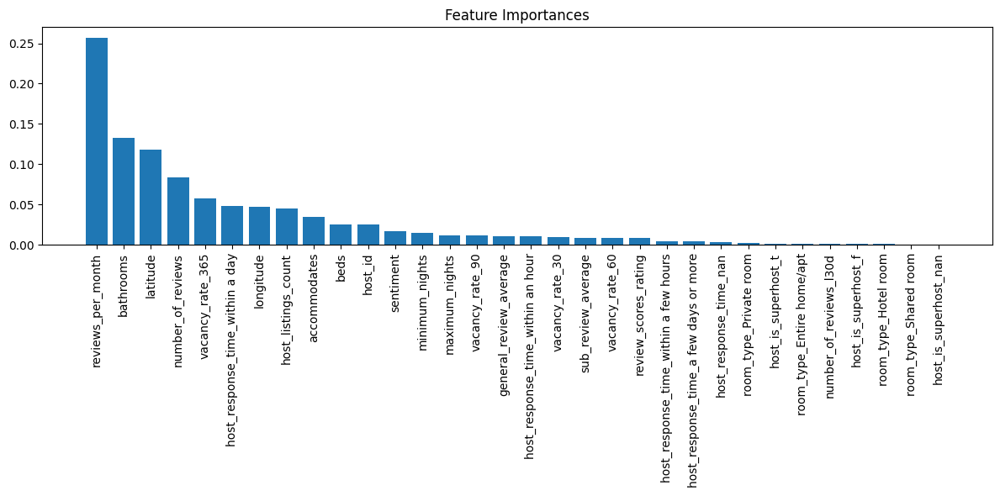

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Train the Random Forest model without hyperparameter tuning
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [all_feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


# Neural Network without Hyperparameter Tuning

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define the Neural Network model
def create_model():
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Create the model
nn_model = create_model()

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network MSE: {mse_nn}')
print(f'Neural Network RMSE: {rmse_nn}')
print(f'Neural Network MAE: {mae_nn}')
print(f'Neural Network R^2: {r2_nn}')


Epoch 1/50


/opt/homebrew/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## Step 3: Random Forest Model
Train a Random Forest model and evaluate its performance.

Random Forest MSE: 351008.5367241138
Random Forest RMSE: 592.459734263953
Random Forest MAE: 253.50390957160963
Random Forest R^2: 0.009876749533437978


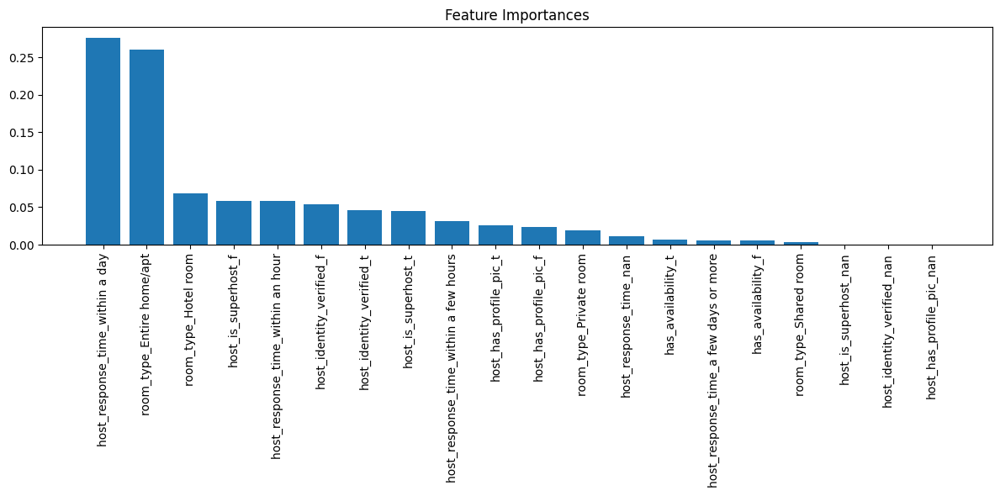

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Train the Random Forest model without hyperparameter tuning
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MSE: {mse_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest R^2: {r2_rf}')

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]
feature_names = numeric_features + list(preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features))

plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), [feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()


## Step 4: Neural Network Model
Train a Neural Network model and evaluate its performance.

In [ ]:
%pip install -q tensorflow-macos tensorflow-metal

In [ ]:
# Define the Neural Network model
def create_model():
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Create the model
nn_model = create_model()

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network MSE: {mse_nn}')
print(f'Neural Network RMSE: {rmse_nn}')
print(f'Neural Network MAE: {mae_nn}')
print(f'Neural Network R^2: {r2_nn}')
